# PROJECT PPT-
CANVA LINK:-https://www.canva.com/design/DAGwssd8ui8/Tqx91p-C4KMAbi9IHHyUnw/edit?utm_content=DAGwssd8ui8&utm_campaign=designshare&utm_medium=link2&utm_source=sharebutton

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


Libraries

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split



In [ ]:
import pandas as pd
# Update the path to where your file is located in Google Drive
df=pd.read_csv('/content/bank-full.csv',sep=';')
df

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


# **DATA PRE-PROCESSING**

In [ ]:
df['pdays'].unique()

array([ -1, 151, 166,  91,  86, 143, 147,  89, 140, 176, 101, 174, 170,
       167, 195, 165, 129, 188, 196, 172, 118, 119, 104, 171, 117, 164,
       132, 131, 123, 159, 186, 111, 115, 116, 173, 178, 110, 152,  96,
       103, 150, 175, 193, 181, 185, 154, 145, 138, 126, 180, 109, 158,
       168,  97, 182, 127, 130, 194, 125, 105, 102,  26, 179,  28, 183,
       155, 112, 120, 137, 124, 187, 190, 113, 162, 134, 169, 189,   8,
       144, 191, 184, 177,   5,  99, 133,  93,  92,  10, 100, 156, 198,
       106, 153, 146, 128,   7, 121, 160, 107,  90,  27, 197, 136, 139,
       122, 157, 149, 135,  30, 114,  98, 192, 163,  34,  95, 141,  31,
       199,  94, 108,  29, 268, 247, 253, 226, 244, 239, 245, 204, 231,
       238, 258, 230, 254, 265,  71, 223, 246, 250, 266, 240, 205, 261,
       259, 241, 260, 234, 251, 225, 161, 237, 262, 248, 255, 220, 227,
       206, 224, 249, 235, 228, 263,   2, 270, 232, 252, 207, 200, 269,
       233, 256, 273, 272, 242, 264, 208, 214, 222, 271, 203, 22

In [ ]:
df['previous'].unique()

array([  0,   3,   1,   4,   2,  11,  16,   6,   5,  10,  12,   7,  18,
         9,  21,   8,  14,  15,  26,  37,  13,  25,  20,  27,  17,  23,
        38,  29,  24,  51, 275,  22,  19,  30,  58,  28,  32,  40,  55,
        35,  41])

In [ ]:
df['default'].unique()

array(['no', 'yes'], dtype=object)

In [ ]:
df['housing'].unique()

array(['yes', 'no'], dtype=object)

In [ ]:
df['loan'].unique()

array(['no', 'yes'], dtype=object)

In [ ]:
df['default']=df['default'].map({'no':0,'yes':1})
df['default'].unique()

array([0, 1])

In [ ]:
df['housing']=df['housing'].map({'no':0,'yes':1})
df['housing'].unique()

array([1, 0])

In [ ]:
df['loan']=df['loan'].map({'no':0,'yes':1})
df['loan'].unique()

array([0, 1])

In [ ]:
df['y'] = df['y'].map({'yes': 1, 'no': 0})
df['y'].unique()

array([0, 1])

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  int64 
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  int64 
 7   loan       45211 non-null  int64 
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  int64 
dtypes: int64(11), object(6)
memory usage: 5.9+ MB


In [ ]:
df.isnull().sum()

,0
age,0
job,0
marital,0
education,0
default,0
balance,0
housing,0
loan,0
contact,0
day,0


In [ ]:
df.describe()

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,y
count,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000,45211.000000
mean,40.936210,0.018027,1362.272058,0.555838,0.160226,15.806419,258.163080,2.763841,40.197828,0.580323,0.116985
std,10.618762,0.133049,3044.765829,0.496878,0.366820,8.322476,257.527812,3.098021,100.128746,2.303441,0.321406
min,18.000000,0.000000,-8019.000000,0.000000,0.000000,1.000000,0.000000,1.000000,-1.000000,0.000000,0.000000
25%,33.000000,0.000000,72.000000,0.000000,0.000000,8.000000,103.000000,1.000000,-1.000000,0.000000,0.000000
50%,39.000000,0.000000,448.000000,1.000000,0.000000,16.000000,180.000000,2.000000,-1.000000,0.000000,0.000000
75%,48.000000,0.000000,1428.000000,1.000000,0.000000,21.000000,319.000000,3.000000,-1.000000,0.000000,0.000000
max,95.000000,1.000000,102127.000000,1.000000,1.000000,31.000000,4918.000000,63.000000,871.000000,275.000000,1.000000


In [ ]:
df.shape

(45211, 17)

In [ ]:
df.duplicated().sum()

np.int64(0)

In [ ]:
df['job'].unique()

array(['management', 'technician', 'entrepreneur', 'blue-collar',
       'unknown', 'retired', 'admin.', 'services', 'self-employed',
       'unemployed', 'housemaid', 'student'], dtype=object)

In [ ]:
df['poutcome'].unique()

array(['unknown', 'failure', 'other', 'success'], dtype=object)

In [ ]:
# Count 'unknown' values in each column
unknown_counts = (df== 'unknown').sum()

print("Count of 'unknown' values per column:")
print(unknown_counts)

Count of 'unknown' values per column:
age              0
job            288
marital          0
education     1857
default          0
balance          0
housing          0
loan             0
contact      13020
day              0
month            0
duration         0
campaign         0
pdays            0
previous         0
poutcome     36959
y                0
dtype: int64


In [ ]:
%matplotlib inline
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  int64 
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  int64 
 7   loan       45211 non-null  int64 
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  int64 
dtypes: int64(11), object(6)
memory usage: 5.9+ MB


In [ ]:
print(df.nunique(),"\t",df.info())

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 17 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   age        45211 non-null  int64 
 1   job        45211 non-null  object
 2   marital    45211 non-null  object
 3   education  45211 non-null  object
 4   default    45211 non-null  int64 
 5   balance    45211 non-null  int64 
 6   housing    45211 non-null  int64 
 7   loan       45211 non-null  int64 
 8   contact    45211 non-null  object
 9   day        45211 non-null  int64 
 10  month      45211 non-null  object
 11  duration   45211 non-null  int64 
 12  campaign   45211 non-null  int64 
 13  pdays      45211 non-null  int64 
 14  previous   45211 non-null  int64 
 15  poutcome   45211 non-null  object
 16  y          45211 non-null  int64 
dtypes: int64(11), object(6)
memory usage: 5.9+ MB
age            77
job            12
marital         3
education       4
default         2
balance  

In [ ]:
# prompt: dummify the object columns and covert them to int or float

import pandas as pd
# Dummify object columns and convert to int or float
for col in df.columns:
  if df[col].dtype == 'object':
    # Create dummy variables
    dummies = pd.get_dummies(df[col], prefix=col)
    # Concatenate dummies to the original dataframe and drop the original column
    df = pd.concat([df, dummies], axis=1)
    df = df.drop(col, axis=1)

# Convert all columns to numeric, coercing errors to NaN
for col in df.columns:
  df[col] = pd.to_numeric(df[col], errors='coerce')

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 49 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   age                  45211 non-null  int64
 1   default              45211 non-null  int64
 2   balance              45211 non-null  int64
 3   housing              45211 non-null  int64
 4   loan                 45211 non-null  int64
 5   day                  45211 non-null  int64
 6   duration             45211 non-null  int64
 7   campaign             45211 non-null  int64
 8   pdays                45211 non-null  int64
 9   previous             45211 non-null  int64
 10  y                    45211 non-null  int64
 11  job_admin.           45211 non-null  bool 
 12  job_blue-collar      45211 non-null  bool 
 13  job_entrepreneur     45211 non-null  bool 
 14  job_housemaid        45211 non-null  bool 
 15  job_management       45211 non-null  bool 
 16  job_retired          4

In [ ]:
df.head()

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,False,False,True,False,False,False,False,False,False,True
1,44,0,29,1,0,5,151,1,-1,0,...,False,False,True,False,False,False,False,False,False,True
2,33,0,2,1,1,5,76,1,-1,0,...,False,False,True,False,False,False,False,False,False,True
3,47,0,1506,1,0,5,92,1,-1,0,...,False,False,True,False,False,False,False,False,False,True
4,33,0,1,0,0,5,198,1,-1,0,...,False,False,True,False,False,False,False,False,False,True


In [ ]:
df.pdays.unique()

array([ -1, 151, 166,  91,  86, 143, 147,  89, 140, 176, 101, 174, 170,
       167, 195, 165, 129, 188, 196, 172, 118, 119, 104, 171, 117, 164,
       132, 131, 123, 159, 186, 111, 115, 116, 173, 178, 110, 152,  96,
       103, 150, 175, 193, 181, 185, 154, 145, 138, 126, 180, 109, 158,
       168,  97, 182, 127, 130, 194, 125, 105, 102,  26, 179,  28, 183,
       155, 112, 120, 137, 124, 187, 190, 113, 162, 134, 169, 189,   8,
       144, 191, 184, 177,   5,  99, 133,  93,  92,  10, 100, 156, 198,
       106, 153, 146, 128,   7, 121, 160, 107,  90,  27, 197, 136, 139,
       122, 157, 149, 135,  30, 114,  98, 192, 163,  34,  95, 141,  31,
       199,  94, 108,  29, 268, 247, 253, 226, 244, 239, 245, 204, 231,
       238, 258, 230, 254, 265,  71, 223, 246, 250, 266, 240, 205, 261,
       259, 241, 260, 234, 251, 225, 161, 237, 262, 248, 255, 220, 227,
       206, 224, 249, 235, 228, 263,   2, 270, 232, 252, 207, 200, 269,
       233, 256, 273, 272, 242, 264, 208, 214, 222, 271, 203, 22

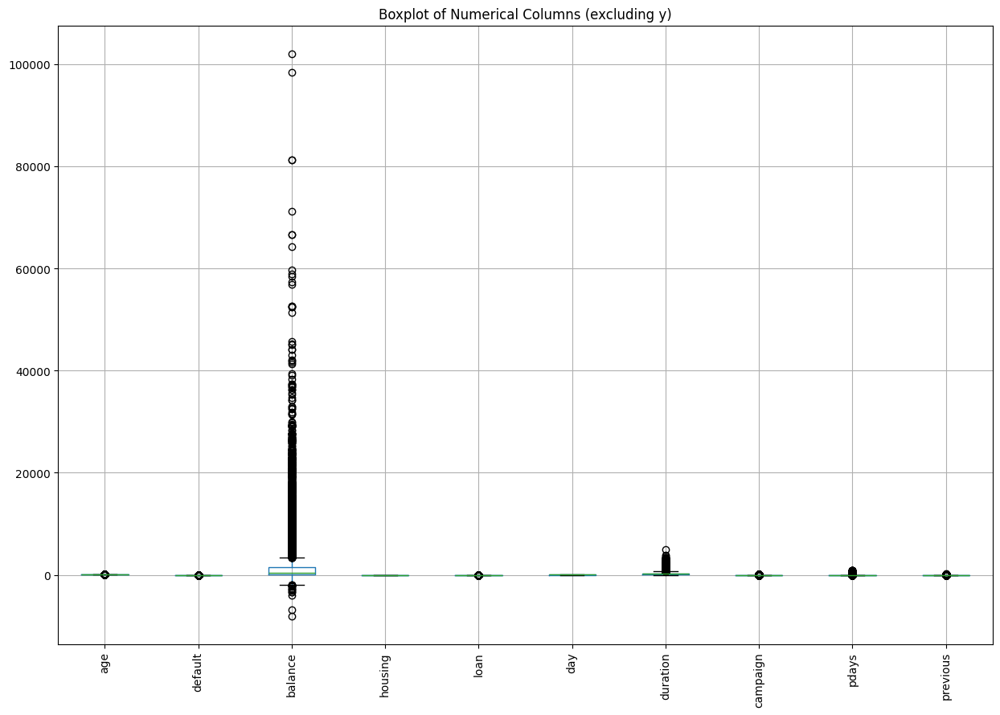

In [ ]:
numerical_cols = df.select_dtypes(include=['int64', 'float64']).columns.tolist()
numerical_cols.remove('y')

plt.figure(figsize=(15, 10))
df[numerical_cols].boxplot()
plt.title('Boxplot of Numerical Columns (excluding y)')
plt.xticks(rotation=90)
plt.show()

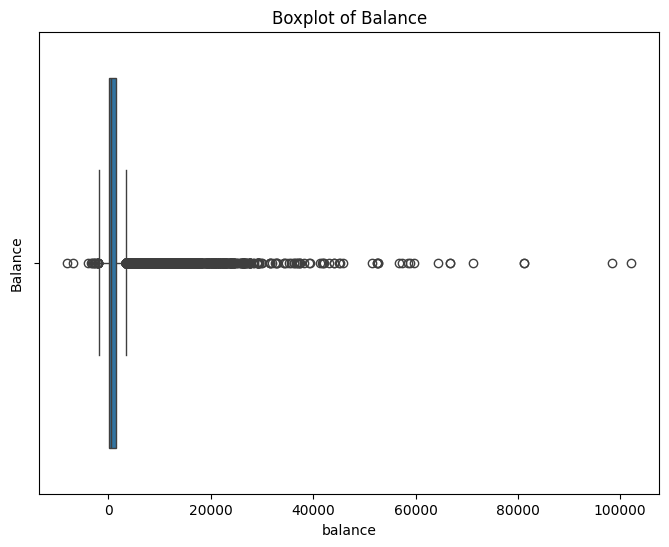

In [ ]:
#plot the outliers for col-balance

plt.figure(figsize=(8, 6))
sns.boxplot(x=df['balance'])
plt.title('Boxplot of Balance')
plt.ylabel('Balance')
plt.show()

In [ ]:
q3 = df['balance'].quantile(.75)
q1 = df['balance'].quantile(.25)
iqr = q3-q1
iqr

np.float64(1356.0)

<Axes: xlabel='balance'>

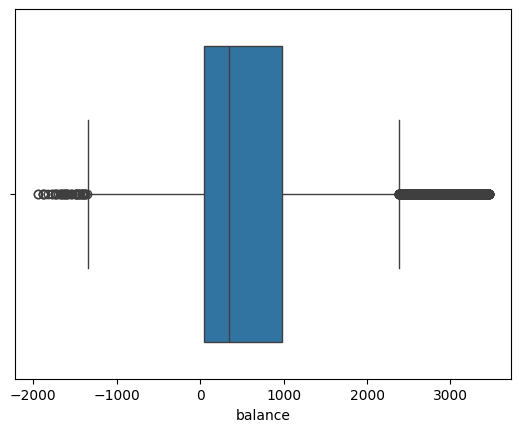

In [ ]:
upperrange = q3+1.5*iqr
bottomrange = q1-1.5*iqr
data = df[(df['balance']>bottomrange) & (df['balance']<upperrange)]
sns.boxplot(data=data,x='balance')

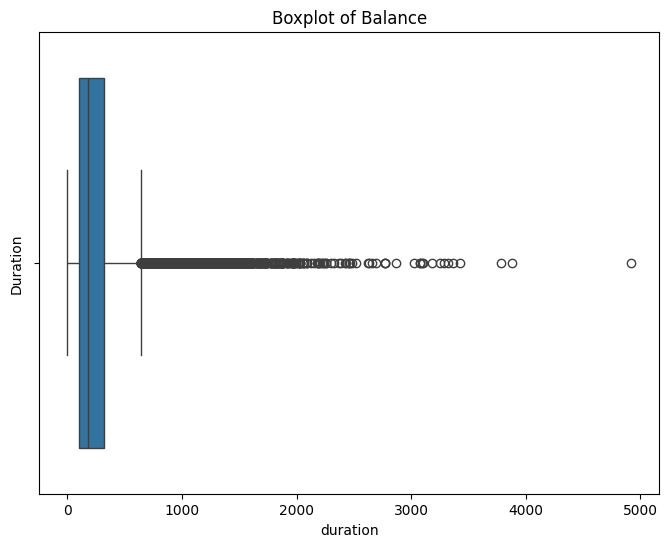

In [ ]:
#plot the outliers for col-duration

plt.figure(figsize=(8, 6))
sns.boxplot(x=df['duration'])
plt.title('Boxplot of Balance')
plt.ylabel('Duration')
plt.show()

In [ ]:
q3 = df['duration'].quantile(.75)
q1 = df['duration'].quantile(.25)
iqr = q3-q1
iqr

np.float64(216.0)

<Axes: xlabel='duration'>

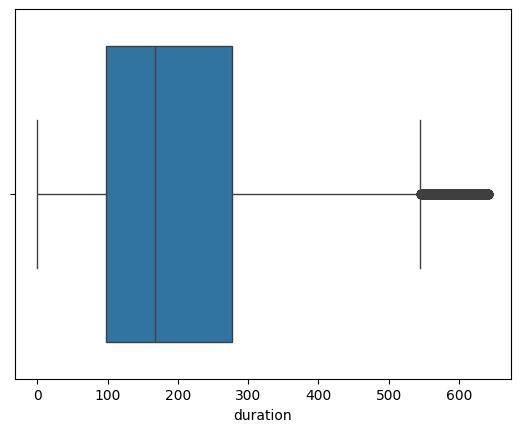

In [ ]:
upperrange = q3+1.5*iqr
bottomrange = q1-1.5*iqr
data = df[(df['duration']>bottomrange) & (df['duration']<upperrange)]
sns.boxplot(data=data,x='duration')

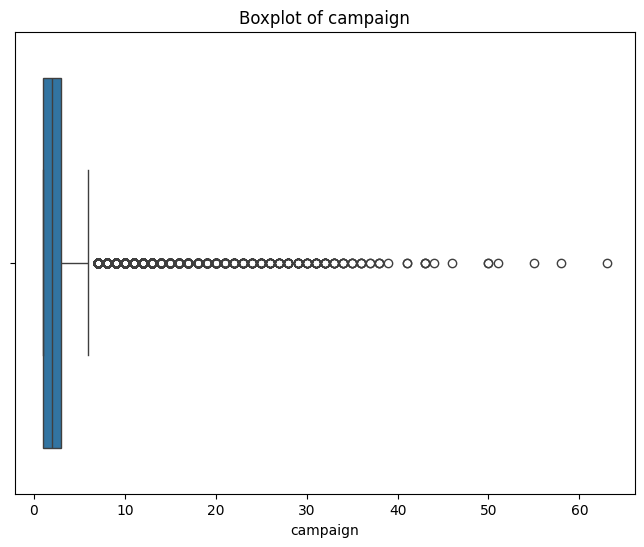

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['campaign'])
plt.title('Boxplot of campaign')
plt.xlabel('campaign')
plt.show()

In [ ]:
q3 = df['campaign'].quantile(.75)
q1 = df['campaign'].quantile(.25)
iqr = q3-q1
iqr

np.float64(2.0)

<Axes: xlabel='campaign'>

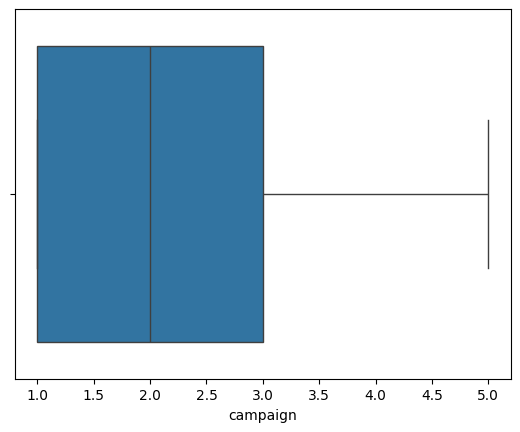

In [ ]:
upperrange = q3+1.5*iqr
bottomrange = q1-1.5*iqr
data = df[(df['campaign']>bottomrange) & (df['campaign']<upperrange)]
sns.boxplot(data=data,x='campaign')

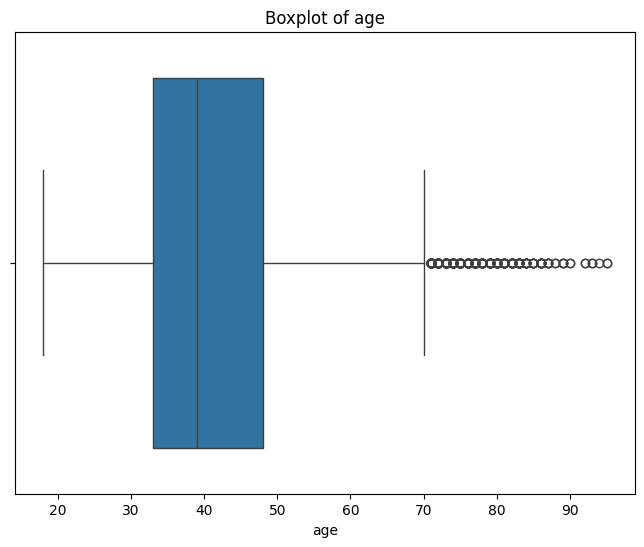

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['age'])
plt.title('Boxplot of age')
plt.xlabel('age')
plt.show()

In [ ]:
q3 = df['age'].quantile(.75)
q1 = df['age'].quantile(.25)
iqr = q3-q1
iqr

np.float64(15.0)

<Axes: xlabel='age'>

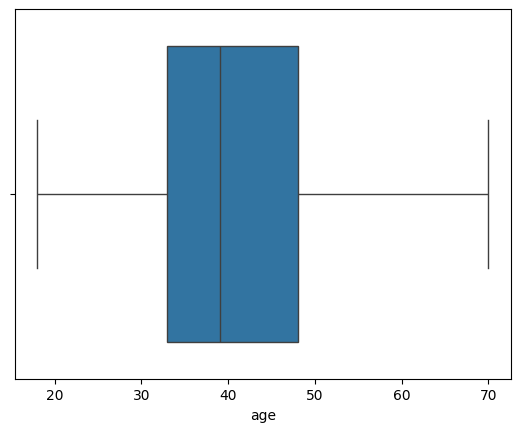

In [ ]:
upperrange = q3+1.5*iqr
bottomrange = q1-1.5*iqr
data = df[(df['age']>bottomrange) & (df['age']<upperrange)]
sns.boxplot(data=data,x='age')

In [ ]:
df.pdays.unique()
df.head(1)

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,False,False,True,False,False,False,False,False,False,True


In [ ]:
df.pdays.unique()

array([ -1, 151, 166,  91,  86, 143, 147,  89, 140, 176, 101, 174, 170,
       167, 195, 165, 129, 188, 196, 172, 118, 119, 104, 171, 117, 164,
       132, 131, 123, 159, 186, 111, 115, 116, 173, 178, 110, 152,  96,
       103, 150, 175, 193, 181, 185, 154, 145, 138, 126, 180, 109, 158,
       168,  97, 182, 127, 130, 194, 125, 105, 102,  26, 179,  28, 183,
       155, 112, 120, 137, 124, 187, 190, 113, 162, 134, 169, 189,   8,
       144, 191, 184, 177,   5,  99, 133,  93,  92,  10, 100, 156, 198,
       106, 153, 146, 128,   7, 121, 160, 107,  90,  27, 197, 136, 139,
       122, 157, 149, 135,  30, 114,  98, 192, 163,  34,  95, 141,  31,
       199,  94, 108,  29, 268, 247, 253, 226, 244, 239, 245, 204, 231,
       238, 258, 230, 254, 265,  71, 223, 246, 250, 266, 240, 205, 261,
       259, 241, 260, 234, 251, 225, 161, 237, 262, 248, 255, 220, 227,
       206, 224, 249, 235, 228, 263,   2, 270, 232, 252, 207, 200, 269,
       233, 256, 273, 272, 242, 264, 208, 214, 222, 271, 203, 22

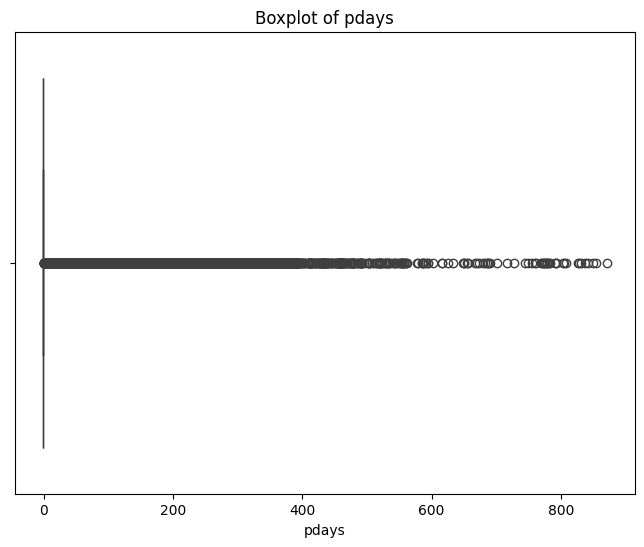

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['pdays'])
plt.title('Boxplot of pdays')
plt.xlabel('pdays')
plt.show()

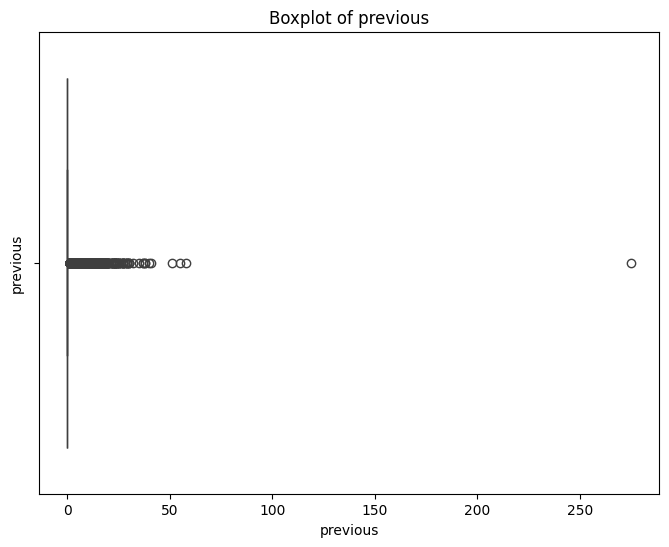

In [ ]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=df['previous'])
plt.title('Boxplot of previous')
plt.ylabel('previous')
plt.show()

In [ ]:
df.shape

(45211, 49)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 49 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   age                  45211 non-null  int64
 1   default              45211 non-null  int64
 2   balance              45211 non-null  int64
 3   housing              45211 non-null  int64
 4   loan                 45211 non-null  int64
 5   day                  45211 non-null  int64
 6   duration             45211 non-null  int64
 7   campaign             45211 non-null  int64
 8   pdays                45211 non-null  int64
 9   previous             45211 non-null  int64
 10  y                    45211 non-null  int64
 11  job_admin.           45211 non-null  bool 
 12  job_blue-collar      45211 non-null  bool 
 13  job_entrepreneur     45211 non-null  bool 
 14  job_housemaid        45211 non-null  bool 
 15  job_management       45211 non-null  bool 
 16  job_retired          4

In [ ]:
# prompt: change the bool to int

# Iterate through all columns in the dataframe
for col in df.columns:
  # Check if the column has a boolean data type
  if df[col].dtype == 'bool':
    # Convert the boolean column to integer type (True becomes 1, False becomes 0)
    df[col] = df[col].astype(int)

df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 45211 entries, 0 to 45210
Data columns (total 49 columns):
 #   Column               Non-Null Count  Dtype
---  ------               --------------  -----
 0   age                  45211 non-null  int64
 1   default              45211 non-null  int64
 2   balance              45211 non-null  int64
 3   housing              45211 non-null  int64
 4   loan                 45211 non-null  int64
 5   day                  45211 non-null  int64
 6   duration             45211 non-null  int64
 7   campaign             45211 non-null  int64
 8   pdays                45211 non-null  int64
 9   previous             45211 non-null  int64
 10  y                    45211 non-null  int64
 11  job_admin.           45211 non-null  int64
 12  job_blue-collar      45211 non-null  int64
 13  job_entrepreneur     45211 non-null  int64
 14  job_housemaid        45211 non-null  int64
 15  job_management       45211 non-null  int64
 16  job_retired          4

# **EDA**

Correlation with 'y':
y                      1.000000
duration               0.394521
poutcome_success       0.306788
contact_cellular       0.135873
month_mar              0.129456
month_oct              0.128531
month_sep              0.123185
pdays                  0.103621
previous               0.093236
job_retired            0.079245
job_student            0.076897
month_dec              0.075164
education_tertiary     0.066448
month_apr              0.065392
marital_single         0.063526
balance                0.052838
month_feb              0.038417
job_management         0.032919
poutcome_other         0.031955
age                    0.025155
job_unemployed         0.020390
contact_telephone      0.014042
education_unknown      0.012053
poutcome_failure       0.009885
job_admin.             0.005637
marital_divorced       0.002772
job_self-employed      0.000855
job_unknown            0.000267
month_aug             -0.008536
month_jan             -0.008783
job_technician    

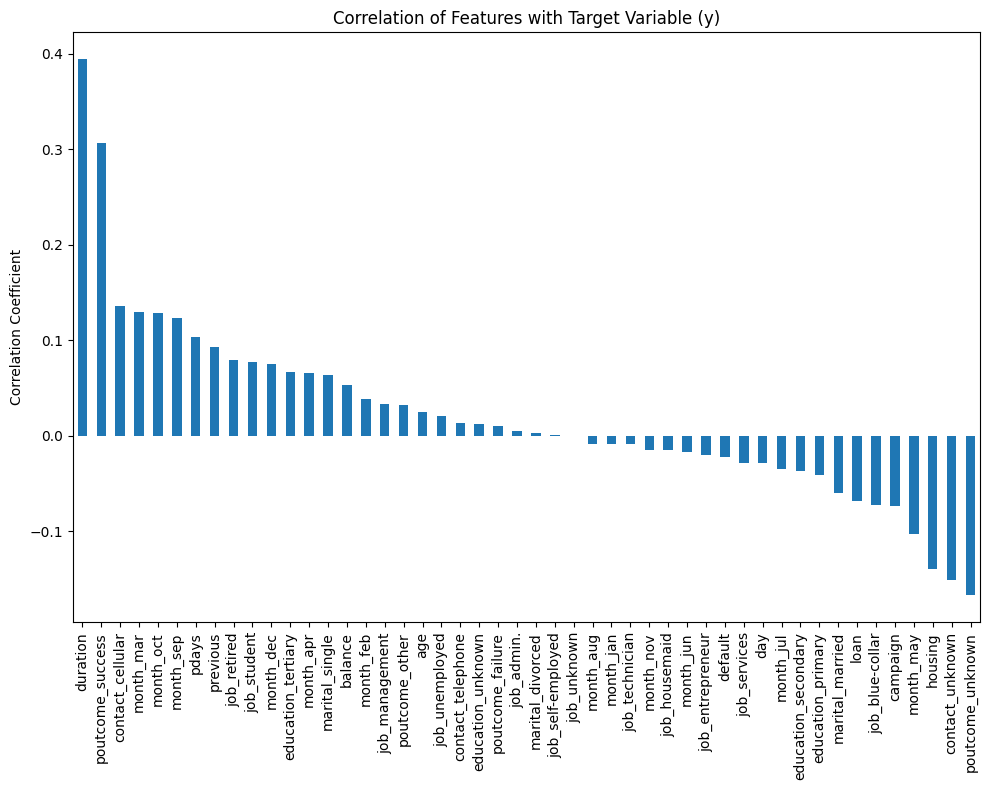

In [ ]:
import matplotlib.pyplot as plt
# Calculate the correlation matrix
correlation_matrix = df.corr()

# Extract the correlations with the target variable 'y'
correlation_with_y = correlation_matrix['y'].sort_values(ascending=False)

# Print the correlations
print("Correlation with 'y':")
print(correlation_with_y)

#Visualize the correlation with 'y' using a bar plot
plt.figure(figsize=(10, 8))
correlation_with_y.drop('y').plot(kind='bar') # Drop 'y' itself for a clearer plot
plt.title('Correlation of Features with Target Variable (y)')
plt.ylabel('Correlation Coefficient')
plt.xticks(rotation=90)
plt.tight_layout()
plt.show()


In [ ]:
# correlation of pdays and previous with y

print("\nCorrelation between 'y' and 'pdays' and 'previous':")
print(df[['y', 'pdays', 'previous']].corr()['y'][['pdays', 'previous']])


Correlation between 'y' and 'pdays' and 'previous':
pdays       0.103621
previous    0.093236
Name: y, dtype: float64


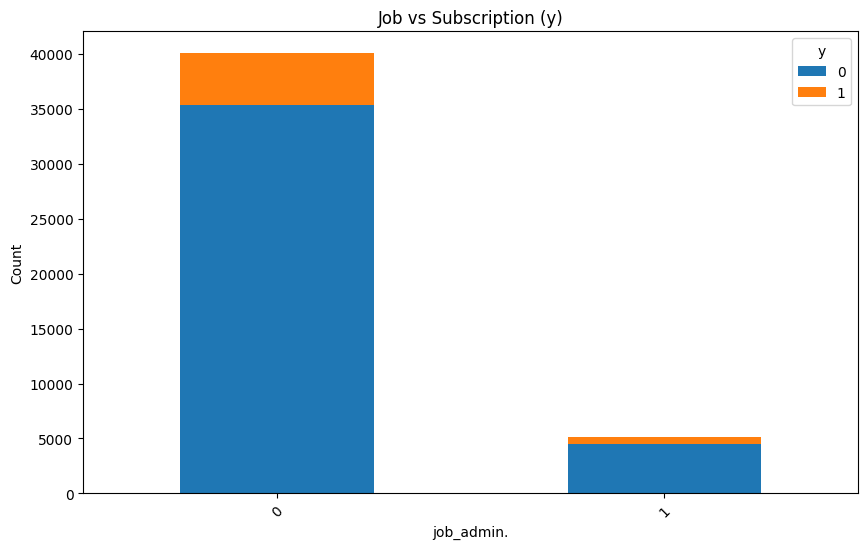

In [ ]:
# Relationship between job and subscription
pd.crosstab(df['job_admin.'], df['y']).plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Job vs Subscription (y)')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

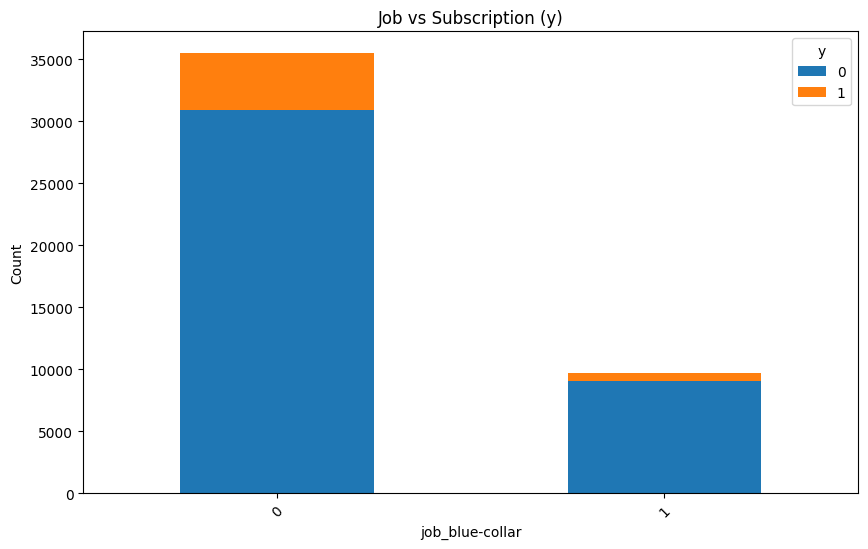

In [ ]:
pd.crosstab(df['job_blue-collar'], df['y']).plot(kind='bar', stacked=True, figsize=(10, 6))
plt.title('Job vs Subscription (y)')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.show()

In [ ]:
df_original=pd.read_csv('/content/bank-full.csv',sep=';')
df_original

,age,job,marital,education,default,balance,housing,loan,contact,day,month,duration,campaign,pdays,previous,poutcome,y
0,58,management,married,tertiary,no,2143,yes,no,unknown,5,may,261,1,-1,0,unknown,no
1,44,technician,single,secondary,no,29,yes,no,unknown,5,may,151,1,-1,0,unknown,no
2,33,entrepreneur,married,secondary,no,2,yes,yes,unknown,5,may,76,1,-1,0,unknown,no
3,47,blue-collar,married,unknown,no,1506,yes,no,unknown,5,may,92,1,-1,0,unknown,no
4,33,unknown,single,unknown,no,1,no,no,unknown,5,may,198,1,-1,0,unknown,no
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,technician,married,tertiary,no,825,no,no,cellular,17,nov,977,3,-1,0,unknown,yes
45207,71,retired,divorced,primary,no,1729,no,no,cellular,17,nov,456,2,-1,0,unknown,yes
45208,72,retired,married,secondary,no,5715,no,no,cellular,17,nov,1127,5,184,3,success,yes
45209,57,blue-collar,married,secondary,no,668,no,no,telephone,17,nov,508,4,-1,0,unknown,no


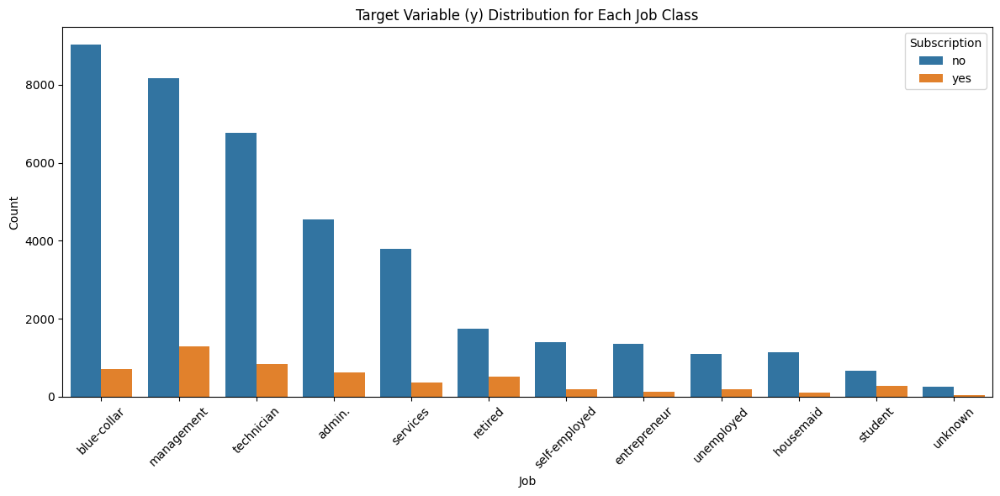

In [ ]:
plt.figure(figsize=(12, 6))
sns.countplot(data=df_original, x='job', hue='y', order=df_original['job'].value_counts().index)
plt.title('Target Variable (y) Distribution for Each Job Class')
plt.xlabel('Job')
plt.ylabel('Count')
plt.xticks(rotation=45)
plt.legend(title='Subscription')
plt.tight_layout()
plt.show()

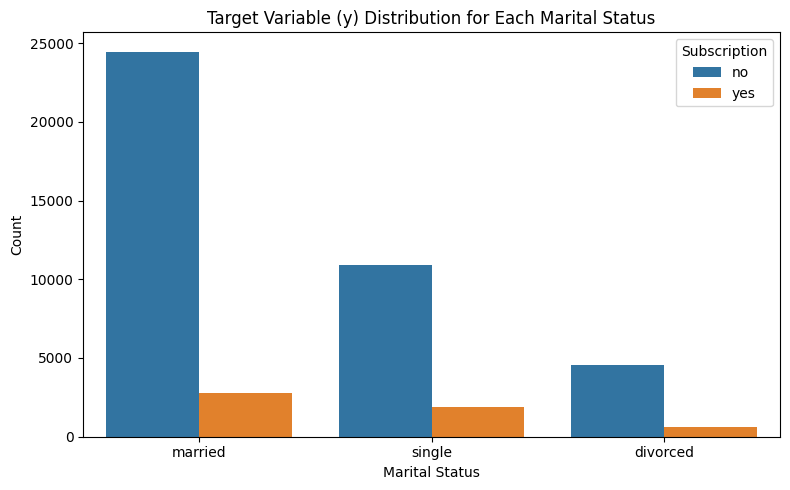

In [ ]:
plt.figure(figsize=(8, 5))
sns.countplot(data=df_original, x='marital', hue='y', order=df_original['marital'].value_counts().index)
plt.title('Target Variable (y) Distribution for Each Marital Status')
plt.xlabel('Marital Status')
plt.ylabel('Count')
plt.legend(title='Subscription')
plt.tight_layout()
plt.show()

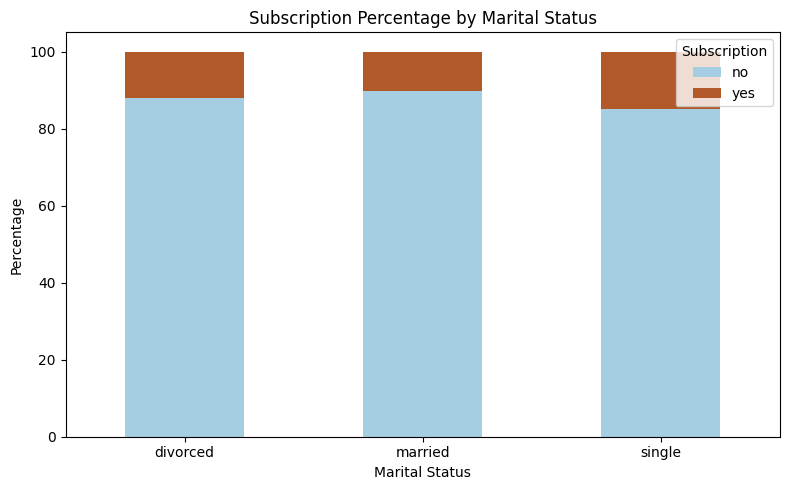

In [ ]:
# Calculate normalized value counts (percentage)
marital_dist = df_original.groupby('marital')['y'].value_counts(normalize=True).unstack().fillna(0) * 100

# Plot as stacked bar chart
marital_dist.plot(kind='bar', stacked=True, figsize=(8, 5), colormap='Paired')
plt.title('Subscription Percentage by Marital Status')
plt.ylabel('Percentage')
plt.xlabel('Marital Status')
plt.legend(title='Subscription')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


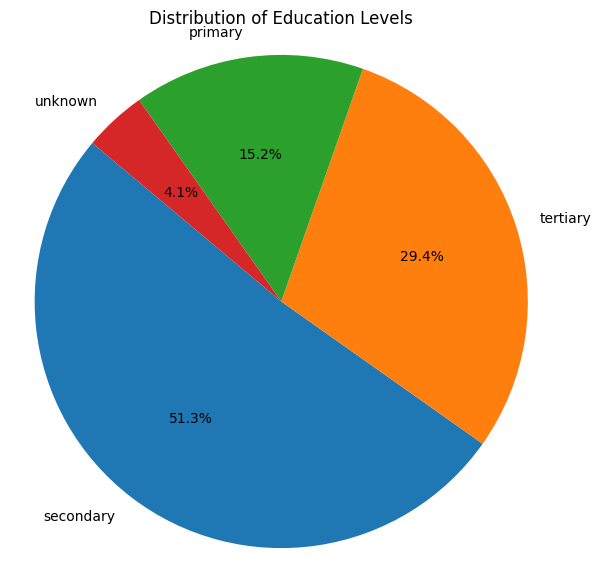

In [ ]:
education_counts = df_original['education'].value_counts()
plt.figure(figsize=(7, 7))
plt.pie(education_counts, labels=education_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('Distribution of Education Levels')
plt.axis('equal')
plt.show()

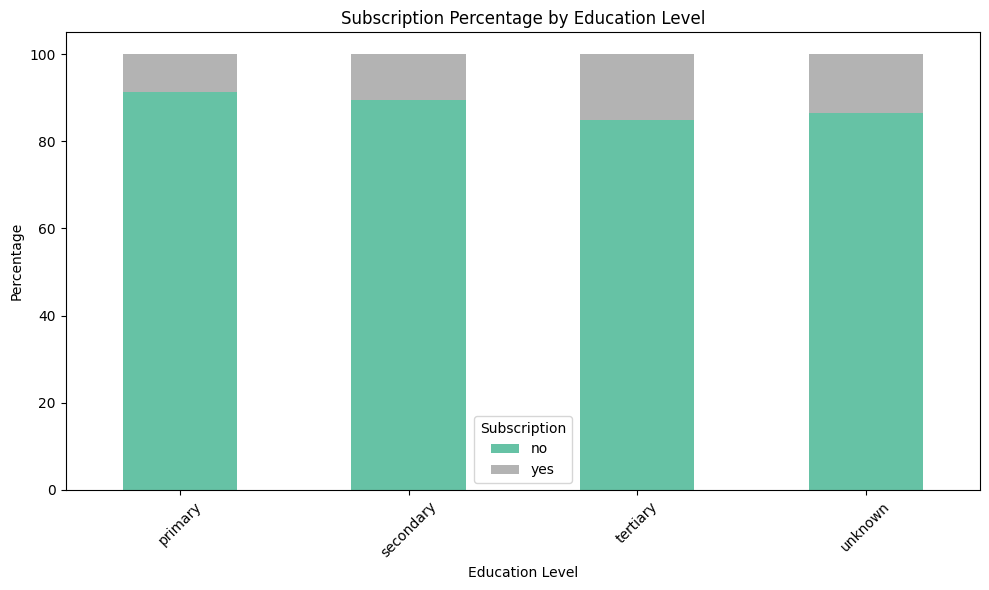

In [ ]:
# Normalize counts to percentage
education_dist = df_original.groupby('education')['y'].value_counts(normalize=True).unstack().fillna(0) * 100

# Plot
education_dist.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Set2')
plt.title('Subscription Percentage by Education Level')
plt.ylabel('Percentage')
plt.xlabel('Education Level')
plt.legend(title='Subscription')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

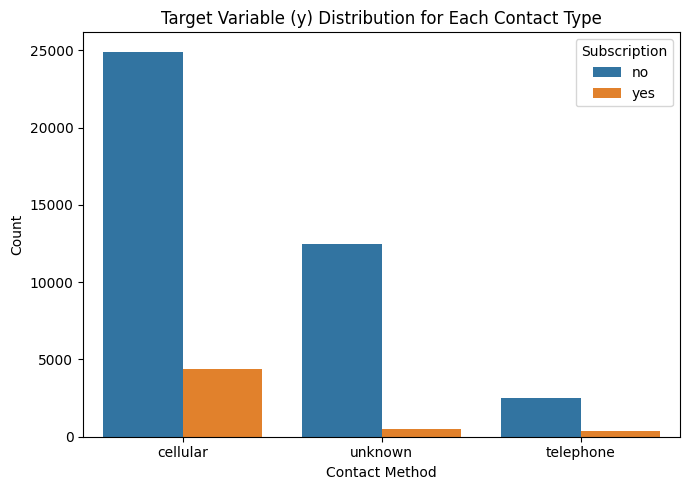

In [ ]:
plt.figure(figsize=(7, 5))
sns.countplot(data=df_original, x='contact', hue='y', order=df_original['contact'].value_counts().index)
plt.title('Target Variable (y) Distribution for Each Contact Type')
plt.xlabel('Contact Method')
plt.ylabel('Count')
plt.legend(title='Subscription')
plt.tight_layout()
plt.show()

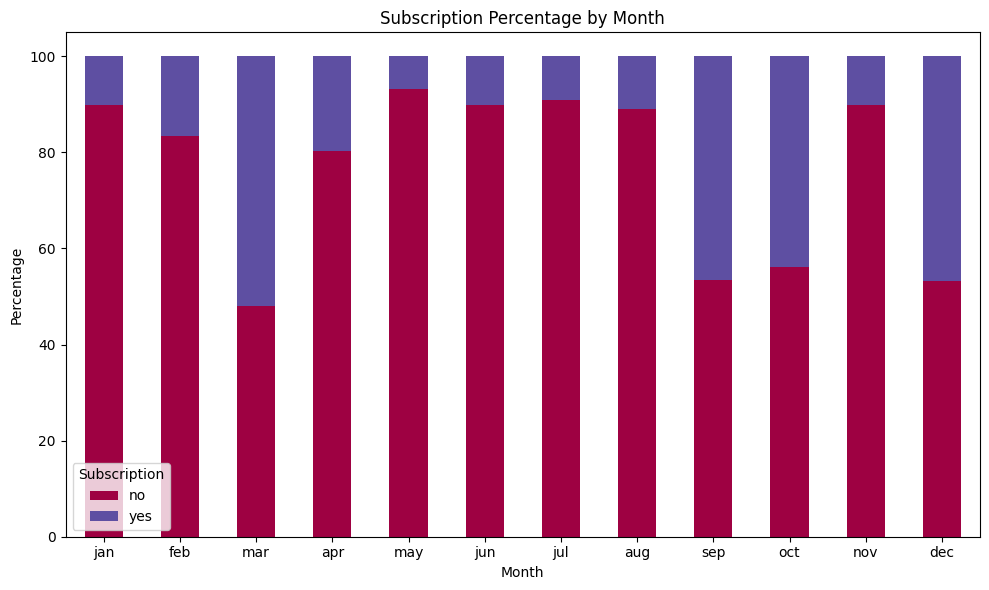

In [ ]:
# Compute percentage of 'yes' and 'no' for each month
month_dist = df_original.groupby('month')['y'].value_counts(normalize=True).unstack().fillna(0) * 100

# Reorder months for chronological display
month_order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun',
               'jul', 'aug', 'sep', 'oct', 'nov', 'dec']
month_dist = month_dist.reindex(month_order)

# Plot
month_dist.plot(kind='bar', stacked=True, figsize=(10, 6), colormap='Spectral')
plt.title('Subscription Percentage by Month')
plt.ylabel('Percentage')
plt.xlabel('Month')
plt.legend(title='Subscription')
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()


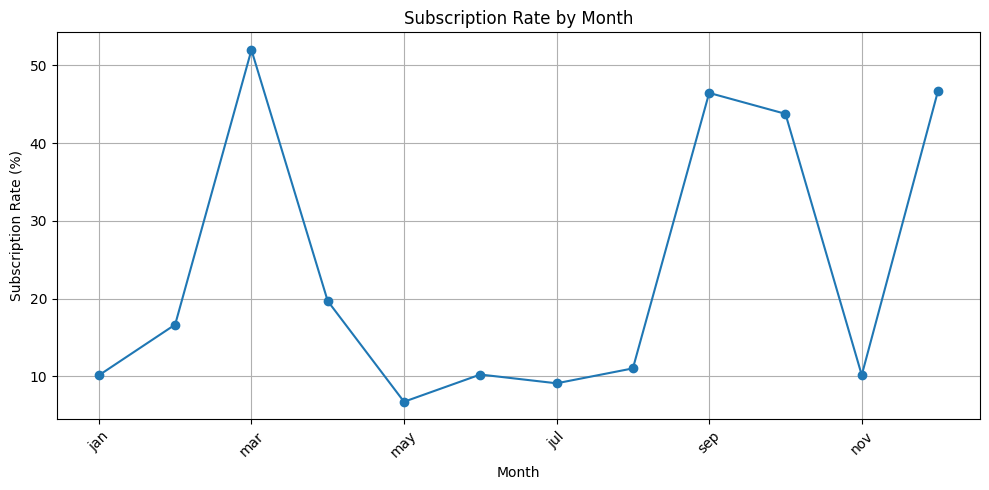

In [ ]:
month_order = ['jan', 'feb', 'mar', 'apr', 'may', 'jun',
               'jul', 'aug', 'sep', 'oct', 'nov', 'dec']

monthly_rate = df_original.groupby('month')['y'].value_counts(normalize=True).unstack()['yes'] * 100
monthly_rate = monthly_rate.reindex(month_order)

monthly_rate.plot(kind='line', marker='o', figsize=(10, 5))
plt.title('Subscription Rate by Month')
plt.ylabel('Subscription Rate (%)')
plt.xlabel('Month')
plt.xticks(rotation=45)
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Create age bins
bins = [15, 25, 35, 45, 55, 65, 75, 85, 95]
labels = ['15–24', '25–34', '35–44', '45–54', '55–64', '65–74', '75–84', '85–94']
df_original['age_group'] = pd.cut(df_original['age'], bins=bins, labels=labels, right=False)

In [ ]:
# Group by age group and calculate % of 'yes' subscriptions
age_subscription_rate = df_original.groupby('age_group')['y'].value_counts(normalize=True).unstack().fillna(0)
age_yes_rate = age_subscription_rate['yes'] * 100


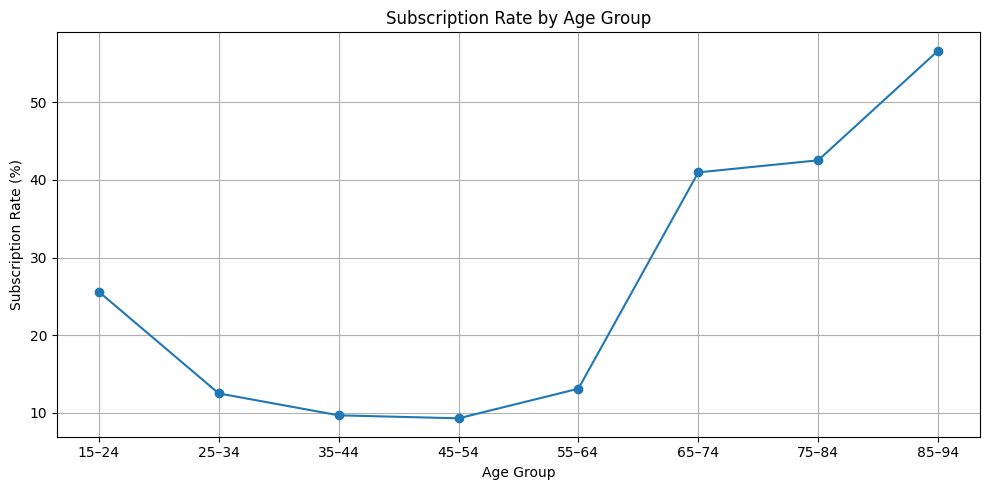

In [ ]:
# Plot
plt.figure(figsize=(10, 5))
plt.plot(age_yes_rate.index.astype(str), age_yes_rate.values, marker='o', linestyle='-')
plt.title('Subscription Rate by Age Group')
plt.xlabel('Age Group')
plt.ylabel('Subscription Rate (%)')
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
# Create bins for balance
balance_bins = [-10000, 0, 500, 1000, 2500, 5000, 10000, 25000, 100000]
balance_labels = ['<0', '0–499', '500–999', '1000–2499', '2500–4999',
                  '5000–9999', '10000–24999', '25000+']

df_original['balance_group'] = pd.cut(df_original['balance'], bins=balance_bins, labels=balance_labels, right=False)

In [ ]:
# Calculate percentage of 'yes' subscriptions per balance group
balance_rate = df_original.groupby('balance_group')['y'].value_counts(normalize=True).unstack().fillna(0)
balance_yes_rate = balance_rate['yes'] * 100


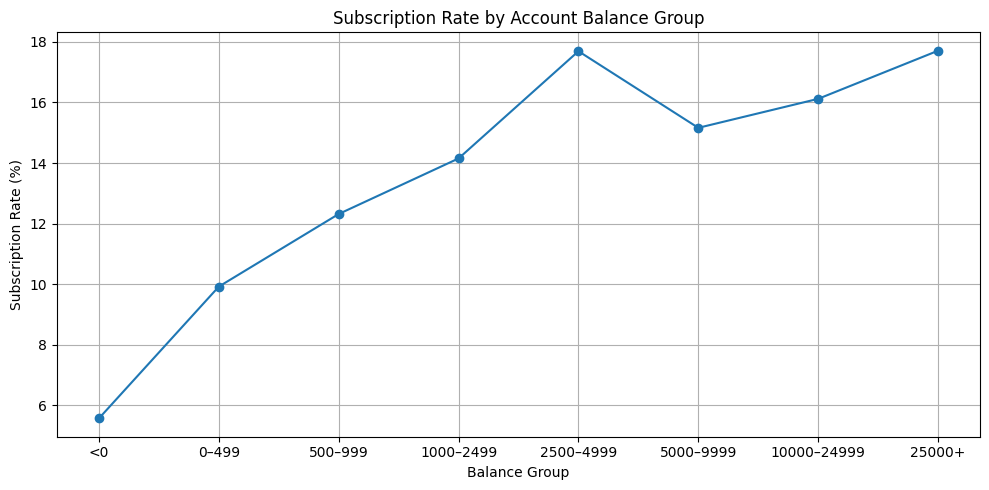

In [ ]:
# Plot
plt.figure(figsize=(10, 5))
plt.plot(balance_yes_rate.index.astype(str), balance_yes_rate.values, marker='o', linestyle='-')
plt.title('Subscription Rate by Account Balance Group')
plt.xlabel('Balance Group')
plt.ylabel('Subscription Rate (%)')
plt.grid(True)
plt.tight_layout()
plt.show()

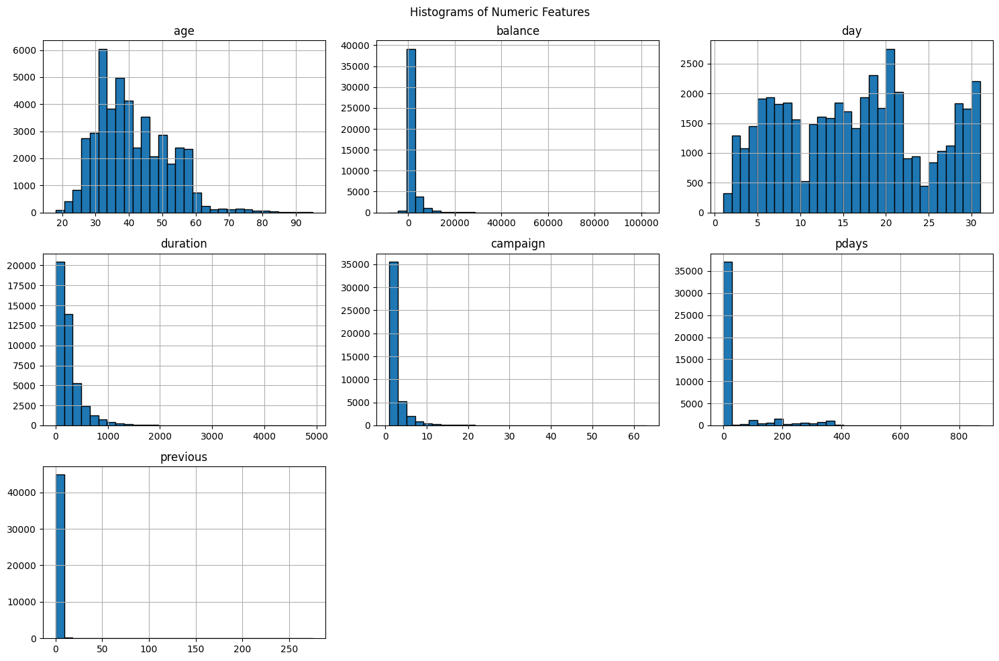

In [ ]:
# Select numeric columns only
numeric_cols = df_original.select_dtypes(include=['int64', 'float64']).columns

# Plot histograms
df_original[numeric_cols].hist(figsize=(15, 10), bins=30, edgecolor='black')
plt.suptitle("Histograms of Numeric Features")
plt.tight_layout()
plt.show()

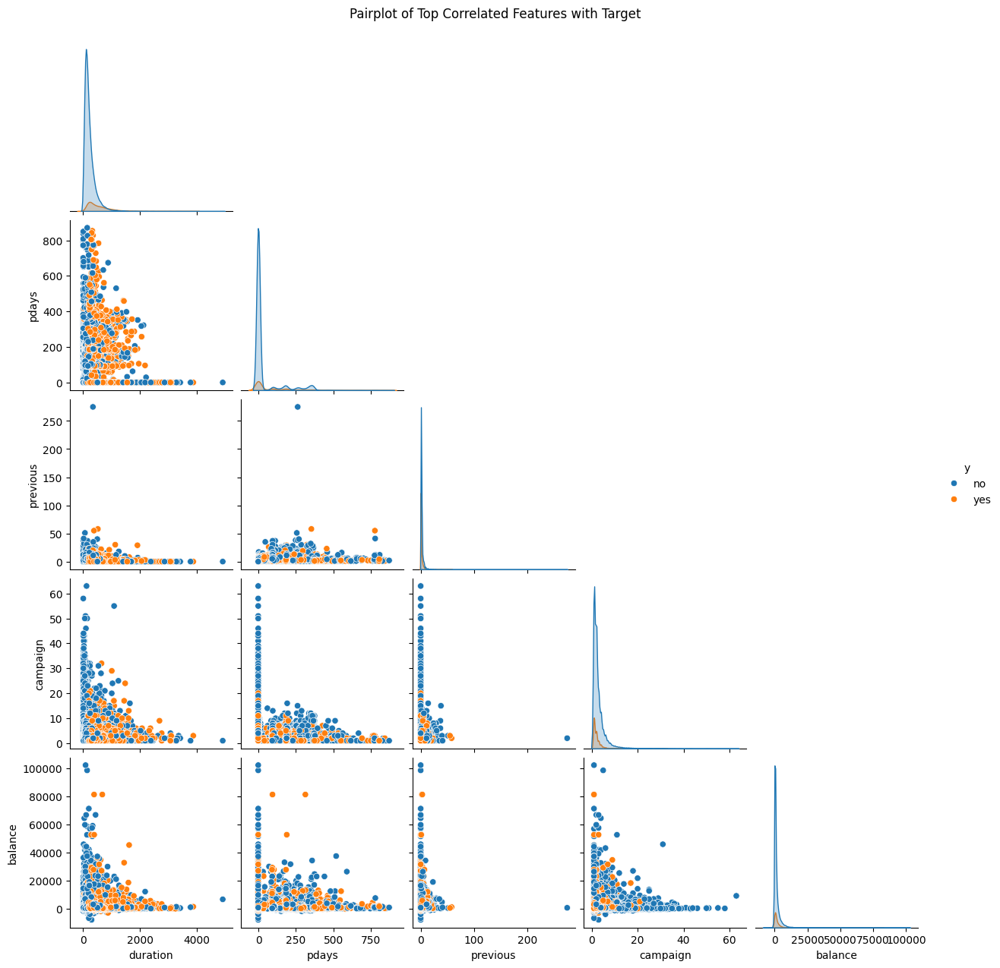

In [ ]:
# Convert 'y' to numeric for correlation
df_corr = df_original.copy()
df_corr['y_numeric'] = df_corr['y'].map({'yes': 1, 'no': 0})

# Compute correlations
correlations = df_corr.corr(numeric_only=True)['y_numeric'].drop('y_numeric').abs()
top_features = correlations.sort_values(ascending=False).head(5).index.tolist()

# Add 'y' for color/hue
pairplot_df = df_original[top_features + ['y']]

# Plot pairplot
sns.pairplot(pairplot_df, hue='y', corner=True)
plt.suptitle("Pairplot of Top Correlated Features with Target", y=1.02)
plt.show()

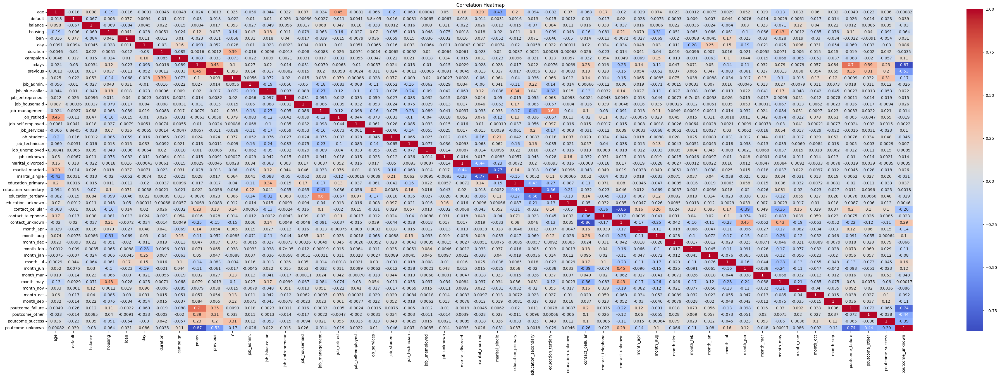

In [ ]:
plt.figure(figsize=(50, 15))
sns.heatmap(df.corr(numeric_only=True), annot=True, cmap="coolwarm")
plt.title(" Correlation Heatmap")
plt.show()

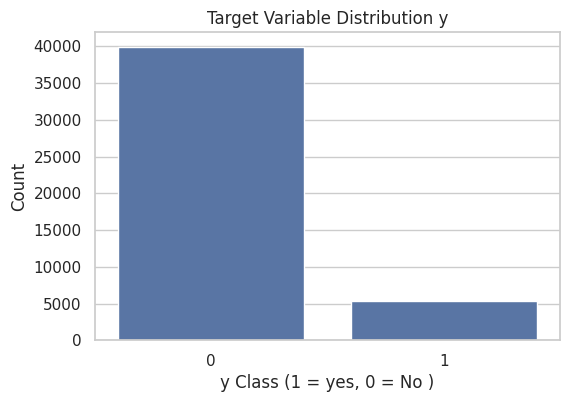

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# Set seaborn style
sns.set(style="whitegrid")

# Check the target variable distribution
target_col = "y"

# Plot target distribution
plt.figure(figsize=(6, 4))
sns.countplot(x=target_col, data=df)
plt.title("Target Variable Distribution y")
plt.xlabel("y Class (1 = yes, 0 = No )")
plt.ylabel("Count")
plt.show()

## **MODELS(70:30)**

In [ ]:
x = df.drop(columns=["y"])
y = df["y"]
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.3, stratify=y, random_state=42)

In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
13382,31,0,1,1,0,9,82,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
32641,35,0,195,1,0,17,203,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
3991,24,0,77,1,0,16,236,2,-1,0,...,0,0,1,0,0,0,0,0,0,1
8068,35,0,80,1,1,2,579,2,-1,0,...,1,0,0,0,0,0,0,0,0,1
27484,37,0,105,0,1,21,197,2,157,4,...,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16952,45,0,79,1,0,25,98,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
6317,30,0,1196,0,0,27,147,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
34781,27,0,2559,1,0,6,227,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
13679,32,0,0,1,0,9,90,1,-1,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
y_train

,y
13382,0
32641,0
3991,0
8068,0
27484,0
...,...
16952,0
6317,0
34781,0
13679,0


In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
13382,31,0,1,1,0,9,82,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
32641,35,0,195,1,0,17,203,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
3991,24,0,77,1,0,16,236,2,-1,0,...,0,0,1,0,0,0,0,0,0,1
8068,35,0,80,1,1,2,579,2,-1,0,...,1,0,0,0,0,0,0,0,0,1
27484,37,0,105,0,1,21,197,2,157,4,...,0,0,0,1,0,0,1,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16952,45,0,79,1,0,25,98,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
6317,30,0,1196,0,0,27,147,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
34781,27,0,2559,1,0,6,227,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
13679,32,0,0,1,0,9,90,1,-1,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
y_train

,y
13382,0
32641,0
3991,0
8068,0
27484,0
...,...
16952,0
6317,0
34781,0
13679,0


# LOGISTIC

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

In [ ]:
x

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
1,44,0,29,1,0,5,151,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
2,33,0,2,1,1,5,76,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
3,47,0,1506,1,0,5,92,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,977,3,-1,0,...,0,0,0,1,0,0,0,0,0,1
45207,71,0,1729,0,0,17,456,2,-1,0,...,0,0,0,1,0,0,0,0,0,1
45208,72,0,5715,0,0,17,1127,5,184,3,...,0,0,0,1,0,0,0,0,1,0
45209,57,0,668,0,0,17,508,4,-1,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
y

,y
0,0
1,0
2,0
3,0
4,0
...,...
45206,1
45207,1
45208,1
45209,0


In [ ]:
# fit a logistic regression model and store the class predictions
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=1e9)

logreg.fit(x_train, y_train)
predictions = logreg.predict(x_test)
print(predictions)

[0 0 0 ... 0 0 0]


confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
z=confusion_matrix(y_test, predictions)
z

array([[11732,   245],
       [ 1266,   321]])

accuracy

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,predictions)

0.8886021822471247

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     11977
           1       0.57      0.20      0.30      1587

    accuracy                           0.89     13564
   macro avg       0.73      0.59      0.62     13564
weighted avg       0.86      0.89      0.86     13564



## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
model = KNeighborsClassifier(n_neighbors=25)

In [ ]:
model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [ ]:
y_pred = model.predict(x_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
knn = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
knn

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,0,1
38581,0,0
...,...,...
15913,0,0
20622,1,1
41684,0,0
32749,0,0


Evaluation Metric

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8864641698613979

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11709,   268],
       [ 1272,   315]])

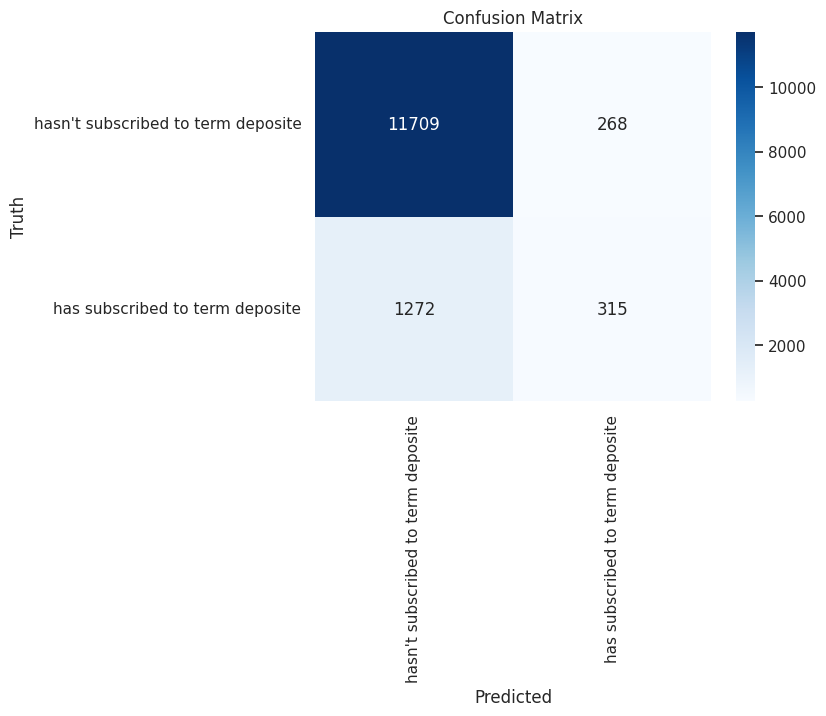

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     11977
           1       0.54      0.20      0.29      1587

    accuracy                           0.89     13564
   macro avg       0.72      0.59      0.61     13564
weighted avg       0.86      0.89      0.86     13564



# SVC

In [ ]:
from sklearn.svm  import SVC

In [ ]:
model = SVC(kernel='linear')

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)


In [ ]:
model.fit(x_train, y_train)

SVC(kernel='linear')

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
svm = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
svm

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,0,1
38581,0,0
...,...,...
15913,0,0
20622,0,1
41684,0,0
32749,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8945001474491301

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11820,   157],
       [ 1274,   313]])

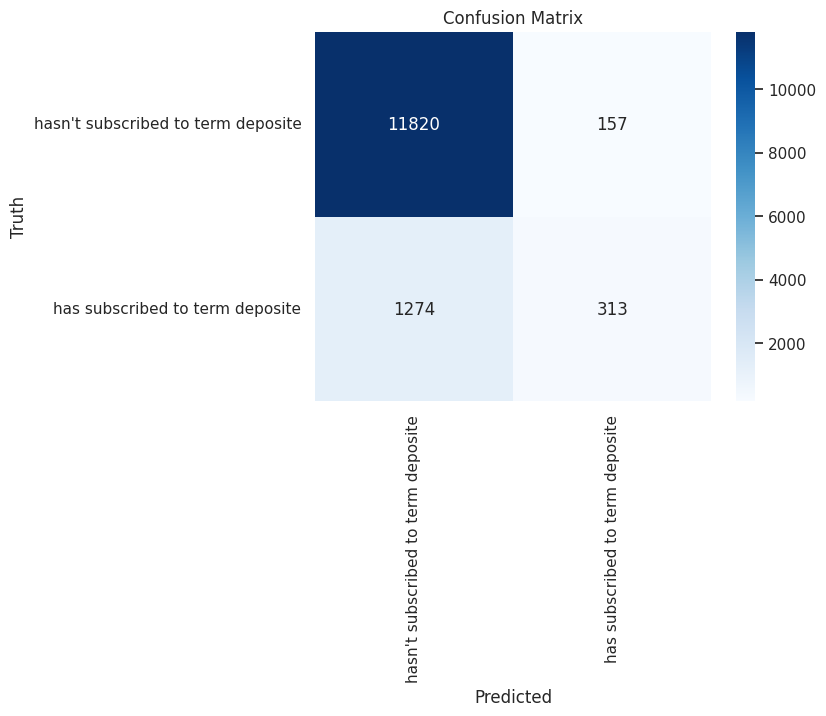

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

# **DECISION** **TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=46)
dt_model.fit(x_train, y_train)


DecisionTreeClassifier(random_state=46)

In [ ]:
y_pred_dt = dt_model.predict(x_test)


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred_dt)

0.8717929814214096

In [ ]:
from sklearn.metrics import confusion_matrix
# Ensure consistent train-test split before calculating confusion matrix

dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)
y_pred_dt = dt_model.predict(x_test)

cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[11103,   874],
       [  813,   774]])

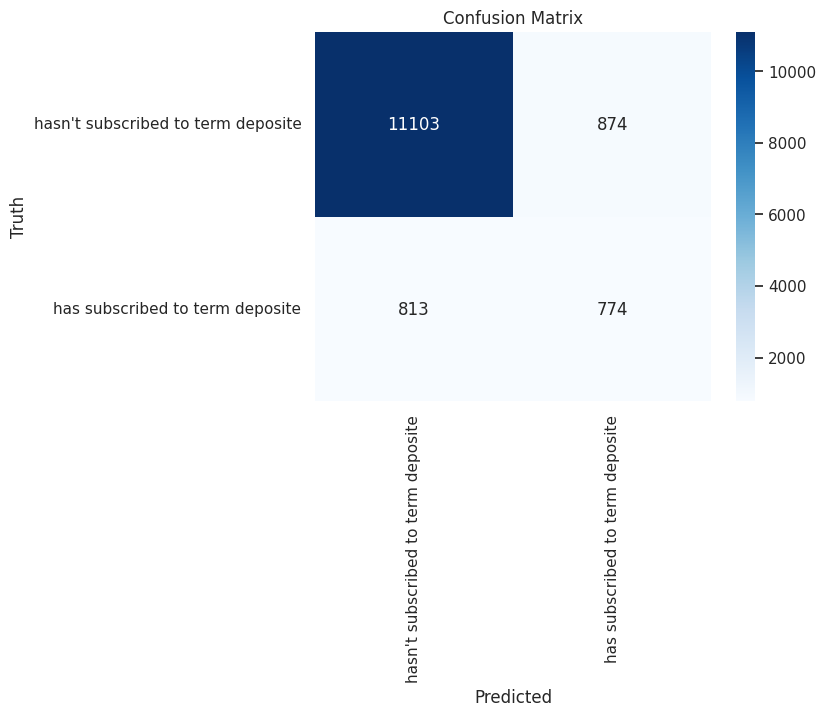

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11977
           1       0.47      0.49      0.48      1587

    accuracy                           0.88     13564
   macro avg       0.70      0.71      0.70     13564
weighted avg       0.88      0.88      0.88     13564



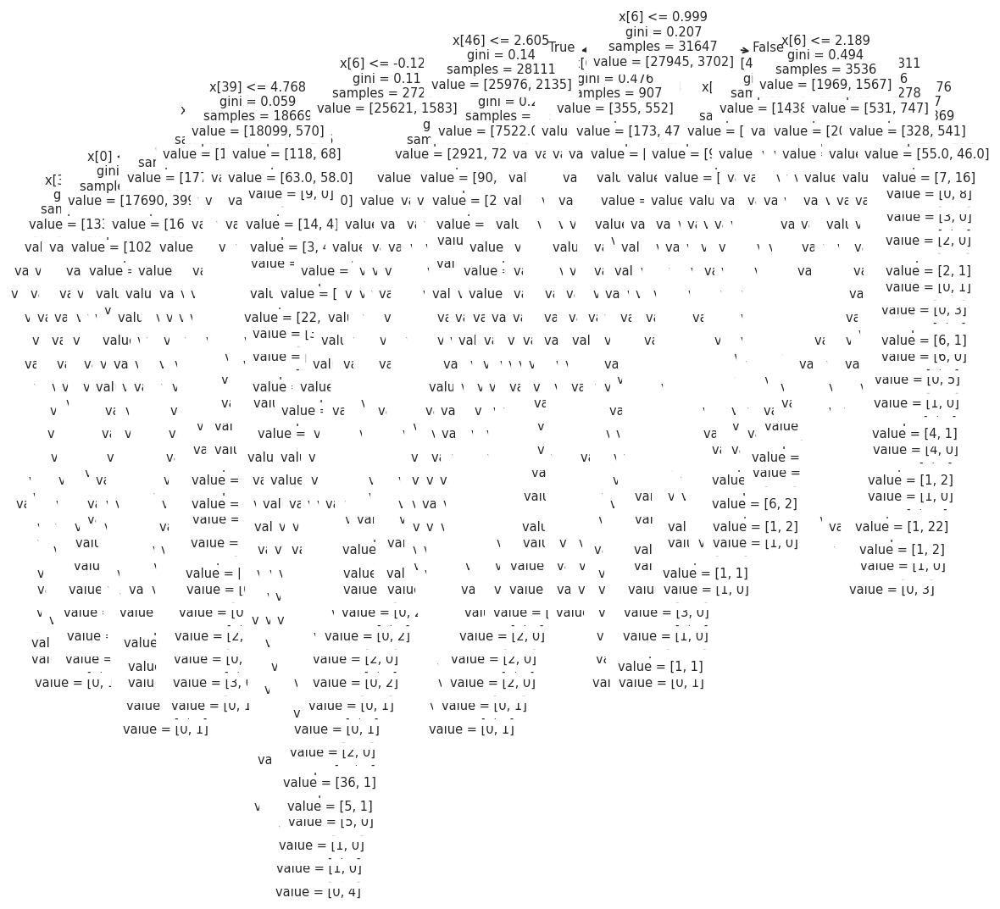

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(dt_model, fontsize=8)
plt.show()
#plt.savefig('out.pdf')

**Decision Tree Classifier Parameter**

In [ ]:
# Create Decision Tree Classifier object
clf = DecisionTreeClassifier(criterion="gini", max_depth=3) # 'gini', 'log_loss', 'entropy'

# Train Decision Tree Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred_dt = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_dt)

0.9009141846063108

In [ ]:
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[11677,   300],
       [ 1044,   543]])

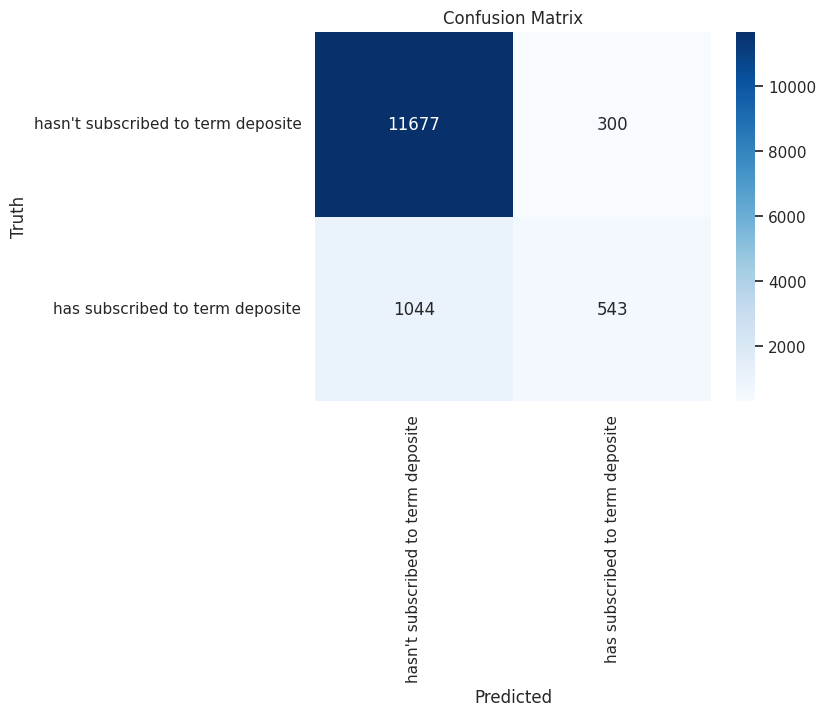

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11977
           1       0.64      0.34      0.45      1587

    accuracy                           0.90     13564
   macro avg       0.78      0.66      0.70     13564
weighted avg       0.89      0.90      0.89     13564



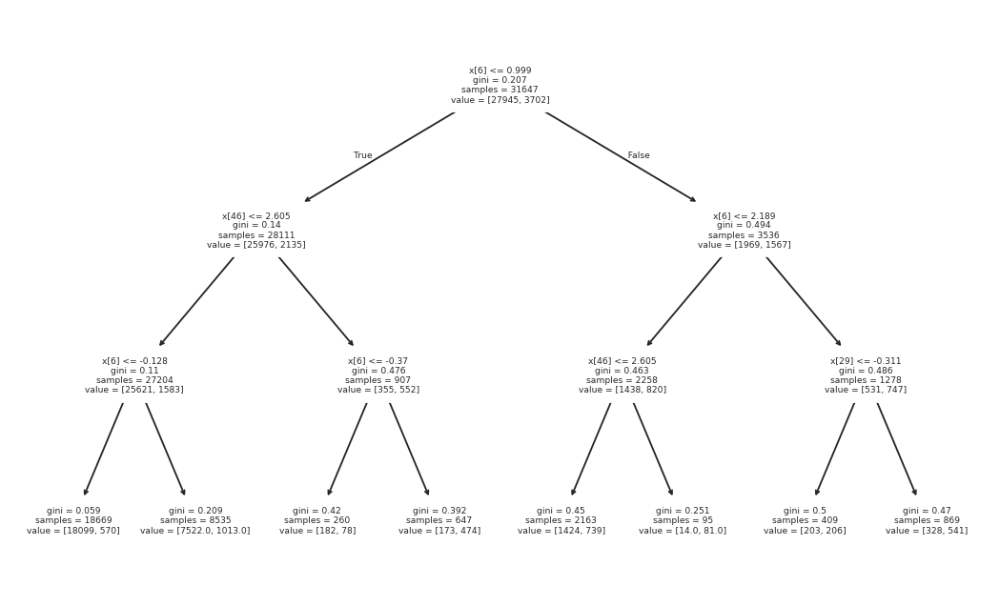

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

# **RANDOM** **FOREST**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model = RandomForestClassifier()

In [ ]:
model.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,0,1
38581,0,0
...,...,...
15913,0,0
20622,1,1
41684,0,0
32749,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9054851076378649

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11688,   289],
       [  993,   594]])

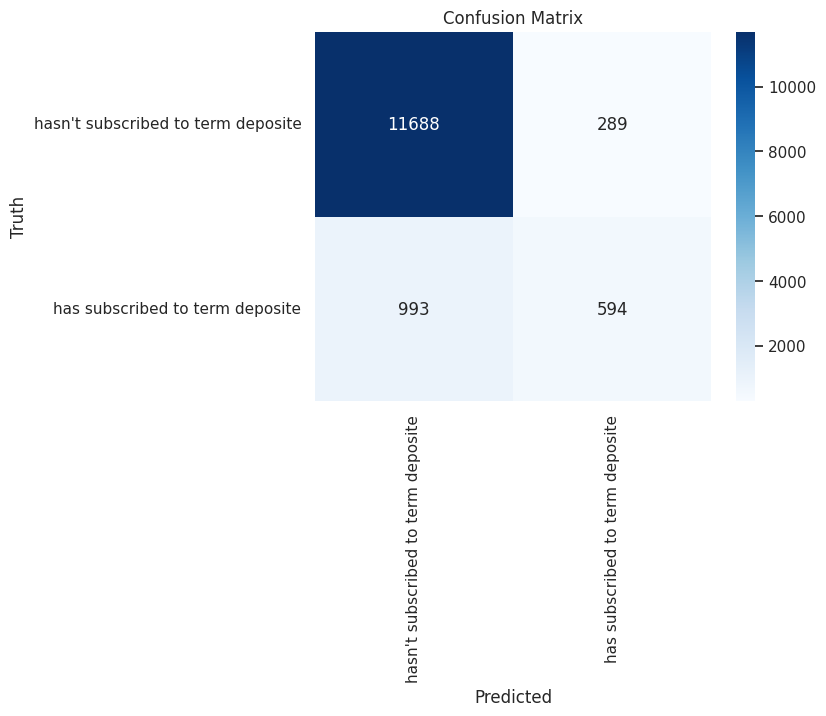

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95     11977
           1       0.67      0.37      0.48      1587

    accuracy                           0.91     13564
   macro avg       0.80      0.68      0.71     13564
weighted avg       0.89      0.91      0.89     13564



**random classifier parameter**

In [ ]:
# Create Random Forest Classifier object
clf = RandomForestClassifier(n_estimators=200, criterion="gini", max_depth=10, bootstrap=True) # 'gini', 'log_loss', 'entropy'

# Train Random Forest Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.8994396933058095

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[11893,    84],
       [ 1280,   307]])

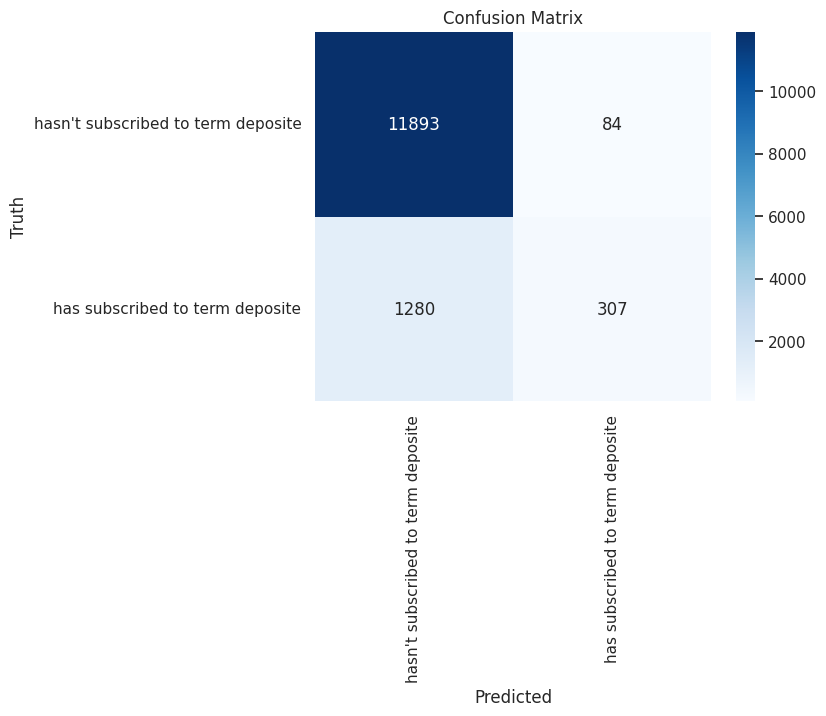

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.99      0.95     11977
           1       0.79      0.19      0.31      1587

    accuracy                           0.90     13564
   macro avg       0.84      0.59      0.63     13564
weighted avg       0.89      0.90      0.87     13564



**`BOOSTING`**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
model = AdaBoostClassifier()

In [ ]:
model.fit(x_train, y_train)

AdaBoostClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,0,1
38581,0,0
...,...,...
15913,0,0
20622,1,1
41684,0,0
32749,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8961958124447066

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11644,   333],
       [ 1075,   512]])

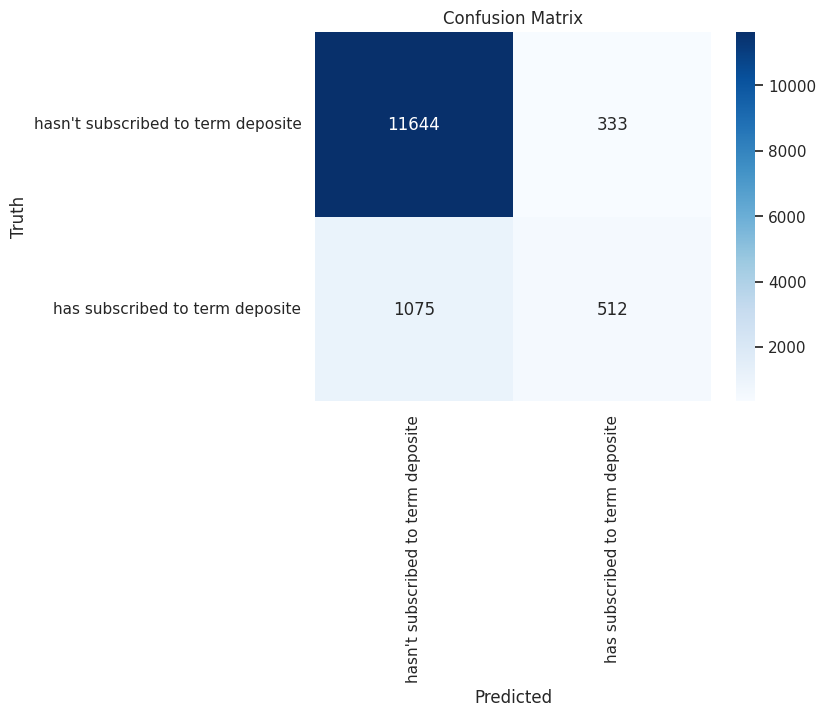

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.94     11977
           1       0.61      0.32      0.42      1587

    accuracy                           0.90     13564
   macro avg       0.76      0.65      0.68     13564
weighted avg       0.88      0.90      0.88     13564



In [ ]:
# Create Boosting Classifier object
from sklearn.ensemble import RandomForestClassifier
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9054851076378649

# **GARDIENT** **BOOSTING** **CLASSIFIER**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
model = GradientBoostingClassifier()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df= pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,0,1
38581,0,0
...,...,...
15913,0,0
20622,1,1
41684,0,0
32749,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9061486287230905

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11649,   328],
       [  945,   642]])

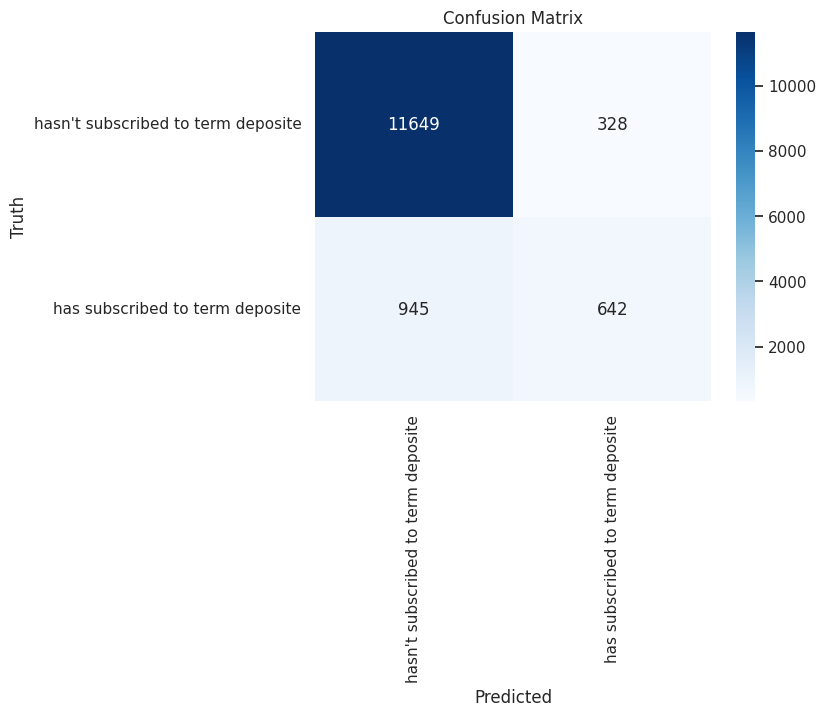

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11977
           1       0.66      0.40      0.50      1587

    accuracy                           0.91     13564
   macro avg       0.79      0.69      0.73     13564
weighted avg       0.89      0.91      0.90     13564



Gardient boosting classifier parameter

In [ ]:
# Create Boosting Classifier object
br = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, loss='exponential', criterion='squared_error') #'exponential', 'log_loss'

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9050427602477146

# XG_BOOSTING

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier()

In [ ]:
model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,1,1
38581,1,0
...,...,...
15913,0,0
20622,1,1
41684,0,0
32749,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9065172515482158

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11536,   441],
       [  827,   760]])

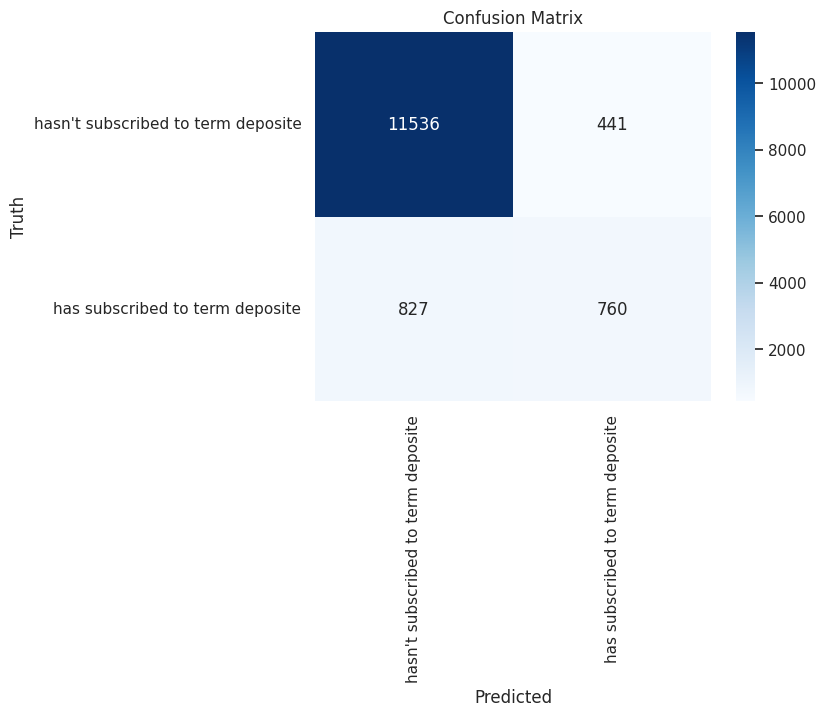

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.96      0.95     11977
           1       0.63      0.48      0.55      1587

    accuracy                           0.91     13564
   macro avg       0.78      0.72      0.75     13564
weighted avg       0.90      0.91      0.90     13564



XGBoosting Classifier Parameter

In [ ]:
# Create Boosting Classifier object
br = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9086552639339428

**BAGGING**

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
model = BaggingClassifier()

In [ ]:
model.fit(x_train, y_train)

BaggingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
37735,0,1
44332,0,1
4432,0,0
38725,0,1
38581,0,0
...,...,...
15913,0,0
20622,1,1
41684,0,0
32749,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.901135358301386

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11580,   397],
       [  944,   643]])

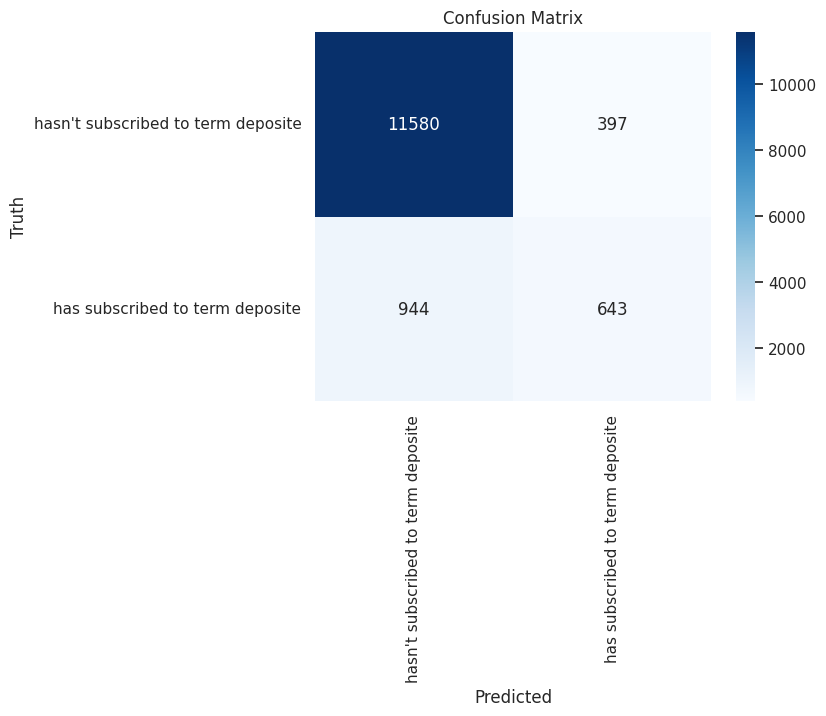

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11977
           1       0.62      0.41      0.49      1587

    accuracy                           0.90     13564
   macro avg       0.77      0.69      0.72     13564
weighted avg       0.89      0.90      0.89     13564



**Bagging Classifier Parameter**

In [ ]:
# Create Bagging Classifier object
from sklearn.tree import DecisionTreeClassifier
base_estimator = DecisionTreeClassifier(max_depth=3, random_state=32)
br = BaggingClassifier(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9013565319964613

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[11686,   291],
       [ 1047,   540]])

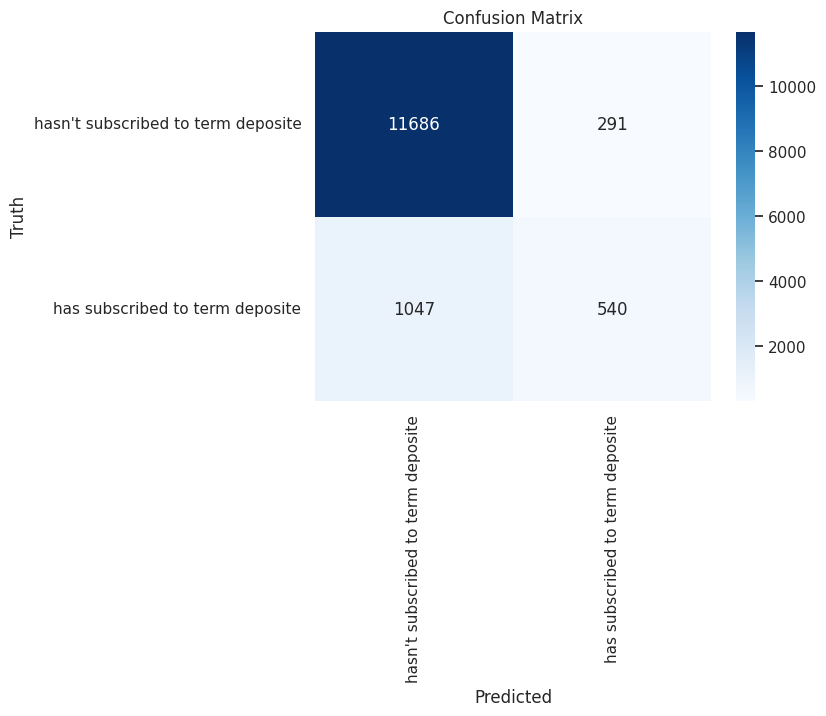

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95     11977
           1       0.65      0.34      0.45      1587

    accuracy                           0.90     13564
   macro avg       0.78      0.66      0.70     13564
weighted avg       0.89      0.90      0.89     13564



## **MODELS(80:20)**

In [ ]:
x = df.drop(columns=["y"])
y = df["y"]
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.2, stratify=y, random_state=42)

In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
24001,36,0,861,0,0,29,140,2,-1,0,...,0,0,0,0,0,0,0,0,0,1
43409,24,0,4126,0,0,5,907,4,185,7,...,0,0,0,0,0,0,1,0,0,0
20669,44,0,244,1,0,12,1735,4,-1,0,...,0,0,0,0,0,0,0,0,0,1
18810,48,0,0,0,0,31,35,11,-1,0,...,0,0,0,0,0,0,0,0,0,1
23130,38,0,257,0,0,26,57,10,-1,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17958,50,0,917,1,0,30,58,2,-1,0,...,0,0,0,0,0,0,0,0,0,1
15941,36,0,22,1,0,22,77,5,-1,0,...,0,0,0,0,0,0,0,0,0,1
16952,45,0,79,1,0,25,98,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
34781,27,0,2559,1,0,6,227,1,-1,0,...,0,0,1,0,0,0,0,0,0,1


In [ ]:
y_train

,y
24001,0
43409,1
20669,1
18810,0
23130,0
...,...
17958,0
15941,0
16952,0
34781,0


In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
24001,36,0,861,0,0,29,140,2,-1,0,...,0,0,0,0,0,0,0,0,0,1
43409,24,0,4126,0,0,5,907,4,185,7,...,0,0,0,0,0,0,1,0,0,0
20669,44,0,244,1,0,12,1735,4,-1,0,...,0,0,0,0,0,0,0,0,0,1
18810,48,0,0,0,0,31,35,11,-1,0,...,0,0,0,0,0,0,0,0,0,1
23130,38,0,257,0,0,26,57,10,-1,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17958,50,0,917,1,0,30,58,2,-1,0,...,0,0,0,0,0,0,0,0,0,1
15941,36,0,22,1,0,22,77,5,-1,0,...,0,0,0,0,0,0,0,0,0,1
16952,45,0,79,1,0,25,98,1,-1,0,...,0,0,0,0,0,0,0,0,0,1
34781,27,0,2559,1,0,6,227,1,-1,0,...,0,0,1,0,0,0,0,0,0,1


In [ ]:
y_train

,y
24001,0
43409,1
20669,1
18810,0
23130,0
...,...
17958,0
15941,0
16952,0
34781,0


# LOGISTIC

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

In [ ]:
x

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
1,44,0,29,1,0,5,151,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
2,33,0,2,1,1,5,76,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
3,47,0,1506,1,0,5,92,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,977,3,-1,0,...,0,0,0,1,0,0,0,0,0,1
45207,71,0,1729,0,0,17,456,2,-1,0,...,0,0,0,1,0,0,0,0,0,1
45208,72,0,5715,0,0,17,1127,5,184,3,...,0,0,0,1,0,0,0,0,1,0
45209,57,0,668,0,0,17,508,4,-1,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
y

,y
0,0
1,0
2,0
3,0
4,0
...,...
45206,1
45207,1
45208,1
45209,0


In [ ]:
# fit a logistic regression model and store the class predictions
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=1e9)

logreg.fit(x_train, y_train)
predictions = logreg.predict(x_test)
print(predictions)

[0 0 0 ... 0 0 0]


confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
z=confusion_matrix(y_test, predictions)
z

array([[7813,  172],
       [ 833,  225]])

accuracy

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,predictions)

0.8888643149397324

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      7985
           1       0.57      0.21      0.31      1058

    accuracy                           0.89      9043
   macro avg       0.74      0.60      0.62      9043
weighted avg       0.86      0.89      0.87      9043



## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
model = KNeighborsClassifier(n_neighbors=25)

In [ ]:
model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [ ]:
y_pred = model.predict(x_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
knn = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
knn

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


Evaluation Metric

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8860997456596262

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7802,  183],
       [ 847,  211]])

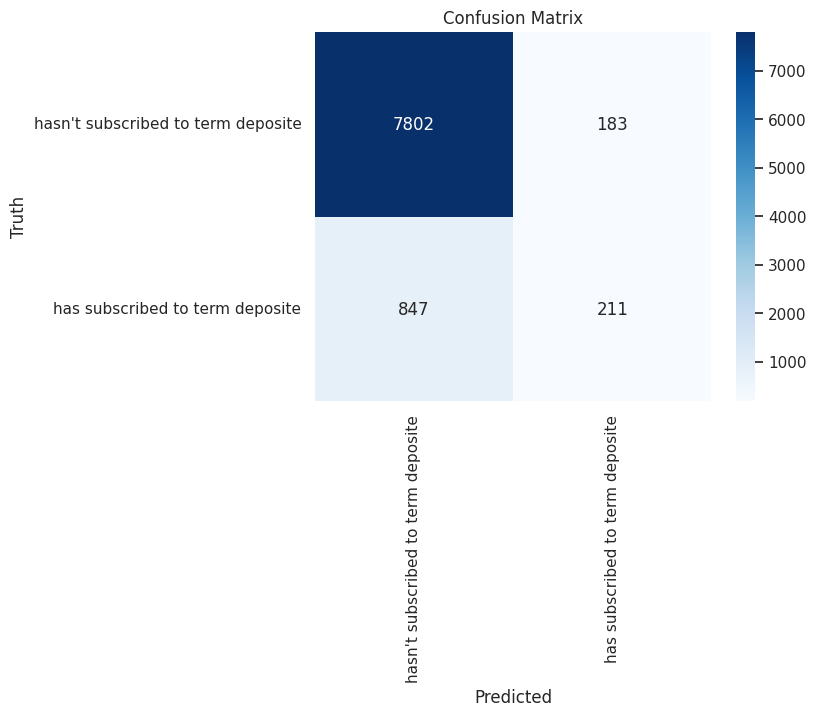

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      7985
           1       0.54      0.20      0.29      1058

    accuracy                           0.89      9043
   macro avg       0.72      0.59      0.61      9043
weighted avg       0.86      0.89      0.86      9043



# SVC

In [ ]:
from sklearn.svm  import SVC

In [ ]:
model = SVC(kernel='linear')

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
model.fit(x_train, y_train)

SVC(kernel='linear')

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
svm = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
svm

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.893177043016698

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7878,  107],
       [ 859,  199]])

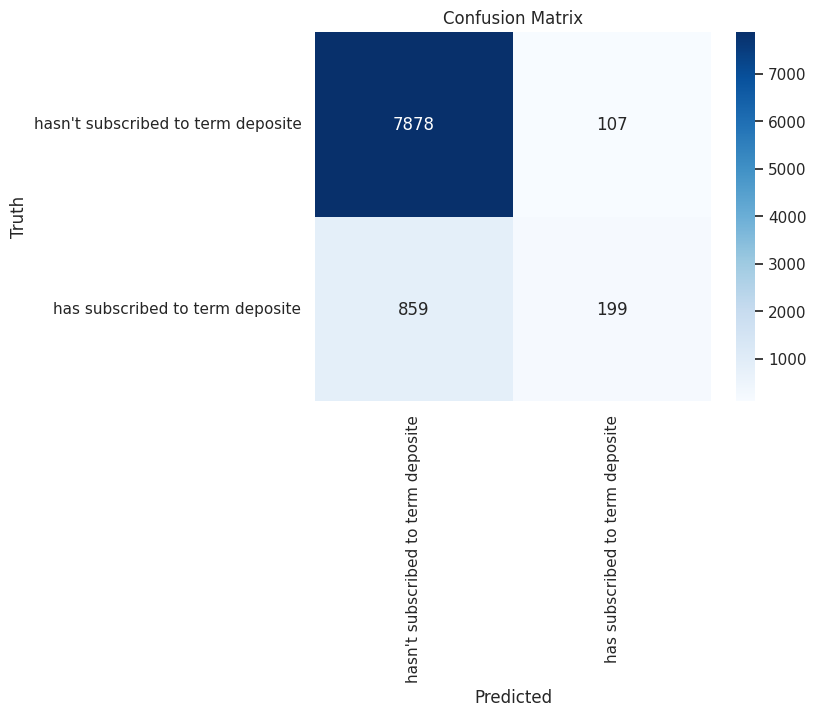

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

# **DECISION** **TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=46)
dt_model.fit(x_train, y_train)


DecisionTreeClassifier(random_state=46)

In [ ]:
y_pred_dt = dt_model.predict(x_test)


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred_dt)

0.8755943823952228

In [ ]:
from sklearn.metrics import confusion_matrix
# Ensure consistent train-test split before calculating confusion matrix

dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)
y_pred_dt = dt_model.predict(x_test)

cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[7409,  576],
       [ 540,  518]])

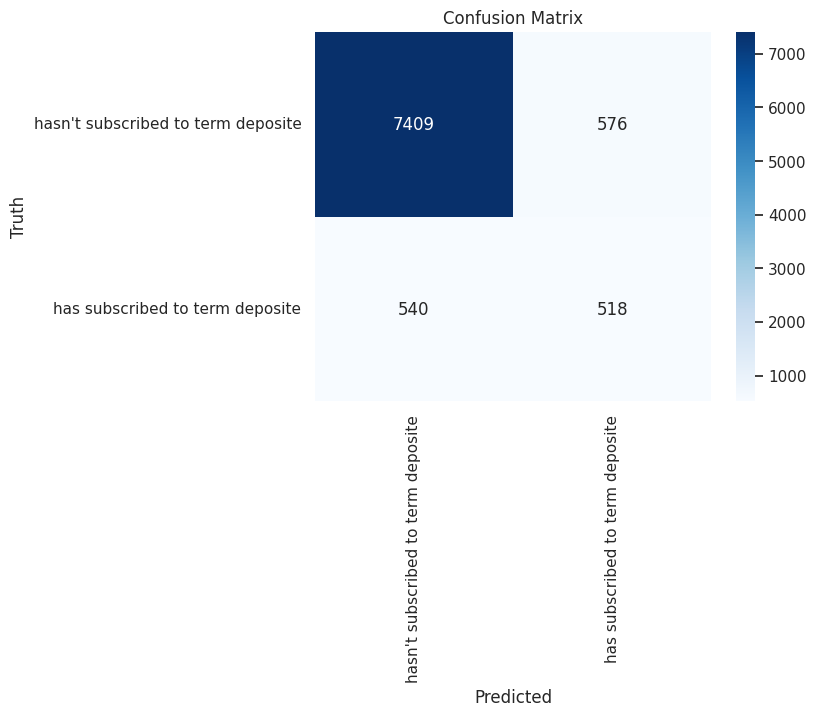

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      7985
           1       0.47      0.49      0.48      1058

    accuracy                           0.88      9043
   macro avg       0.70      0.71      0.71      9043
weighted avg       0.88      0.88      0.88      9043



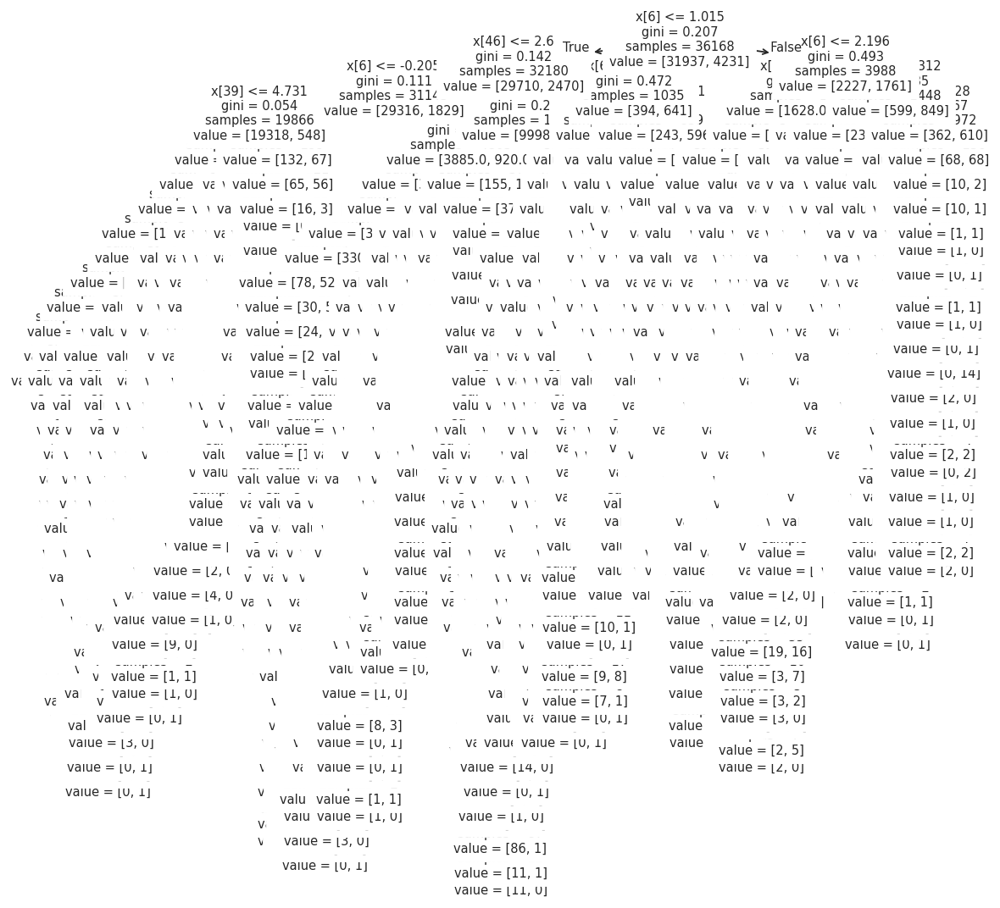

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(dt_model, fontsize=8)
plt.show()
#plt.savefig('out.pdf')

**Decision Tree Classifier Parameter**

In [ ]:
# Create Decision Tree Classifier object
clf = DecisionTreeClassifier(criterion="gini", max_depth=3) # 'gini', 'log_loss', 'entropy'

# Train Decision Tree Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred_dt = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_dt)

0.8997014265177485

In [ ]:
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[7769,  216],
       [ 691,  367]])

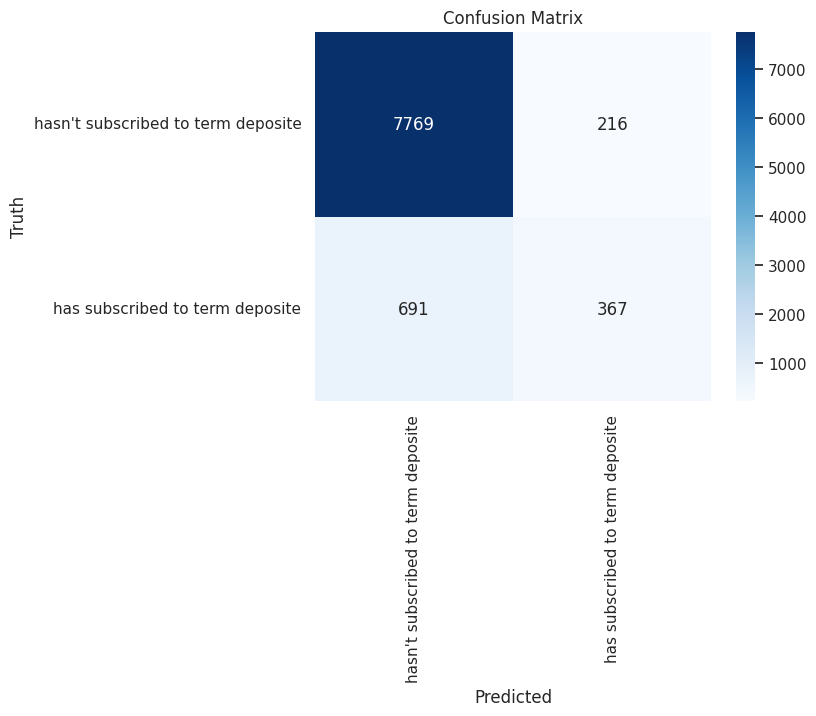

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      7985
           1       0.63      0.35      0.45      1058

    accuracy                           0.90      9043
   macro avg       0.77      0.66      0.70      9043
weighted avg       0.88      0.90      0.89      9043



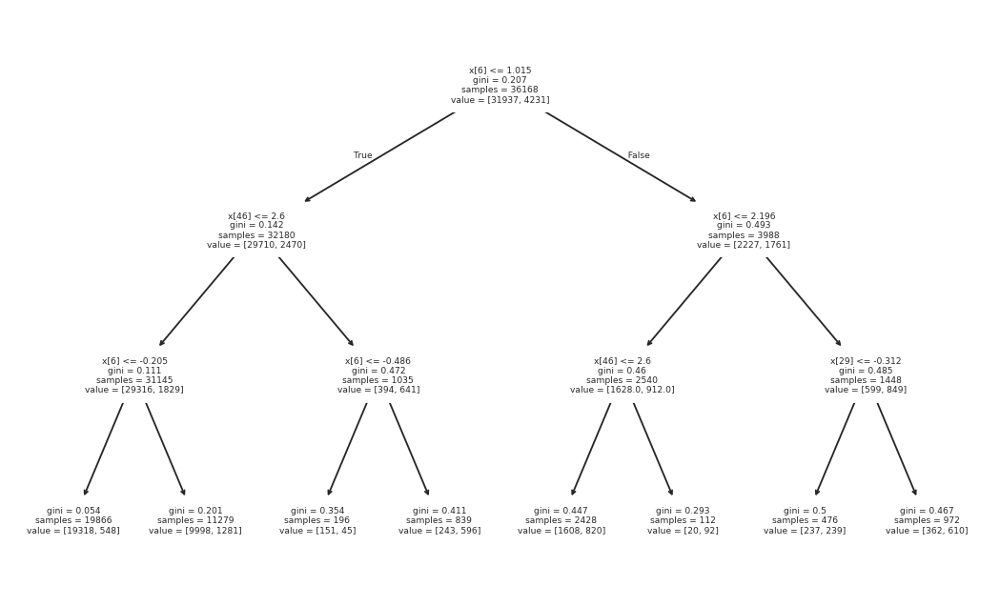

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

# **RANDOM** **FOREST**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model = RandomForestClassifier()

In [ ]:
model.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.906668141103616

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7779,  206],
       [ 638,  420]])

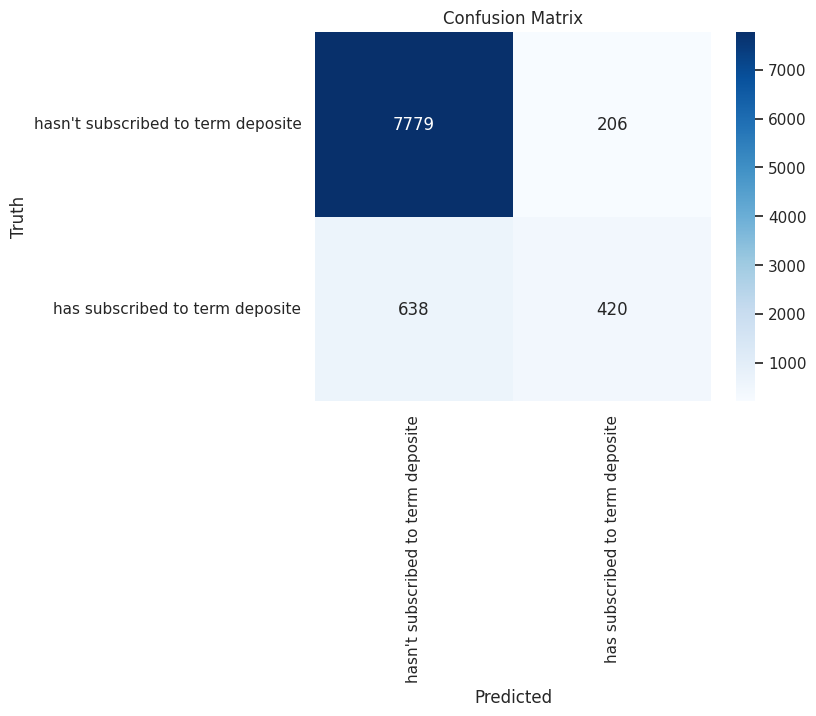

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      7985
           1       0.67      0.40      0.50      1058

    accuracy                           0.91      9043
   macro avg       0.80      0.69      0.72      9043
weighted avg       0.89      0.91      0.90      9043



**random classifier parameter**

In [ ]:
# Create Random Forest Classifier object
clf = RandomForestClassifier(n_estimators=200, criterion="gini", max_depth=10, bootstrap=True) # 'gini', 'log_loss', 'entropy'

# Train Random Forest Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.8967156916952339

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[7921,   64],
       [ 870,  188]])

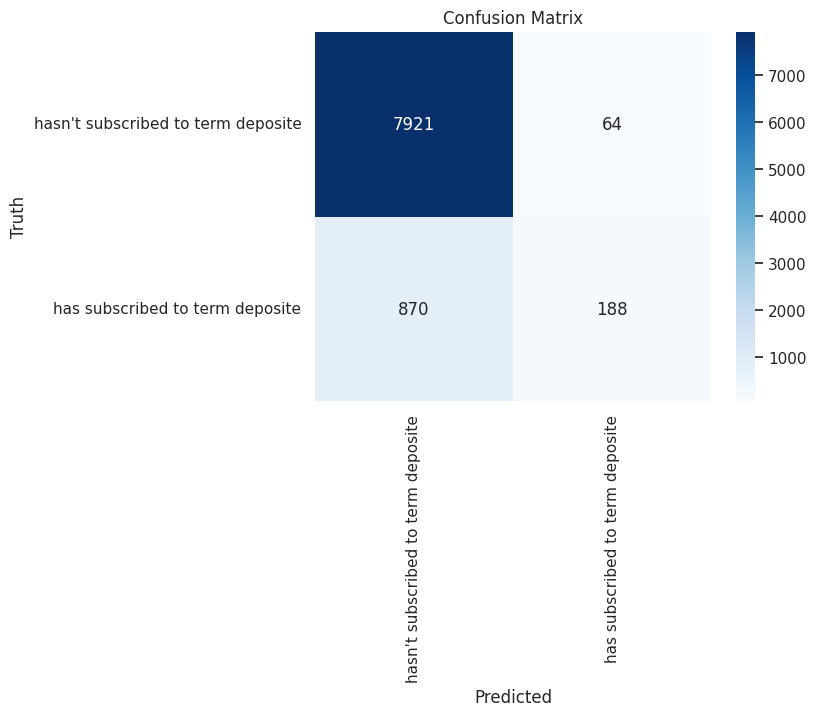

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.99      0.94      7985
           1       0.75      0.18      0.29      1058

    accuracy                           0.90      9043
   macro avg       0.82      0.58      0.62      9043
weighted avg       0.88      0.90      0.87      9043



## **BOOSTING**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
model = AdaBoostClassifier()

In [ ]:
model.fit(x_train, y_train)

AdaBoostClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8952781156695787

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7765,  220],
       [ 727,  331]])

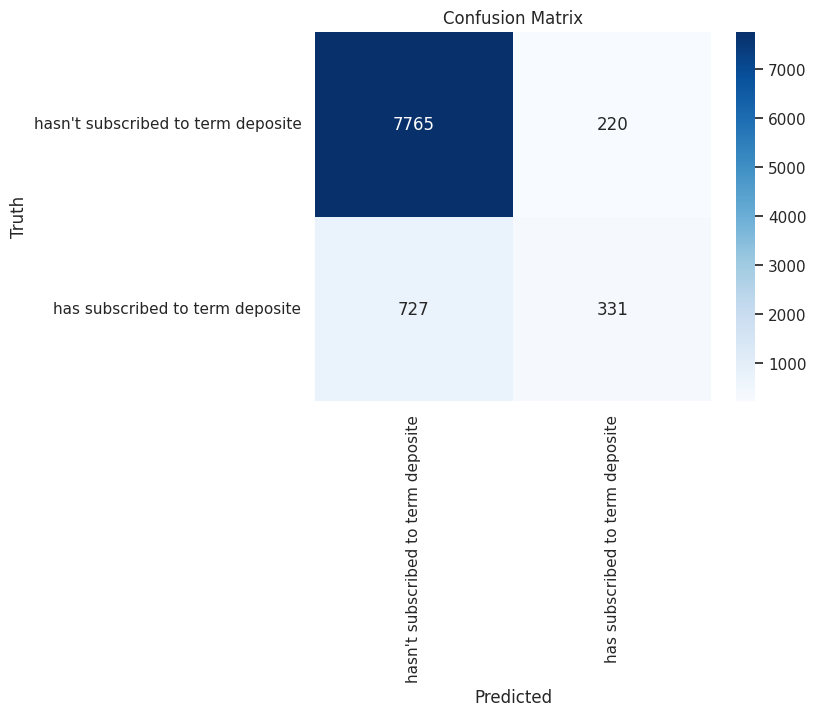

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      7985
           1       0.60      0.31      0.41      1058

    accuracy                           0.90      9043
   macro avg       0.76      0.64      0.68      9043
weighted avg       0.88      0.90      0.88      9043



In [ ]:
# Create Boosting Classifier object
from sklearn.ensemble import RandomForestClassifier
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9054517306203693

# **GARDIENT** **BOOSTING** **CLASSIFIER**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
model = GradientBoostingClassifier()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df= pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9054517306203693

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7754,  231],
       [ 624,  434]])

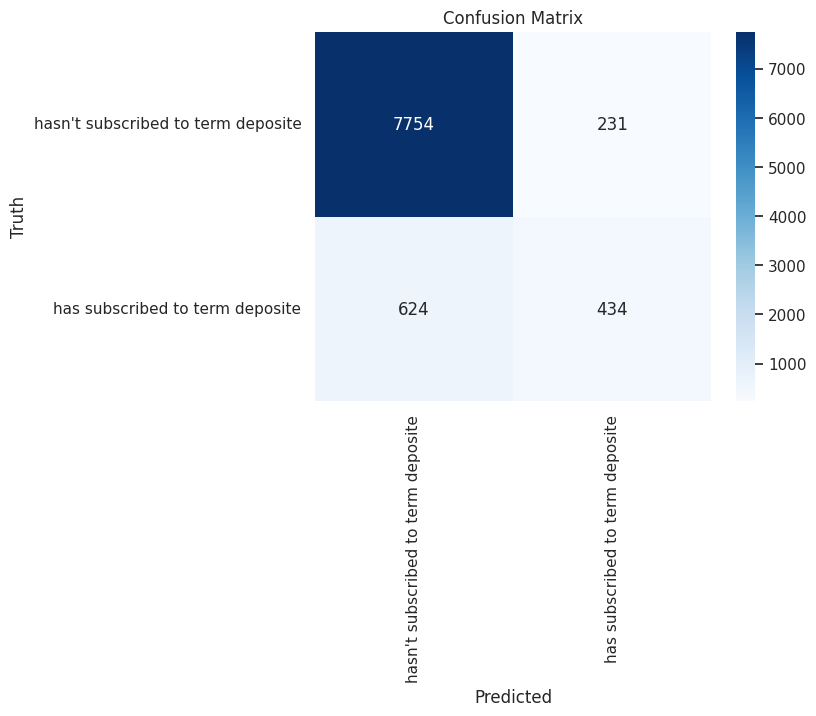

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      7985
           1       0.65      0.41      0.50      1058

    accuracy                           0.91      9043
   macro avg       0.79      0.69      0.73      9043
weighted avg       0.89      0.91      0.90      9043



Gardient boosting classifier parameter

In [ ]:
# Create Boosting Classifier object
br = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, loss='exponential', criterion='squared_error') #'exponential', 'log_loss'

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9050093995355524

## **XG BOOST**

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier()

In [ ]:
model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9054517306203693

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7686,  299],
       [ 556,  502]])

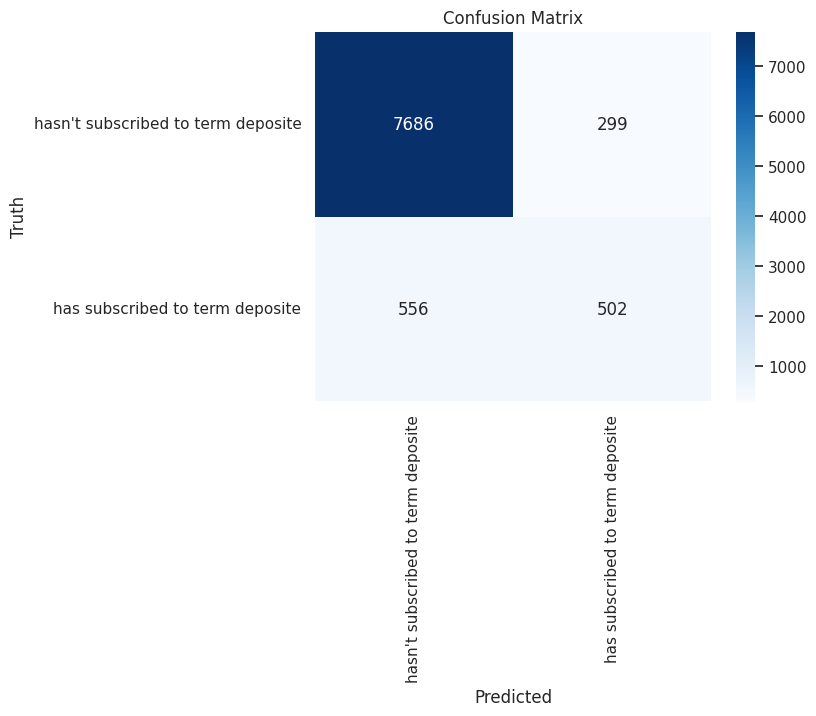

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.96      0.95      7985
           1       0.63      0.47      0.54      1058

    accuracy                           0.91      9043
   macro avg       0.78      0.72      0.74      9043
weighted avg       0.90      0.91      0.90      9043



XGBoosting Classifier Parameter

In [ ]:
# Create Boosting Classifier object
br = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9104279553245604

## **BAGGING**

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
model = BaggingClassifier()

In [ ]:
model.fit(x_train, y_train)

BaggingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
1392,0,0
7518,0,0
12007,0,0
5536,0,0
29816,0,0
...,...,...
12636,0,0
13364,0,0
16102,0,0
42097,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9055623133915736

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[7726,  259],
       [ 595,  463]])

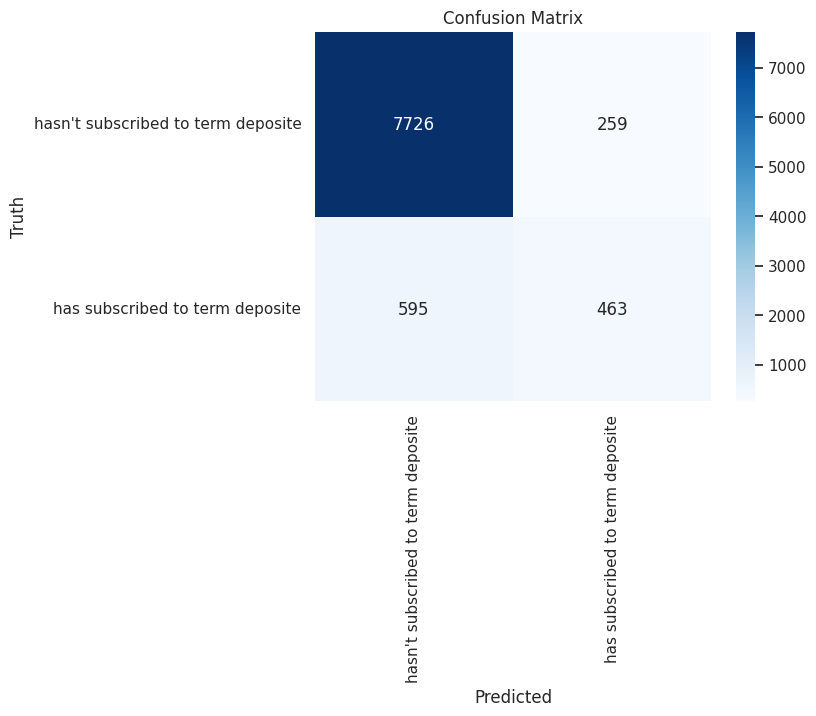

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      7985
           1       0.64      0.44      0.52      1058

    accuracy                           0.91      9043
   macro avg       0.78      0.70      0.73      9043
weighted avg       0.89      0.91      0.90      9043



**Bagging Classifier Parameter**

In [ ]:
# Create Bagging Classifier object
from sklearn.tree import DecisionTreeClassifier
base_estimator = DecisionTreeClassifier(max_depth=3, random_state=32)
br = BaggingClassifier(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.899922592060157

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[7793,  192],
       [ 713,  345]])

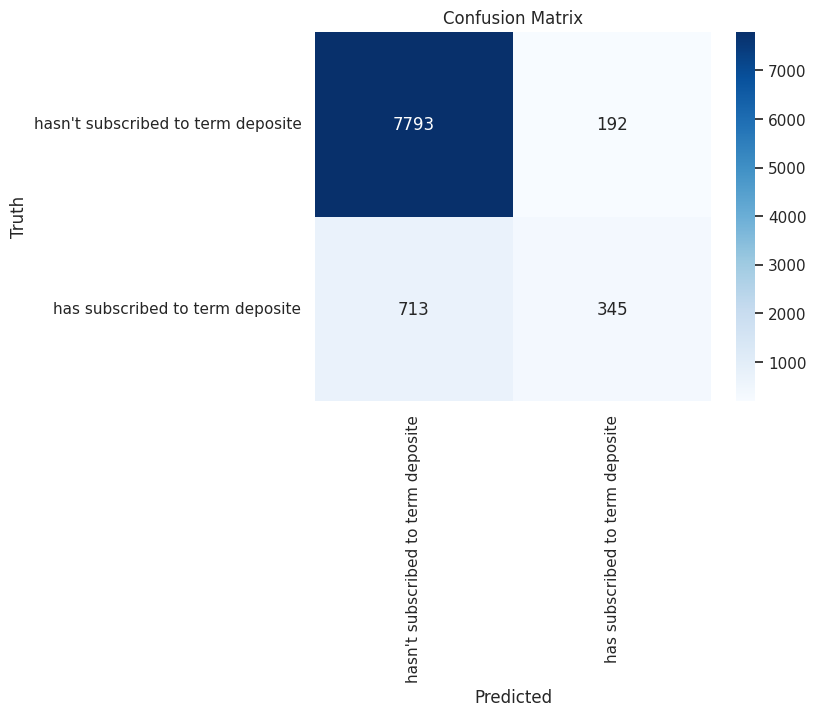

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95      7985
           1       0.64      0.33      0.43      1058

    accuracy                           0.90      9043
   macro avg       0.78      0.65      0.69      9043
weighted avg       0.88      0.90      0.89      9043



# **MODELS(75:25)**

In [ ]:
x = df.drop(columns=["y"])
y = df["y"]
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.25, stratify=y, random_state=42)

In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
24915,58,0,0,1,0,18,265,1,188,1,...,0,0,0,1,0,0,1,0,0,0
11794,47,0,287,0,0,20,63,1,-1,0,...,1,0,0,0,0,0,0,0,0,1
1279,35,0,797,1,0,8,81,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
913,34,0,627,1,0,7,283,2,-1,0,...,0,0,1,0,0,0,0,0,0,1
5554,35,0,91,1,0,23,185,4,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10010,41,0,1113,1,1,9,388,12,-1,0,...,1,0,0,0,0,0,0,0,0,1
26216,40,0,1547,1,0,20,405,1,-1,0,...,0,0,0,1,0,0,0,0,0,1
15941,36,0,22,1,0,22,77,5,-1,0,...,0,0,0,0,0,0,0,0,0,1
16952,45,0,79,1,0,25,98,1,-1,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
y_train

,y
24915,0
11794,0
1279,0
913,0
5554,0
...,...
10010,0
26216,1
15941,0
16952,0


In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
24915,58,0,0,1,0,18,265,1,188,1,...,0,0,0,1,0,0,1,0,0,0
11794,47,0,287,0,0,20,63,1,-1,0,...,1,0,0,0,0,0,0,0,0,1
1279,35,0,797,1,0,8,81,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
913,34,0,627,1,0,7,283,2,-1,0,...,0,0,1,0,0,0,0,0,0,1
5554,35,0,91,1,0,23,185,4,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10010,41,0,1113,1,1,9,388,12,-1,0,...,1,0,0,0,0,0,0,0,0,1
26216,40,0,1547,1,0,20,405,1,-1,0,...,0,0,0,1,0,0,0,0,0,1
15941,36,0,22,1,0,22,77,5,-1,0,...,0,0,0,0,0,0,0,0,0,1
16952,45,0,79,1,0,25,98,1,-1,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
y_train

,y
24915,0
11794,0
1279,0
913,0
5554,0
...,...
10010,0
26216,1
15941,0
16952,0


# LOGISTIC

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

In [ ]:
x

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
1,44,0,29,1,0,5,151,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
2,33,0,2,1,1,5,76,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
3,47,0,1506,1,0,5,92,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,977,3,-1,0,...,0,0,0,1,0,0,0,0,0,1
45207,71,0,1729,0,0,17,456,2,-1,0,...,0,0,0,1,0,0,0,0,0,1
45208,72,0,5715,0,0,17,1127,5,184,3,...,0,0,0,1,0,0,0,0,1,0
45209,57,0,668,0,0,17,508,4,-1,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
y

,y
0,0
1,0
2,0
3,0
4,0
...,...
45206,1
45207,1
45208,1
45209,0


In [ ]:
# fit a logistic regression model and store the class predictions
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=1e9)

logreg.fit(x_train, y_train)
predictions = logreg.predict(x_test)
print(predictions)

[0 0 0 ... 0 0 0]


confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
z=confusion_matrix(y_test, predictions)
z

array([[9769,  212],
       [1045,  277]])

accuracy

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,predictions)

0.8887905865699371

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94      9981
           1       0.57      0.21      0.31      1322

    accuracy                           0.89     11303
   macro avg       0.73      0.59      0.62     11303
weighted avg       0.86      0.89      0.87     11303



## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
model = KNeighborsClassifier(n_neighbors=25)

In [ ]:
model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [ ]:
y_pred = model.predict(x_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
knn = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
knn

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


Evaluation Metric

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8846323984782801

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9731,  250],
       [1054,  268]])

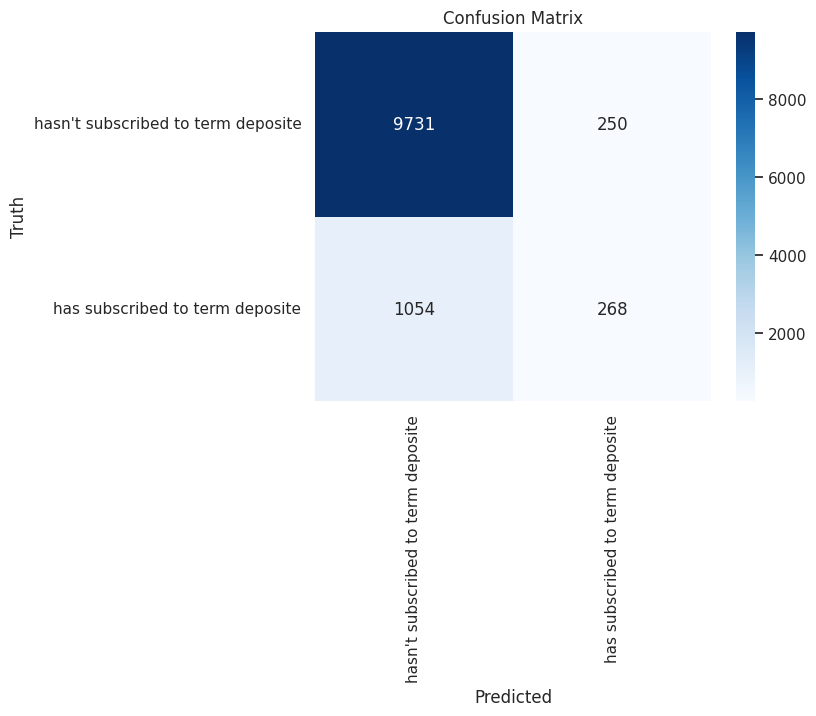

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.97      0.94      9981
           1       0.52      0.20      0.29      1322

    accuracy                           0.88     11303
   macro avg       0.71      0.59      0.61     11303
weighted avg       0.86      0.88      0.86     11303



# SVC

In [ ]:
from sklearn.svm  import SVC

In [ ]:
model = SVC(kernel='linear')

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
model.fit(x_train, y_train)

SVC(kernel='linear')

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
svm = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
svm

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8943643280544988

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9851,  130],
       [1064,  258]])

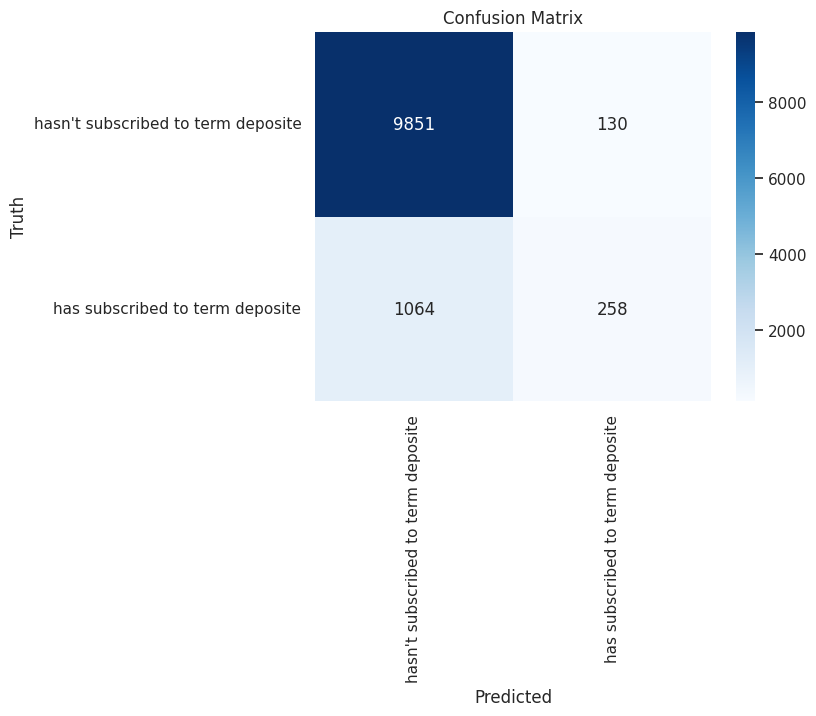

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

# **DECISION** **TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=46)
dt_model.fit(x_train, y_train)


DecisionTreeClassifier(random_state=46)

In [ ]:
y_pred_dt = dt_model.predict(x_test)


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred_dt)

0.8775546315137575

In [ ]:
from sklearn.metrics import confusion_matrix
# Ensure consistent train-test split before calculating confusion matrix

dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)
y_pred_dt = dt_model.predict(x_test)

cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[9277,  704],
       [ 694,  628]])

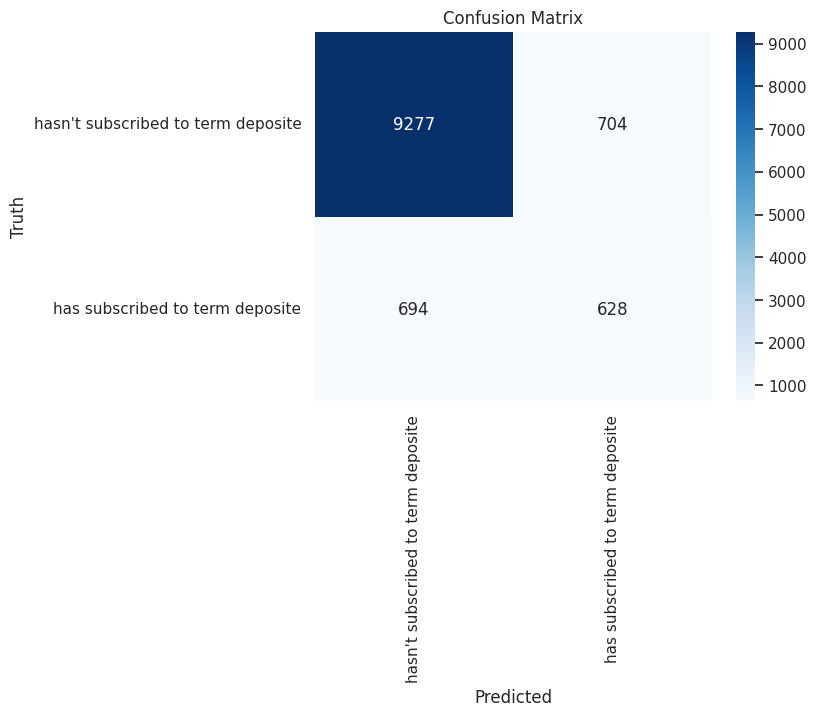

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.93      0.93      9981
           1       0.47      0.48      0.47      1322

    accuracy                           0.88     11303
   macro avg       0.70      0.70      0.70     11303
weighted avg       0.88      0.88      0.88     11303



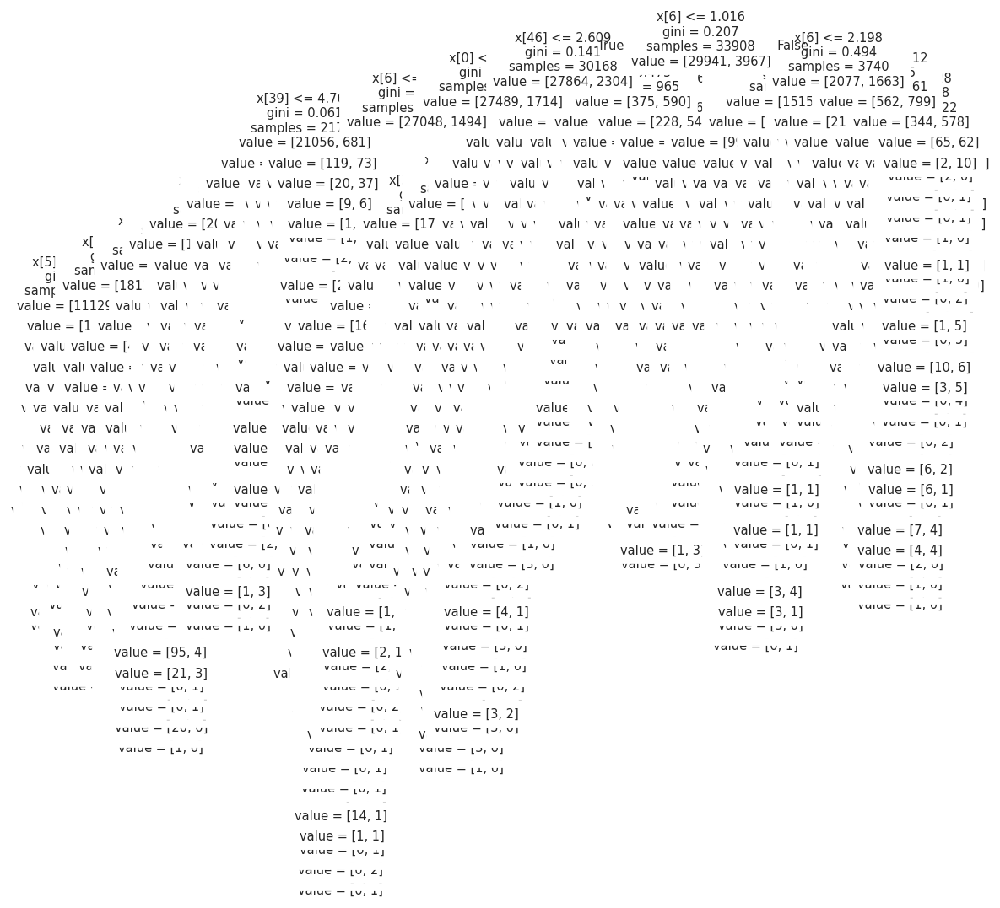

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(dt_model, fontsize=8)
plt.show()
#plt.savefig('out.pdf')

**Decision Tree Classifier Parameter**

In [ ]:
# Create Decision Tree Classifier object
clf = DecisionTreeClassifier(criterion="gini", max_depth=3) # 'gini', 'log_loss', 'entropy'

# Train Decision Tree Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred_dt = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_dt)

0.9003804299743431

In [ ]:
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[9709,  272],
       [ 854,  468]])

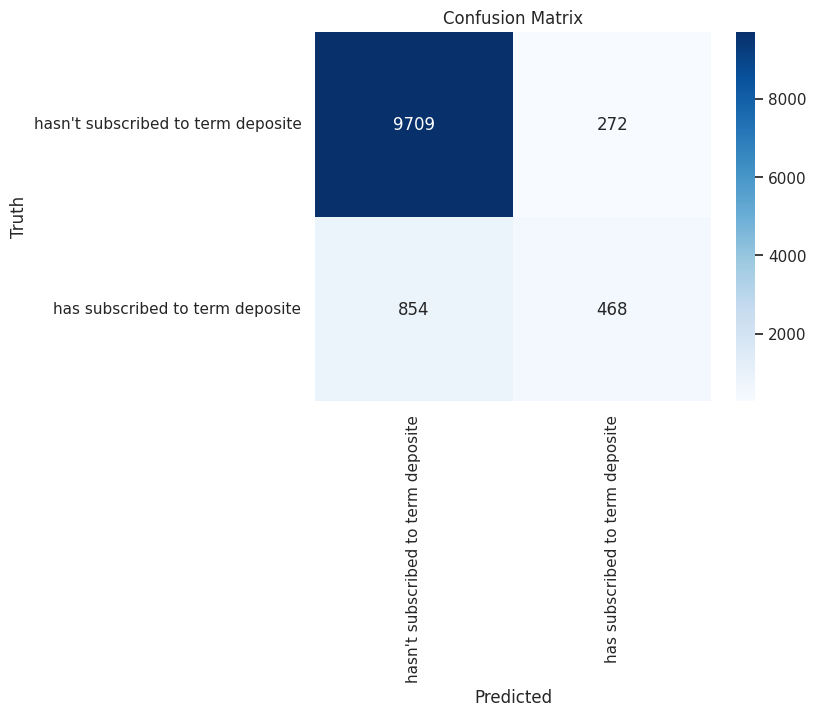

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95      9981
           1       0.63      0.35      0.45      1322

    accuracy                           0.90     11303
   macro avg       0.78      0.66      0.70     11303
weighted avg       0.89      0.90      0.89     11303



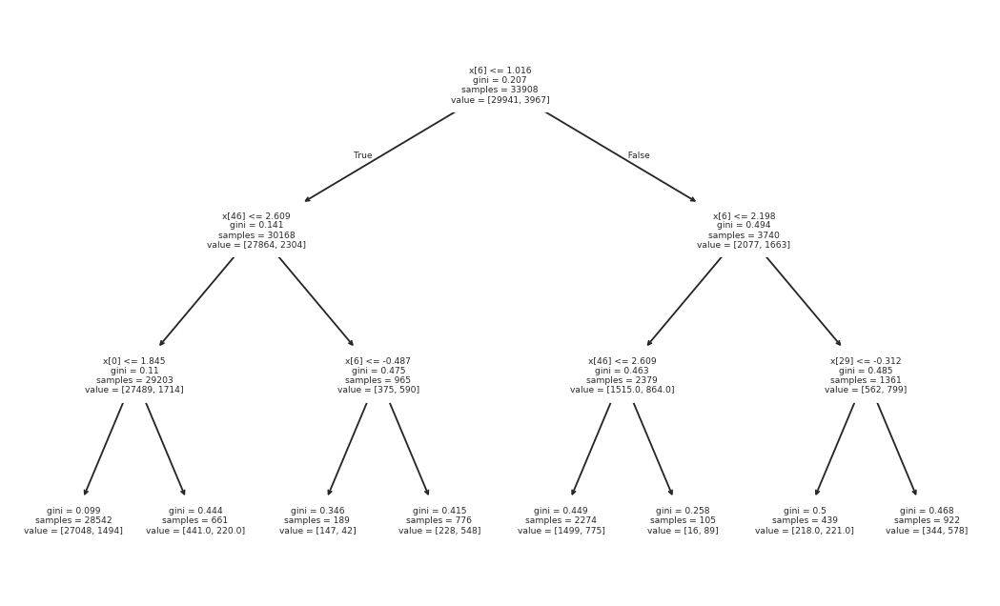

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

# **RANDOM** **FOREST**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model = RandomForestClassifier()

In [ ]:
model.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9067504202424135

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9739,  242],
       [ 812,  510]])

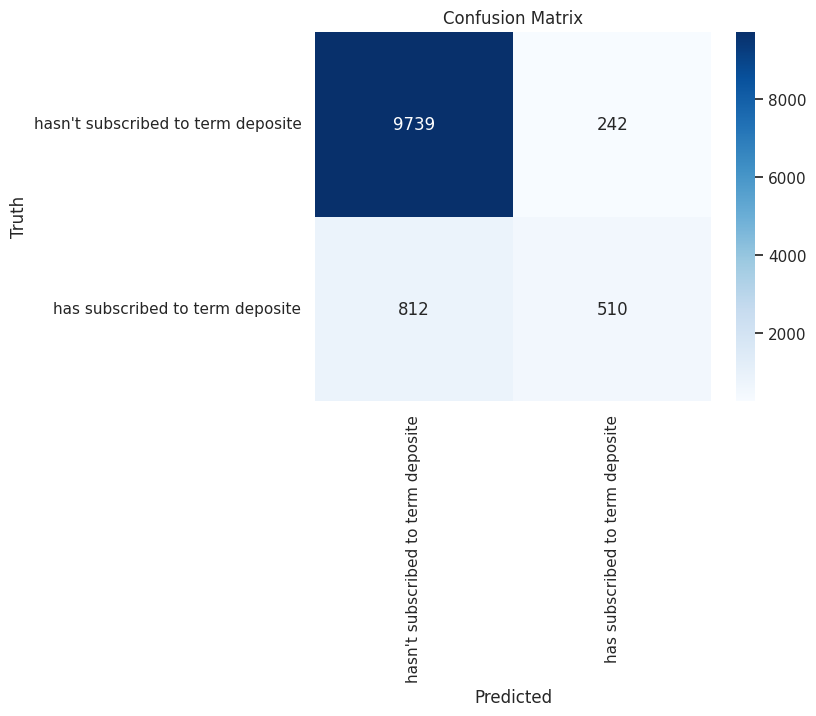

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95      9981
           1       0.68      0.39      0.49      1322

    accuracy                           0.91     11303
   macro avg       0.80      0.68      0.72     11303
weighted avg       0.89      0.91      0.90     11303



**random classifier parameter**

In [ ]:
# Create Random Forest Classifier object
clf = RandomForestClassifier(n_estimators=200, criterion="gini", max_depth=10, bootstrap=True) # 'gini', 'log_loss', 'entropy'

# Train Random Forest Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.8987879324073255

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[9905,   76],
       [1068,  254]])

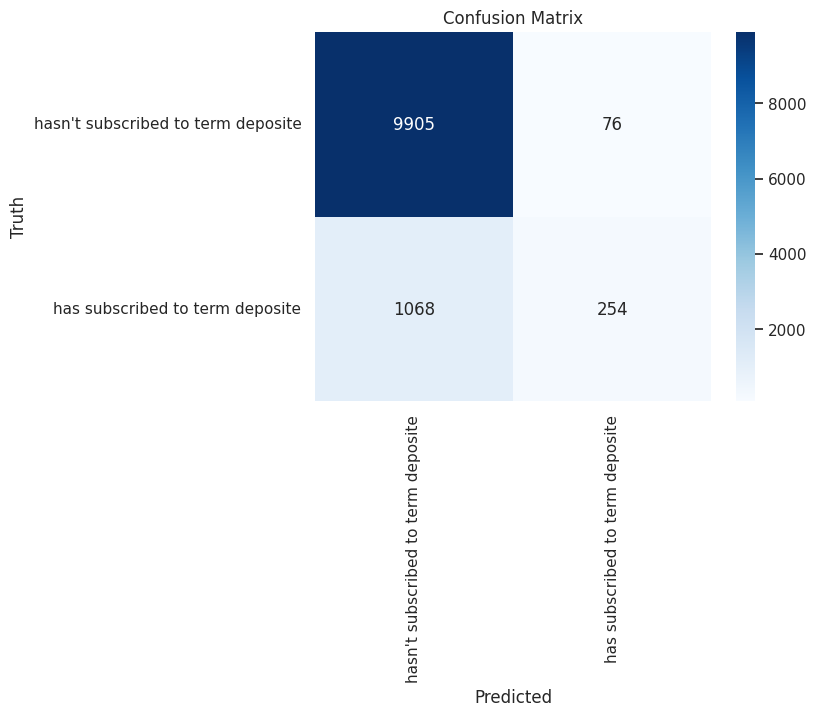

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.99      0.95      9981
           1       0.77      0.19      0.31      1322

    accuracy                           0.90     11303
   macro avg       0.84      0.59      0.63     11303
weighted avg       0.89      0.90      0.87     11303



**`BOOSTING`**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
model = AdaBoostClassifier()

In [ ]:
model.fit(x_train, y_train)

1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.9385 - loss: 0.1438 - precision: 0.7663 - recall: 0.6826


In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.897549323188534

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9731,  250],
       [ 908,  414]])

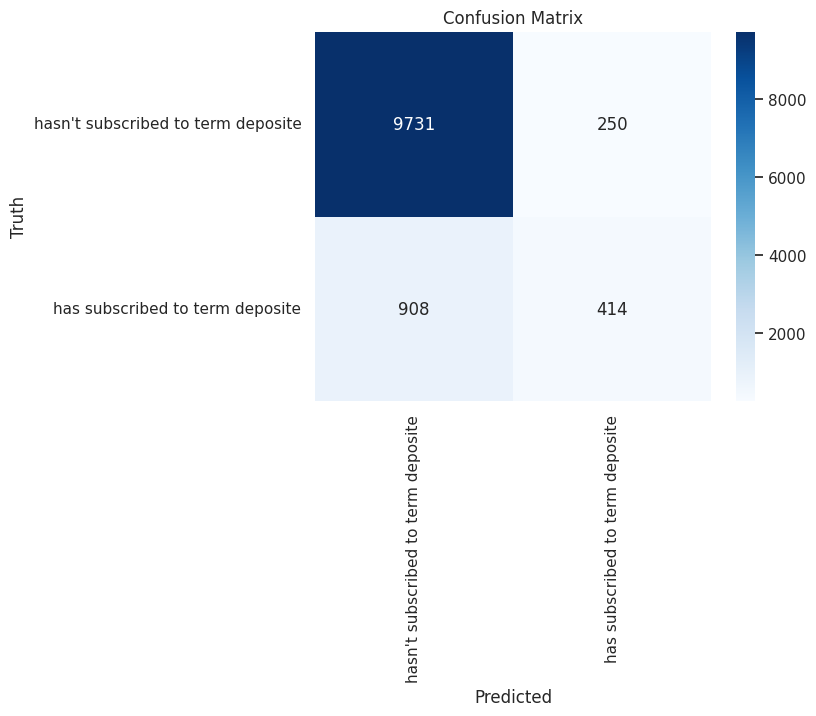

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.97      0.94      9981
           1       0.62      0.31      0.42      1322

    accuracy                           0.90     11303
   macro avg       0.77      0.64      0.68     11303
weighted avg       0.88      0.90      0.88     11303



In [ ]:
# Create Boosting Classifier object
from sklearn.ensemble import RandomForestClassifier
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9049809785012829

# **GARDIENT** **BOOSTING** **CLASSIFIER**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
model = GradientBoostingClassifier()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df= pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9056887551977351

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9693,  288],
       [ 778,  544]])

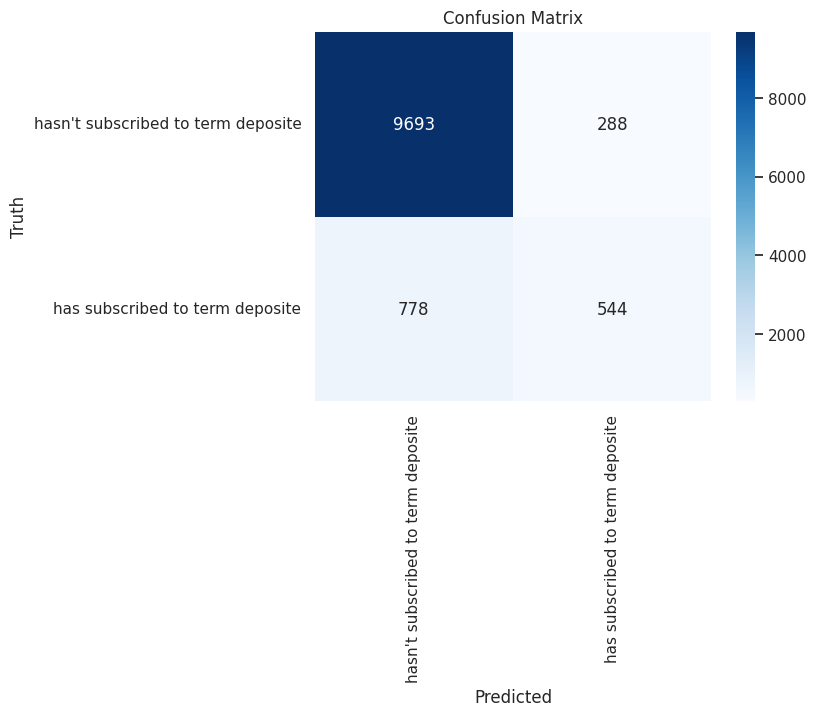

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.97      0.95      9981
           1       0.65      0.41      0.51      1322

    accuracy                           0.91     11303
   macro avg       0.79      0.69      0.73     11303
weighted avg       0.89      0.91      0.90     11303



Gardient boosting classifier parameter

In [ ]:
# Create Boosting Classifier object
br = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, loss='exponential', criterion='squared_error') #'exponential', 'log_loss'

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.905334866849509

# XG_BOOSTING

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier()

In [ ]:
model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9074581969388658

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9614,  367],
       [ 679,  643]])

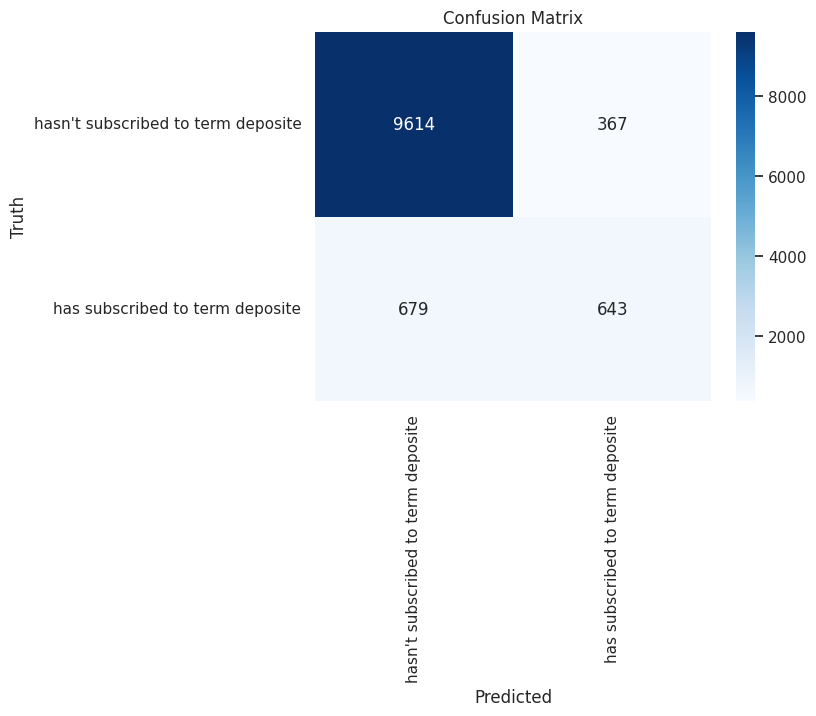

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.96      0.95      9981
           1       0.64      0.49      0.55      1322

    accuracy                           0.91     11303
   macro avg       0.79      0.72      0.75     11303
weighted avg       0.90      0.91      0.90     11303



XGBoosting Classifier Parameter

In [ ]:
# Create Boosting Classifier object
br = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.909316110767053

**BAGGING**

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
model = BaggingClassifier()

In [ ]:
model.fit(x_train, y_train)

BaggingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
22684,0,0
30384,0,0
10483,0,0
8732,0,0
21614,0,0
...,...,...
1675,0,0
35592,0,0
34506,0,0
13514,0,1


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9005573741484562

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[9631,  350],
       [ 774,  548]])

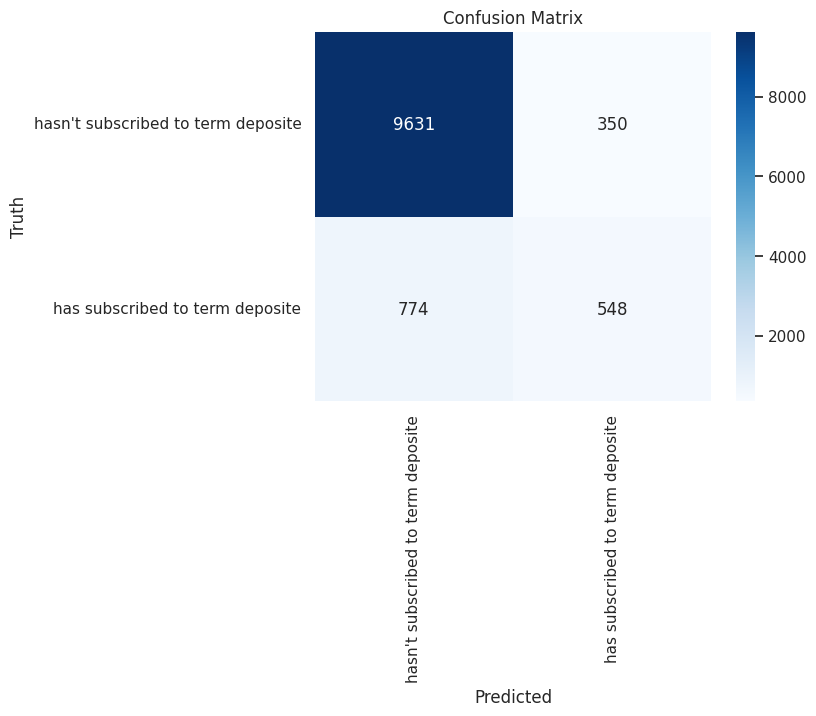

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.96      0.94      9981
           1       0.61      0.41      0.49      1322

    accuracy                           0.90     11303
   macro avg       0.77      0.69      0.72     11303
weighted avg       0.89      0.90      0.89     11303



**Bagging Classifier Parameter**

In [ ]:
# Create Bagging Classifier object
from sklearn.tree import DecisionTreeClassifier
base_estimator = DecisionTreeClassifier(max_depth=3, random_state=32)
br = BaggingClassifier(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.8994957091037777

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[9722,  259],
       [ 877,  445]])

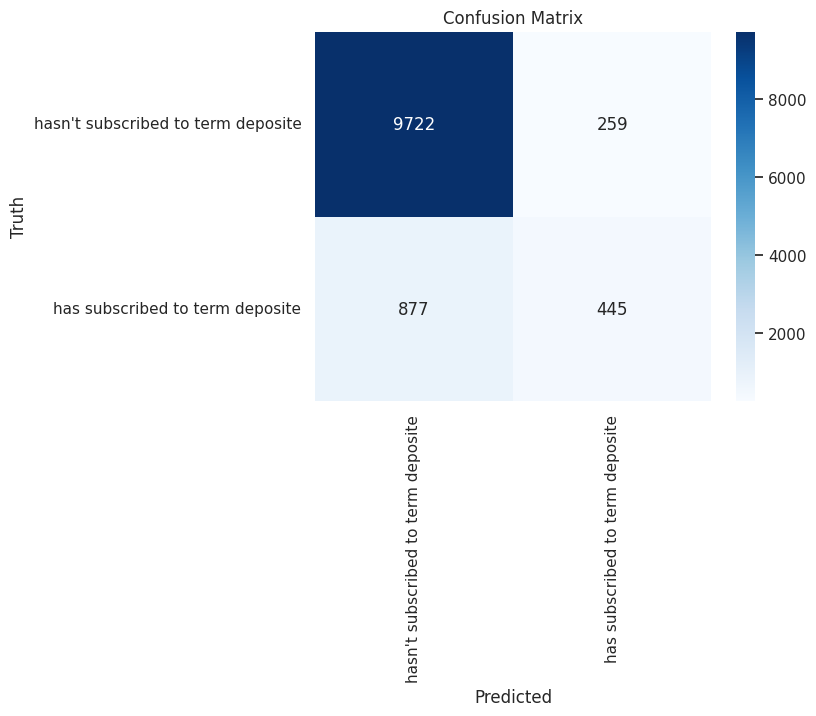

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.94      9981
           1       0.63      0.34      0.44      1322

    accuracy                           0.90     11303
   macro avg       0.77      0.66      0.69     11303
weighted avg       0.88      0.90      0.89     11303



# **MODELS(60:40)**

In [ ]:
x = df.drop(columns=["y"])
y = df["y"]
x_train, x_test, y_train, y_test = train_test_split(x, y,test_size=0.4, stratify=y, random_state=42)

In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
217,53,0,13,0,0,5,410,3,-1,0,...,0,0,1,0,0,0,0,0,0,1
34160,54,0,0,0,0,30,766,3,84,3,...,0,0,0,0,0,0,0,0,1,0
34607,30,0,280,0,0,5,92,3,-1,0,...,0,0,1,0,0,0,0,0,0,1
447,50,0,-84,1,0,6,101,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
23636,60,0,1690,0,0,28,64,11,-1,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14003,29,0,482,0,1,10,1097,3,-1,0,...,0,0,0,0,0,0,0,0,0,1
6317,30,0,1196,0,0,27,147,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
34781,27,0,2559,1,0,6,227,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
13679,32,0,0,1,0,9,90,1,-1,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
y_train

,y
217,0
34160,1
34607,0
447,0
23636,0
...,...
14003,1
6317,0
34781,0
13679,0


In [ ]:
x_train

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
217,53,0,13,0,0,5,410,3,-1,0,...,0,0,1,0,0,0,0,0,0,1
34160,54,0,0,0,0,30,766,3,84,3,...,0,0,0,0,0,0,0,0,1,0
34607,30,0,280,0,0,5,92,3,-1,0,...,0,0,1,0,0,0,0,0,0,1
447,50,0,-84,1,0,6,101,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
23636,60,0,1690,0,0,28,64,11,-1,0,...,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14003,29,0,482,0,1,10,1097,3,-1,0,...,0,0,0,0,0,0,0,0,0,1
6317,30,0,1196,0,0,27,147,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
34781,27,0,2559,1,0,6,227,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
13679,32,0,0,1,0,9,90,1,-1,0,...,0,0,0,0,0,0,0,0,0,1


In [ ]:
y_train

,y
217,0
34160,1
34607,0
447,0
23636,0
...,...
14003,1
6317,0
34781,0
13679,0


# LOGISTIC

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

In [ ]:
x

,age,default,balance,housing,loan,day,duration,campaign,pdays,previous,...,month_jun,month_mar,month_may,month_nov,month_oct,month_sep,poutcome_failure,poutcome_other,poutcome_success,poutcome_unknown
0,58,0,2143,1,0,5,261,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
1,44,0,29,1,0,5,151,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
2,33,0,2,1,1,5,76,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
3,47,0,1506,1,0,5,92,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
4,33,0,1,0,0,5,198,1,-1,0,...,0,0,1,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
45206,51,0,825,0,0,17,977,3,-1,0,...,0,0,0,1,0,0,0,0,0,1
45207,71,0,1729,0,0,17,456,2,-1,0,...,0,0,0,1,0,0,0,0,0,1
45208,72,0,5715,0,0,17,1127,5,184,3,...,0,0,0,1,0,0,0,0,1,0
45209,57,0,668,0,0,17,508,4,-1,0,...,0,0,0,1,0,0,0,0,0,1


In [ ]:
y

,y
0,0
1,0
2,0
3,0
4,0
...,...
45206,1
45207,1
45208,1
45209,0


In [ ]:
# fit a logistic regression model and store the class predictions
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=1e9)

logreg.fit(x_train, y_train)
predictions = logreg.predict(x_test)
print(predictions)

[0 0 0 ... 0 0 0]


confusion matrix

In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
z=confusion_matrix(y_test, predictions)
z

array([[15648,   321],
       [ 1672,   444]])

accuracy

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,predictions)

0.889798175283384

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     15969
           1       0.58      0.21      0.31      2116

    accuracy                           0.89     18085
   macro avg       0.74      0.59      0.62     18085
weighted avg       0.87      0.89      0.87     18085



## KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
model = KNeighborsClassifier(n_neighbors=25)

In [ ]:
model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [ ]:
y_pred = model.predict(x_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
knn = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
knn

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


Evaluation Metric

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8864805087088747

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15642,   327],
       [ 1726,   390]])

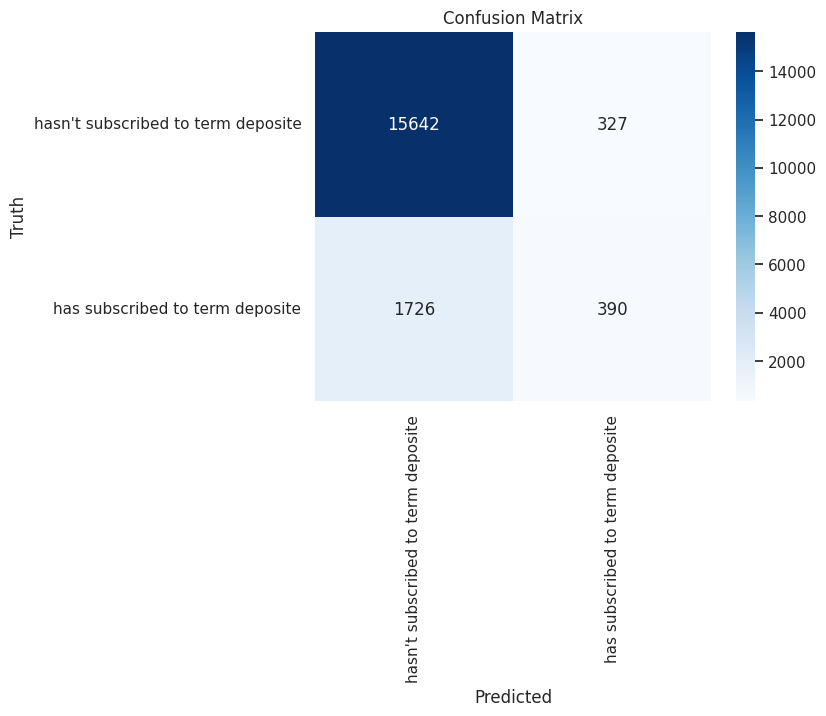

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite", "has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     15969
           1       0.54      0.18      0.28      2116

    accuracy                           0.89     18085
   macro avg       0.72      0.58      0.61     18085
weighted avg       0.86      0.89      0.86     18085



# SVC

In [ ]:
from sklearn.svm  import SVC

In [ ]:
model = SVC(kernel='linear')

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)


In [ ]:
model.fit(x_train, y_train)

SVC(kernel='linear')

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
svm = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
svm

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8948852640309649

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15759,   210],
       [ 1691,   425]])

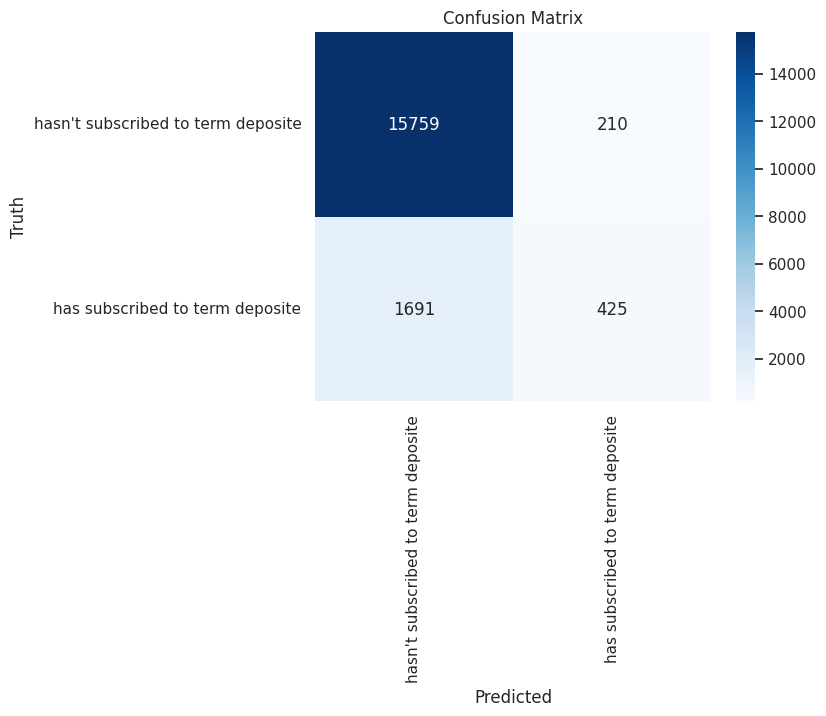

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

# **DECISION** **TREE**

In [ ]:
from sklearn.tree import DecisionTreeClassifier, plot_tree
# Create and train the Decision Tree model
dt_model = DecisionTreeClassifier(random_state=46)
dt_model.fit(x_train, y_train)


DecisionTreeClassifier(random_state=46)

In [ ]:
y_pred_dt = dt_model.predict(x_test)


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred_dt)

0.8785181089300526

In [ ]:
from sklearn.metrics import confusion_matrix
# Ensure consistent train-test split before calculating confusion matrix

dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)
y_pred_dt = dt_model.predict(x_test)

cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[14816,  1153],
       [ 1104,  1012]])

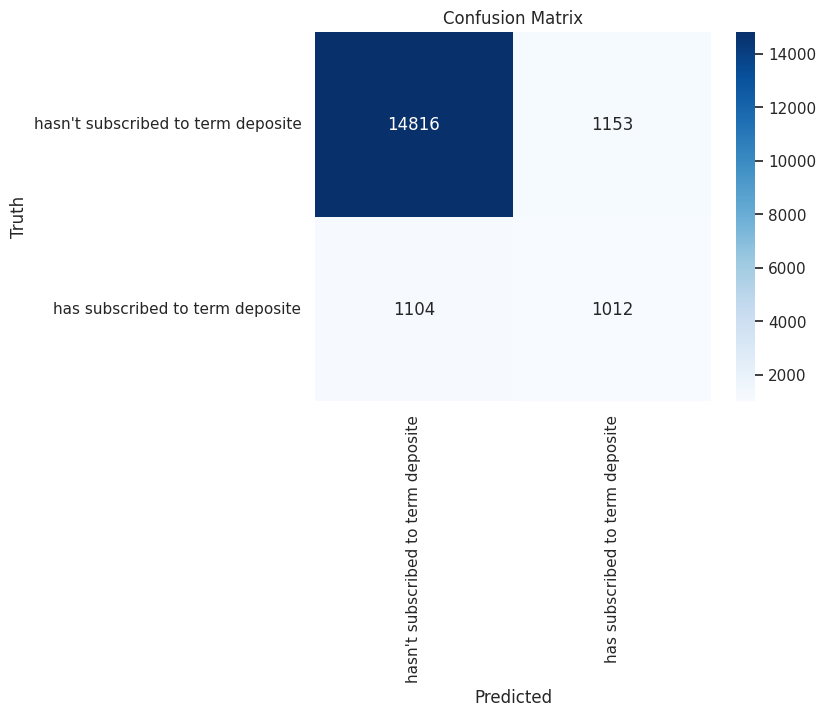

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.93      0.93     15969
           1       0.47      0.48      0.47      2116

    accuracy                           0.88     18085
   macro avg       0.70      0.70      0.70     18085
weighted avg       0.88      0.88      0.88     18085



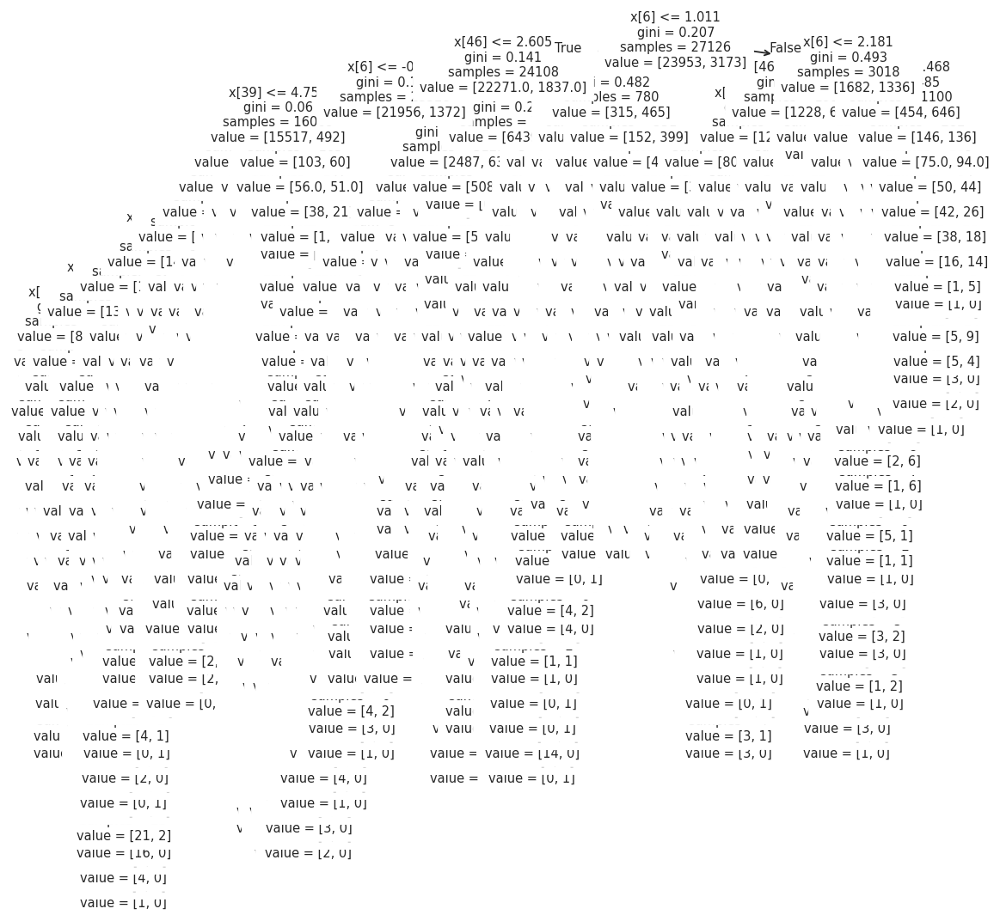

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(dt_model, fontsize=8)
plt.show()
#plt.savefig('out.pdf')

**Decision Tree Classifier Parameter**

In [ ]:
# Create Decision Tree Classifier object
clf = DecisionTreeClassifier(criterion="gini", max_depth=3) # 'gini', 'log_loss', 'entropy'

# Train Decision Tree Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred_dt = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_dt)

0.9007464749792646

In [ ]:
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[15660,   309],
       [ 1486,   630]])

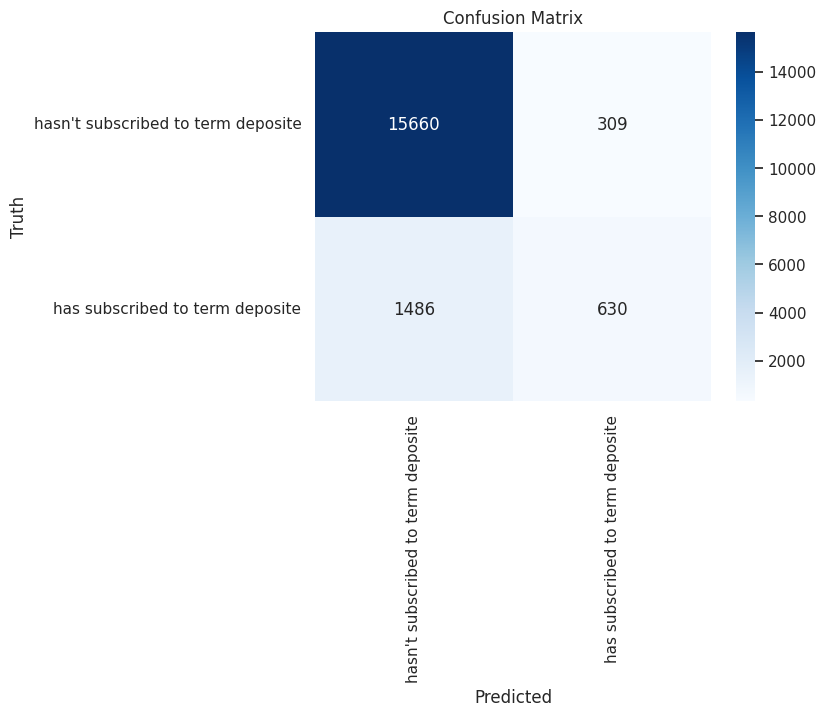

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.98      0.95     15969
           1       0.67      0.30      0.41      2116

    accuracy                           0.90     18085
   macro avg       0.79      0.64      0.68     18085
weighted avg       0.88      0.90      0.88     18085



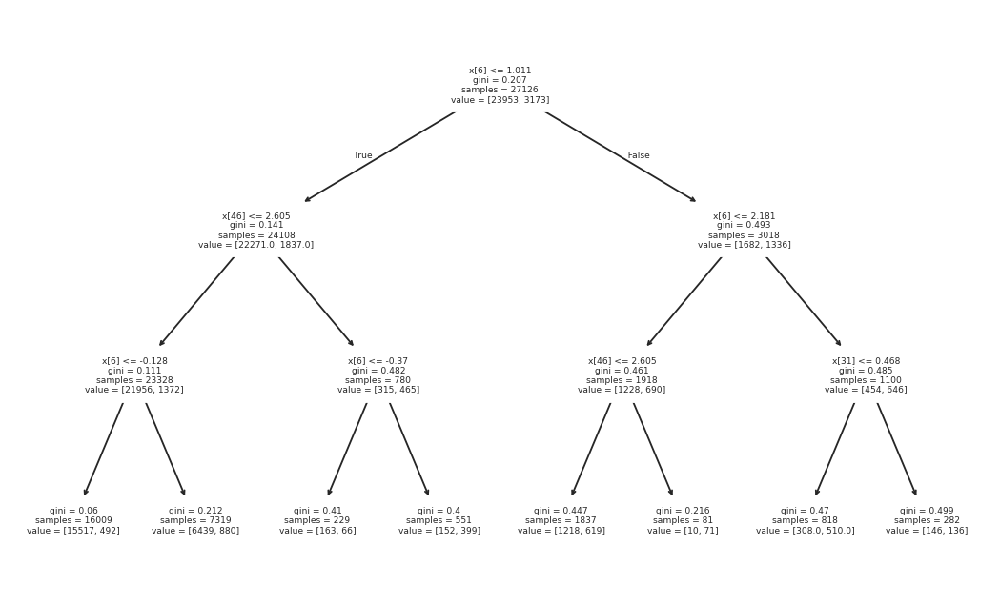

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

# **RANDOM** **FOREST**

In [ ]:
from sklearn.ensemble import RandomForestClassifier

In [ ]:
model = RandomForestClassifier()

In [ ]:
model.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.907934752557368

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15612,   357],
       [ 1308,   808]])

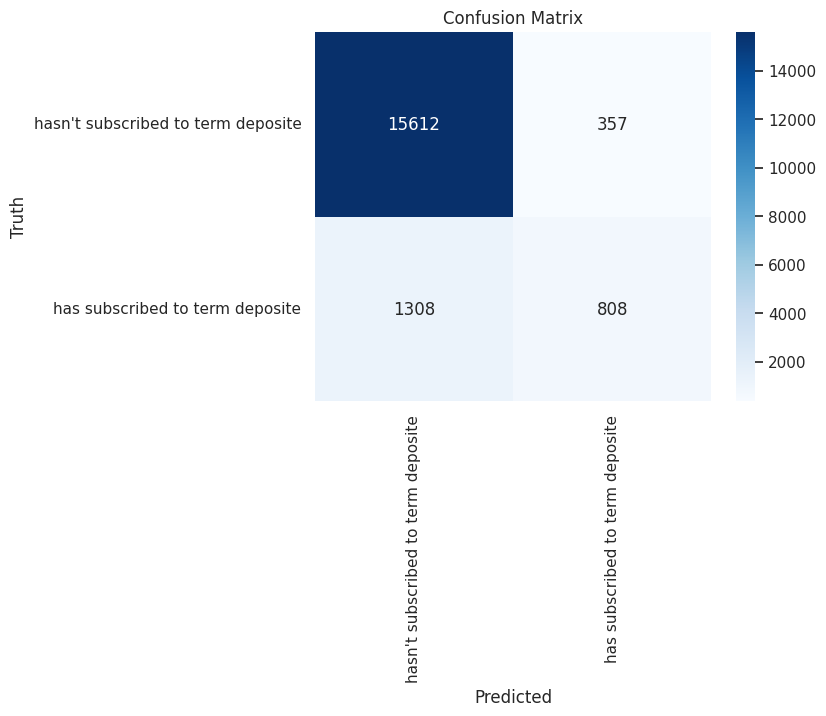

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95     15969
           1       0.69      0.38      0.49      2116

    accuracy                           0.91     18085
   macro avg       0.81      0.68      0.72     18085
weighted avg       0.90      0.91      0.90     18085



**random classifier parameter**

In [ ]:
# Create Random Forest Classifier object
clf = RandomForestClassifier(n_estimators=200, criterion="gini", max_depth=10, bootstrap=True) # 'gini', 'log_loss', 'entropy'

# Train Random Forest Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.8983688139341997

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[15869,   100],
       [ 1738,   378]])

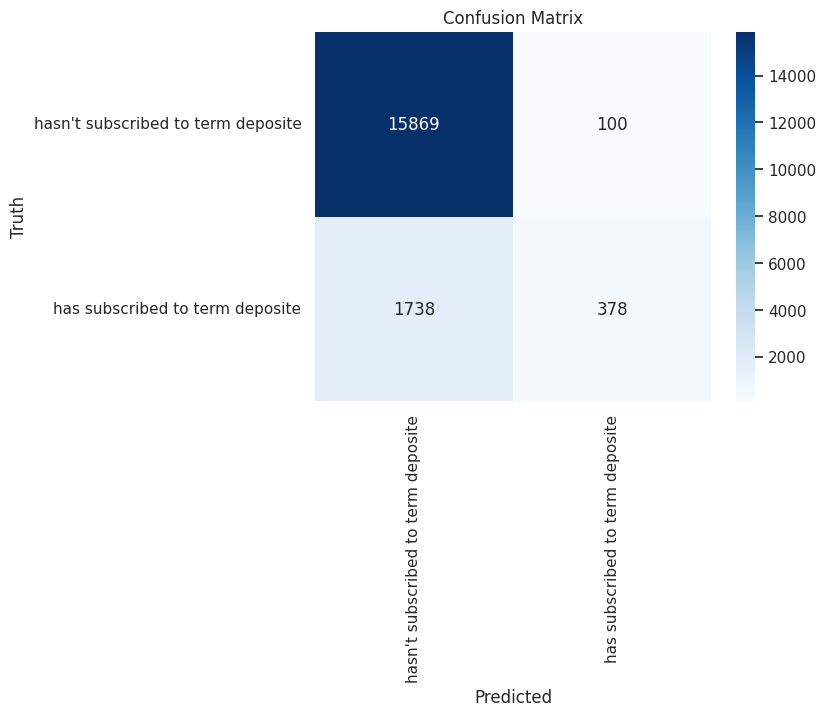

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.90      0.99      0.95     15969
           1       0.79      0.18      0.29      2116

    accuracy                           0.90     18085
   macro avg       0.85      0.59      0.62     18085
weighted avg       0.89      0.90      0.87     18085



**`BOOSTING`**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
model = AdaBoostClassifier()

In [ ]:
model.fit(x_train, y_train)

AdaBoostClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8968758639756704

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15565,   404],
       [ 1461,   655]])

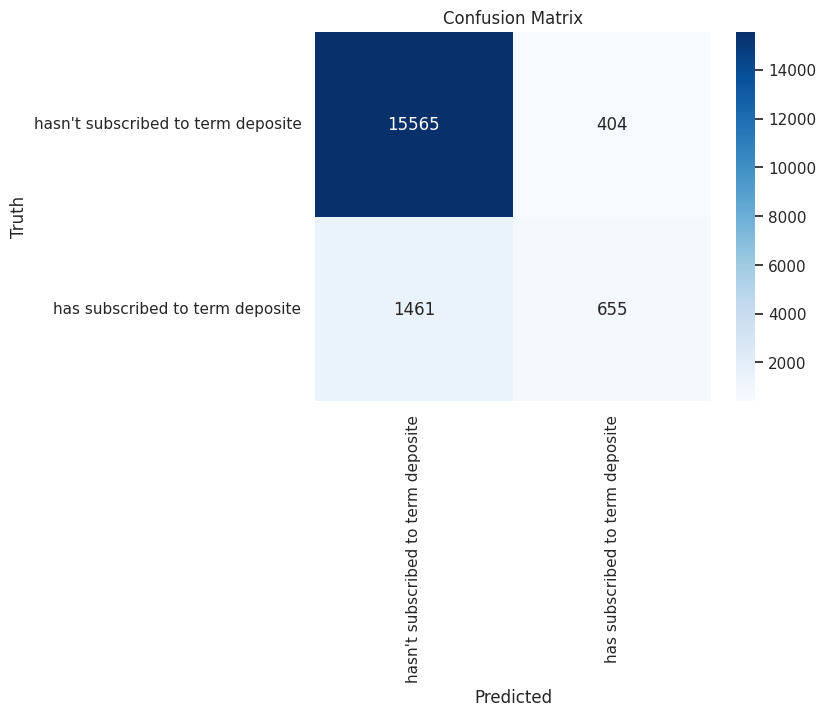

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.97      0.94     15969
           1       0.62      0.31      0.41      2116

    accuracy                           0.90     18085
   macro avg       0.77      0.64      0.68     18085
weighted avg       0.88      0.90      0.88     18085



In [ ]:
# Create Boosting Classifier object
from sklearn.ensemble import RandomForestClassifier
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9063312137130218

# **GARDIENT** **BOOSTING** **CLASSIFIER**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
model = GradientBoostingClassifier()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df= pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9064418025988388

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15542,   427],
       [ 1265,   851]])

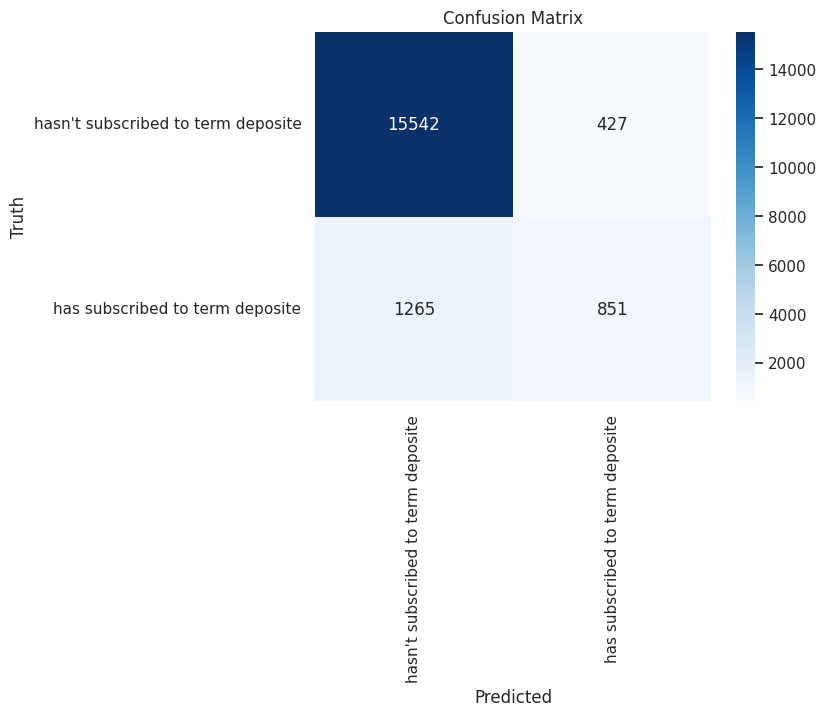

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     15969
           1       0.67      0.40      0.50      2116

    accuracy                           0.91     18085
   macro avg       0.80      0.69      0.72     18085
weighted avg       0.89      0.91      0.90     18085



Gardient boosting classifier parameter

In [ ]:
# Create Boosting Classifier object
br = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, loss='exponential', criterion='squared_error') #'exponential', 'log_loss'

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9050594415261266

# XG_BOOSTING

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier()

In [ ]:
model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
df = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
df

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9067182748133813

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15402,   567],
       [ 1120,   996]])

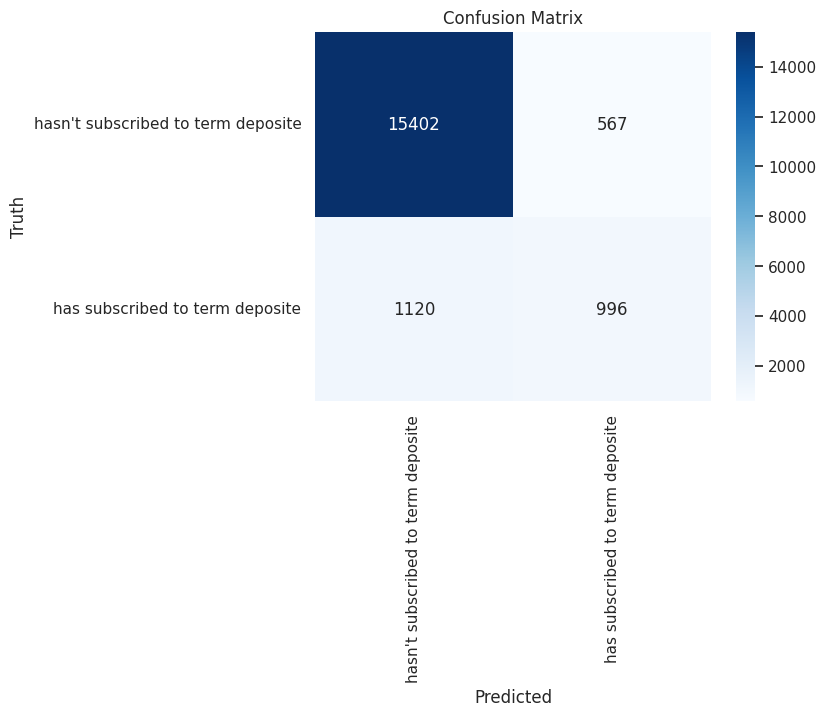

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.96      0.95     15969
           1       0.64      0.47      0.54      2116

    accuracy                           0.91     18085
   macro avg       0.78      0.72      0.74     18085
weighted avg       0.90      0.91      0.90     18085



XGBoosting Classifier Parameter

In [ ]:
# Create Boosting Classifier object
br = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9087641692009953

**BAGGING**

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
model = BaggingClassifier()

In [ ]:
model.fit(x_train, y_train)

BaggingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
5882,0,0
8533,0,0
36474,0,0
34556,0,0
5975,0,0
...,...,...
1479,0,0
41905,0,0
5242,0,0
5462,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9022947193807023

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[15430,   539],
       [ 1228,   888]])

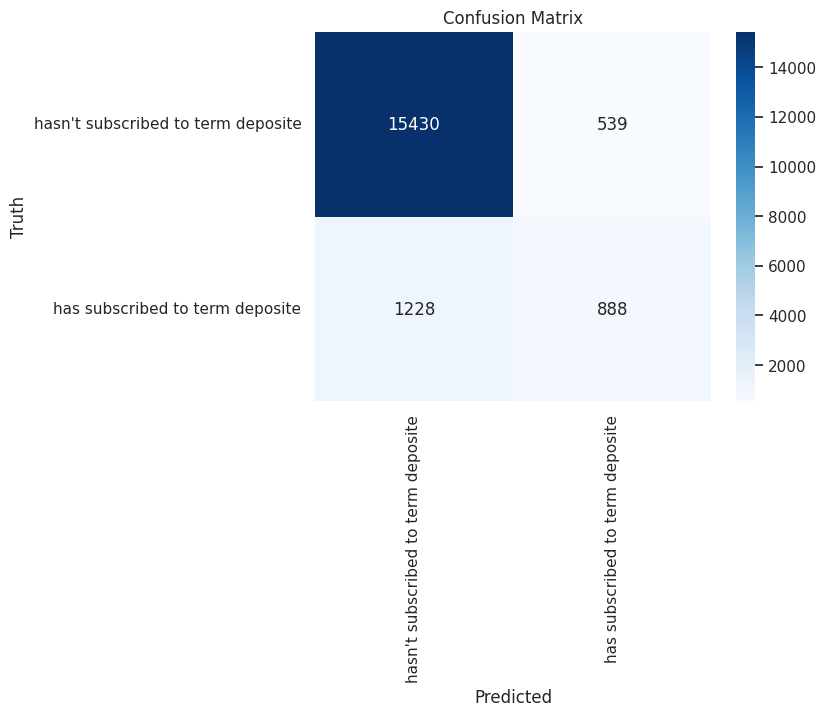

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.97      0.95     15969
           1       0.62      0.42      0.50      2116

    accuracy                           0.90     18085
   macro avg       0.77      0.69      0.72     18085
weighted avg       0.89      0.90      0.89     18085



**Bagging Classifier Parameter**

In [ ]:
# Create Bagging Classifier object
from sklearn.tree import DecisionTreeClassifier
base_estimator = DecisionTreeClassifier(max_depth=3, random_state=32)
br = BaggingClassifier(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9005805916505392

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[15587,   382],
       [ 1416,   700]])

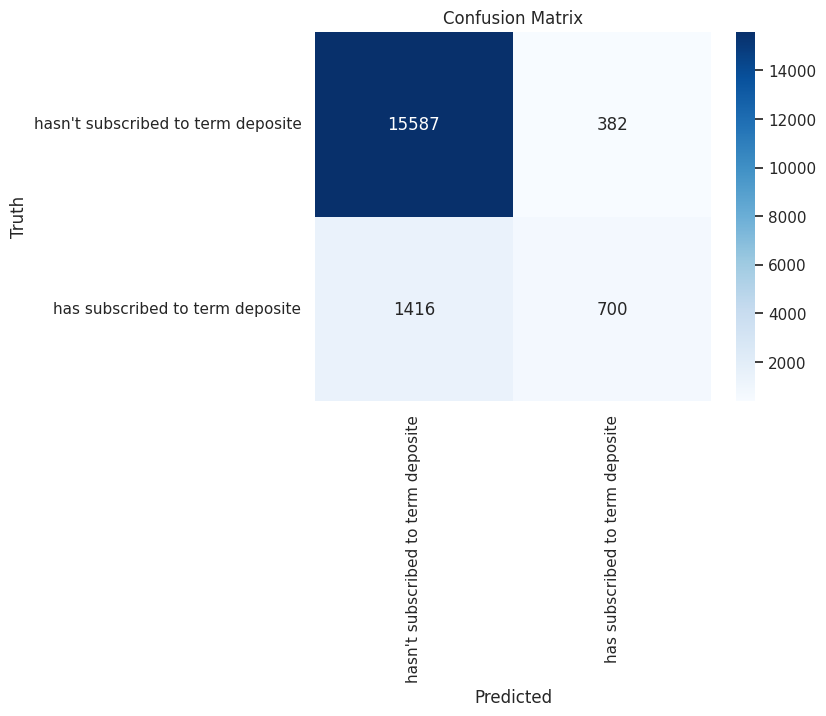

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95     15969
           1       0.65      0.33      0.44      2116

    accuracy                           0.90     18085
   macro avg       0.78      0.65      0.69     18085
weighted avg       0.89      0.90      0.89     18085



# VIF

In [ ]:
from sklearn.model_selection import train_test_split
x_train, x_test, y_train, y_test = train_test_split(x, y, test_size=0.30, train_size=0.70, random_state = 42)

In [ ]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

# Drop one dummy variable from each original categorical feature to avoid multicollinearity
x_modified = x.drop(['job_unknown', 'marital_single', 'education_unknown', 'contact_unknown', 'month_dec', 'poutcome_unknown'], axis=1)

vif_data = pd.DataFrame()
vif_data["feature"] = x_modified.columns
vif_data["VIF"] = [variance_inflation_factor(x_modified.values, i) for i in range(x_modified.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,age,25.476890
1,default,1.033777
2,balance,1.263376
3,housing,3.275427
4,loan,1.264831
5,day,6.123490
6,duration,2.031729
7,campaign,2.004260
8,pdays,5.432123
9,previous,1.503627


In [ ]:
x_modified = x.drop(['month_may','job_unknown', 'marital_single', 'education_unknown', 'contact_unknown', 'month_dec', 'poutcome_unknown'], axis=1)

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x_modified.columns
vif_data["VIF"] = [variance_inflation_factor(x_modified.values, i) for i in range(x_modified.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,age,23.756713
1,default,1.033603
2,balance,1.263310
3,housing,3.205065
4,loan,1.264811
5,day,6.048721
6,duration,2.027008
7,campaign,2.003226
8,pdays,5.429647
9,previous,1.503600


In [ ]:
x_modified = x.drop(['age','month_may','job_unknown', 'marital_single', 'education_unknown', 'contact_unknown', 'month_dec', 'poutcome_unknown'], axis=1)

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x_modified.columns
vif_data["VIF"] = [variance_inflation_factor(x_modified.values, i) for i in range(x_modified.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,default,1.033538
1,balance,1.255028
2,housing,3.187981
3,loan,1.264477
4,day,6.036339
5,duration,2.025662
6,campaign,2.002879
7,pdays,5.429450
8,previous,1.503599
9,job_admin.,5.280933


In [ ]:
x_modified = x.drop(['education_secondary','age','month_may','job_unknown', 'marital_single', 'education_unknown', 'contact_unknown', 'month_dec', 'poutcome_unknown'], axis=1)

In [ ]:
vif_data = pd.DataFrame()
vif_data["feature"] = x_modified.columns
vif_data["VIF"] = [variance_inflation_factor(x_modified.values, i) for i in range(x_modified.shape[1])]

In [ ]:
vif_data

,feature,VIF
0,default,1.033537
1,balance,1.254998
2,housing,3.176035
3,loan,1.261614
4,day,6.029680
5,duration,2.025023
6,campaign,2.002875
7,pdays,5.429437
8,previous,1.503570
9,job_admin.,2.918169


**logistic (VIF)**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.linear_model import LogisticRegression

In [ ]:
# fit a logistic regression model and store the class predictions
from sklearn.linear_model import LogisticRegression
logreg = LogisticRegression(C=1e9)

logreg.fit(x_train, y_train)
predictions = logreg.predict(x_test)
print(predictions)

[0 0 0 ... 0 0 0]


In [ ]:
from sklearn.metrics import confusion_matrix

In [ ]:
z=confusion_matrix(y_test, predictions)
z

array([[11727,   239],
       [ 1244,   354]])

In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,predictions)

0.8906664700678266

In [ ]:
from sklearn.metrics import classification_report
print(classification_report(y_test,predictions))

              precision    recall  f1-score   support

           0       0.90      0.98      0.94     11966
           1       0.60      0.22      0.32      1598

    accuracy                           0.89     13564
   macro avg       0.75      0.60      0.63     13564
weighted avg       0.87      0.89      0.87     13564



**SVC(VIF)**

In [ ]:
from sklearn.svm  import SVC

In [ ]:
model = SVC(kernel='linear')

In [ ]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
model.fit(x_train, y_train)

SVC(kernel='linear')

In [ ]:
y_pred = model.predict(x_test)
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
svm = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
svm

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8921409613683279

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11802,   164],
       [ 1299,   299]])

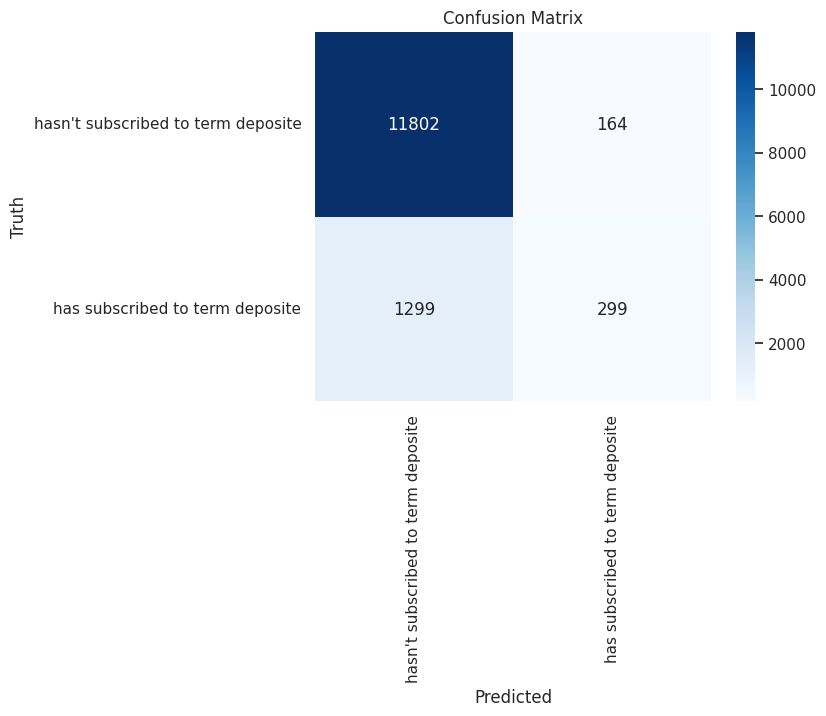

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

**KNN(VIF)**

In [ ]:
import numpy as np
import pandas as pd
import seaborn as sns
%matplotlib inline
import matplotlib.pyplot as plt

In [ ]:
from sklearn.neighbors import KNeighborsClassifier

In [ ]:
model=KNeighborsClassifier(n_neighbors=25)

In [ ]:
model.fit(x_train, y_train)

KNeighborsClassifier(n_neighbors=25)

In [ ]:
y_pred = model.predict(x_test)
y_pred


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
knn = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
knn

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8959746387496313

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11769,   197],
       [ 1214,   384]])

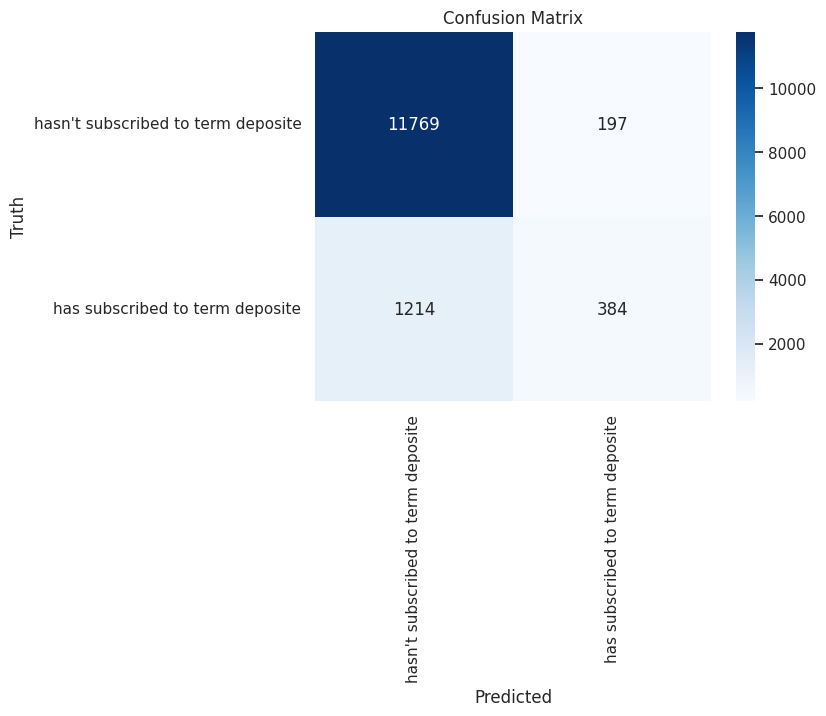

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     11966
           1       0.66      0.24      0.35      1598

    accuracy                           0.90     13564
   macro avg       0.78      0.61      0.65     13564
weighted avg       0.88      0.90      0.87     13564



**DECISION TREE(VIF)**

In [ ]:
from sklearn.tree import DecisionTreeClassifier

In [ ]:
model = DecisionTreeClassifier()

In [ ]:
model.fit(x_train, y_train)

DecisionTreeClassifier()

In [ ]:
y_pred = model.predict(x_test)
y_pred


array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8740047183721616

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11104,   862],
       [  847,   751]])

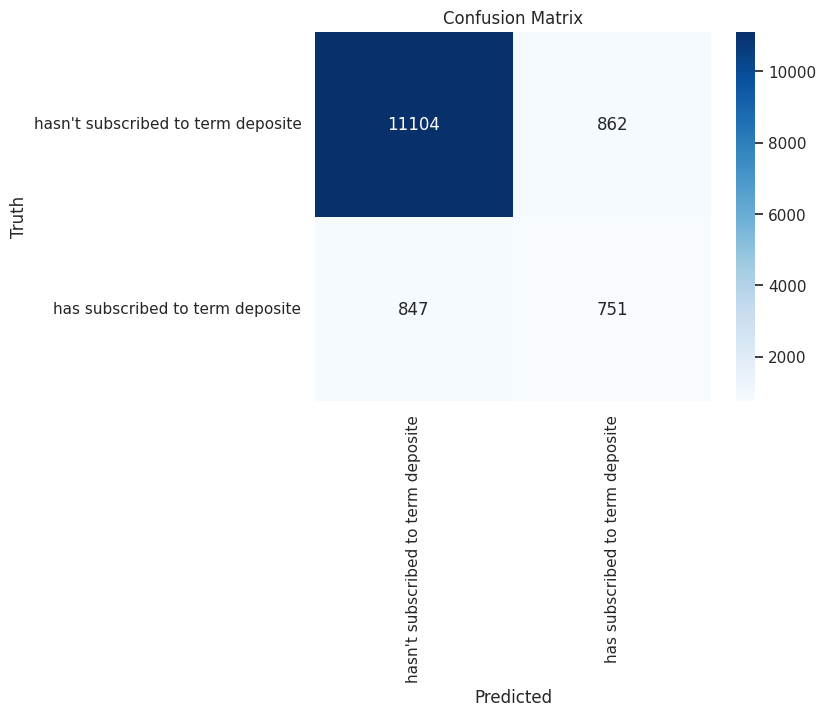

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.93      0.93     11966
           1       0.47      0.47      0.47      1598

    accuracy                           0.87     13564
   macro avg       0.70      0.70      0.70     13564
weighted avg       0.87      0.87      0.87     13564



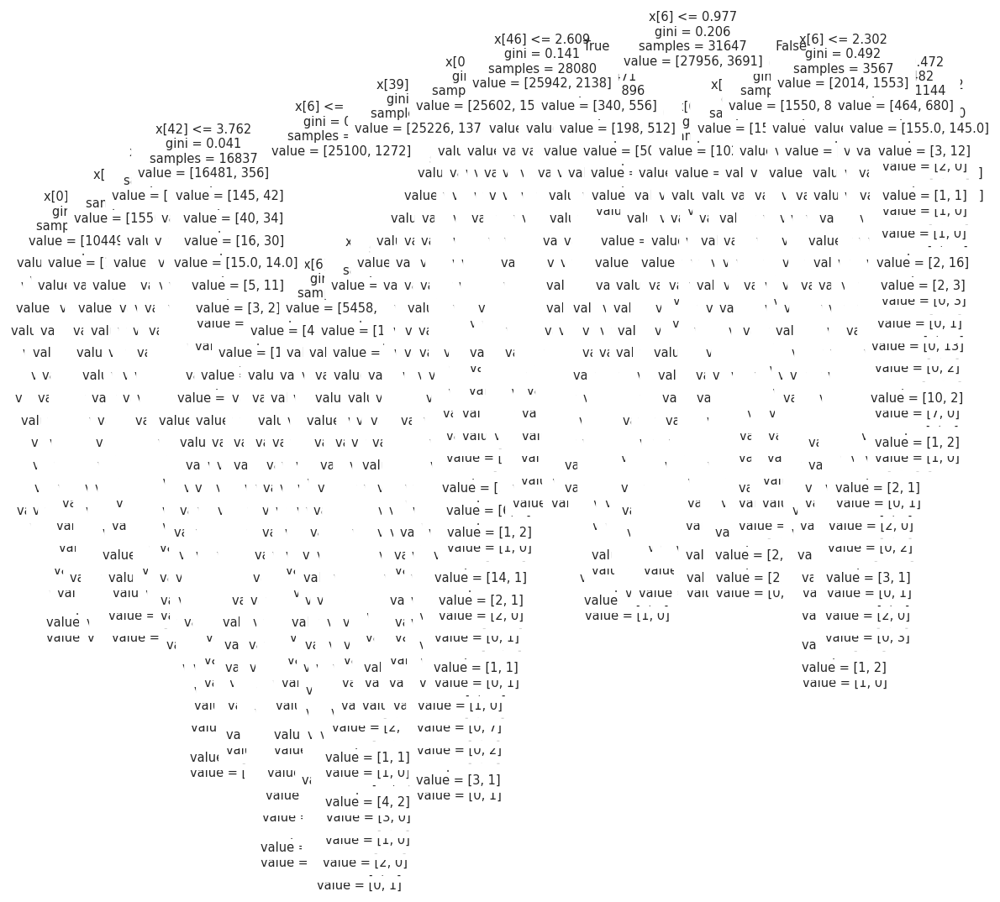

In [ ]:
from sklearn.tree import plot_tree
plt.figure(figsize=(10, 10), dpi=132)
plot_tree(model, fontsize=8)
plt.show()
#plt.savefig('out.pdf'))

**PARAMETER**

In [ ]:
# Create Decision Tree Classifier object
clf = DecisionTreeClassifier(criterion="gini", max_depth=3) # 'gini', 'log_loss', 'entropy'

# Train Decision Tree Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.8979652020053082

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[11709,   257],
       [ 1127,   471]])

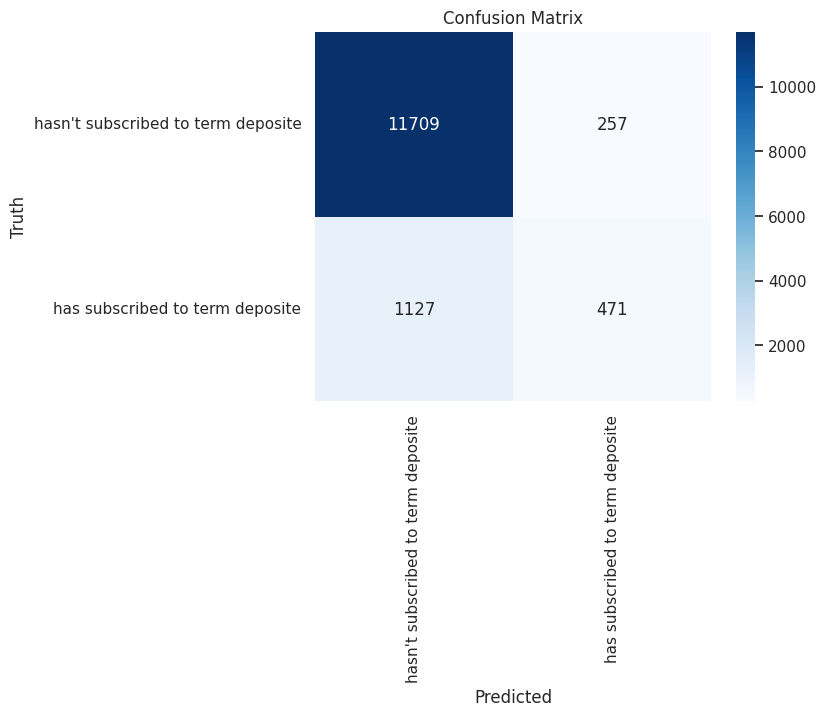

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     11966
           1       0.65      0.29      0.40      1598

    accuracy                           0.90     13564
   macro avg       0.78      0.64      0.67     13564
weighted avg       0.88      0.90      0.88     13564



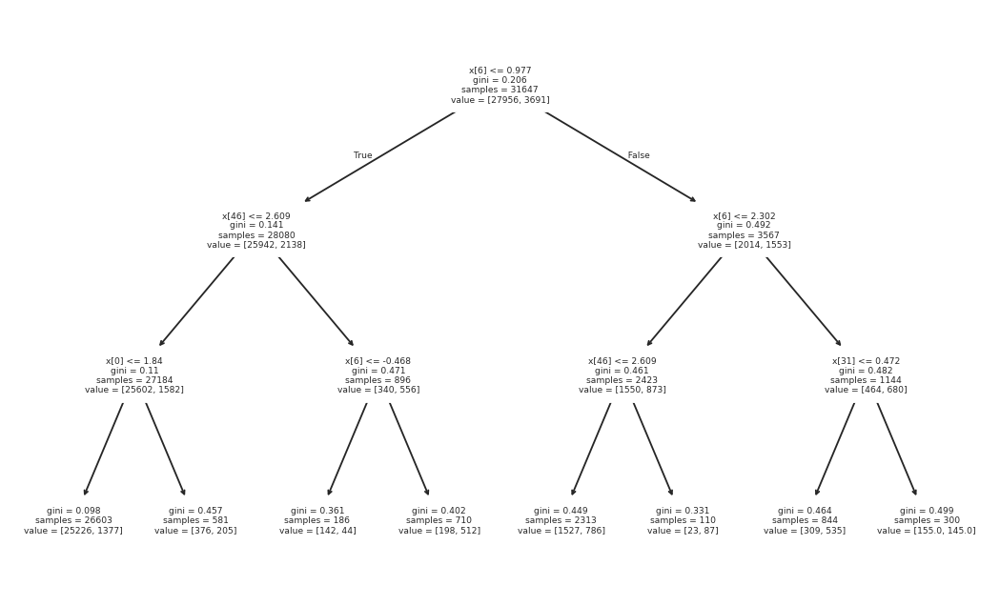

In [ ]:
plt.figure(figsize=(10, 6), dpi=132)
plot_tree(clf, fontsize=5)
plt.show()

**RANDOM FOREST(VIF)**

In [ ]:
from sklearn.ensemble import RandomForestClassifier
model = RandomForestClassifier()
model.fit(x_train, y_train)

RandomForestClassifier()

In [ ]:
y_pred_dt = model.predict(x_test)
y_pred_dt

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred_dt,'Actual':y_test})
dt

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred_dt)

0.9050427602477146

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[11644,   322],
       [  966,   632]])

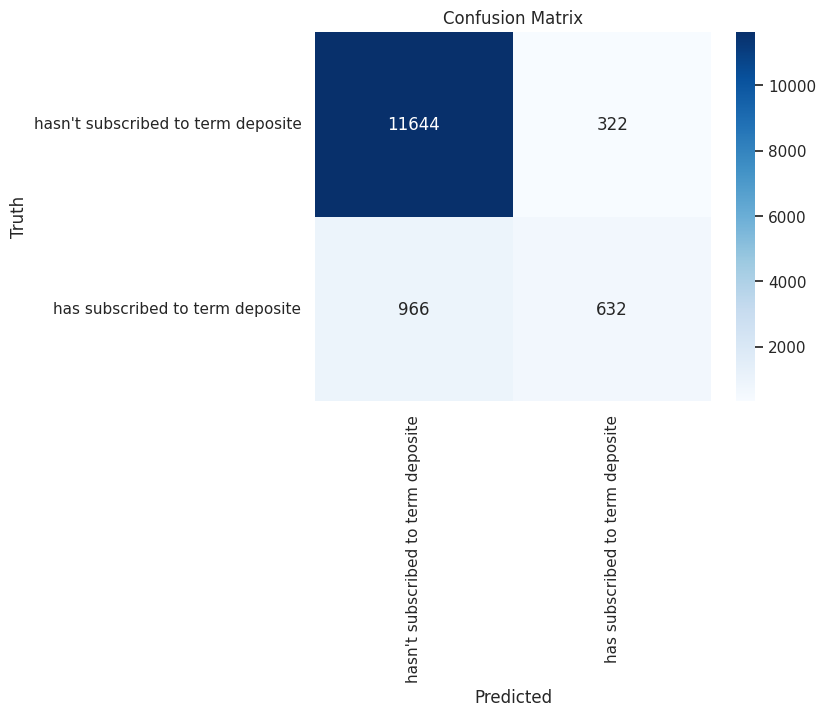

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.98      0.94     11966
           1       0.65      0.29      0.40      1598

    accuracy                           0.90     13564
   macro avg       0.78      0.64      0.67     13564
weighted avg       0.88      0.90      0.88     13564



**PARAMETER**

In [ ]:
# Create Random Forest Classifier object
clf = RandomForestClassifier(n_estimators=200, criterion="gini", max_depth=10, bootstrap=True) # 'gini', 'log_loss', 'entropy'

# Train Random Forest Classifier
clf = clf.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = clf.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred_dt)

0.9050427602477146

In [ ]:
cm = confusion_matrix(y_test,y_pred_dt)
cm

array([[11644,   322],
       [  966,   632]])

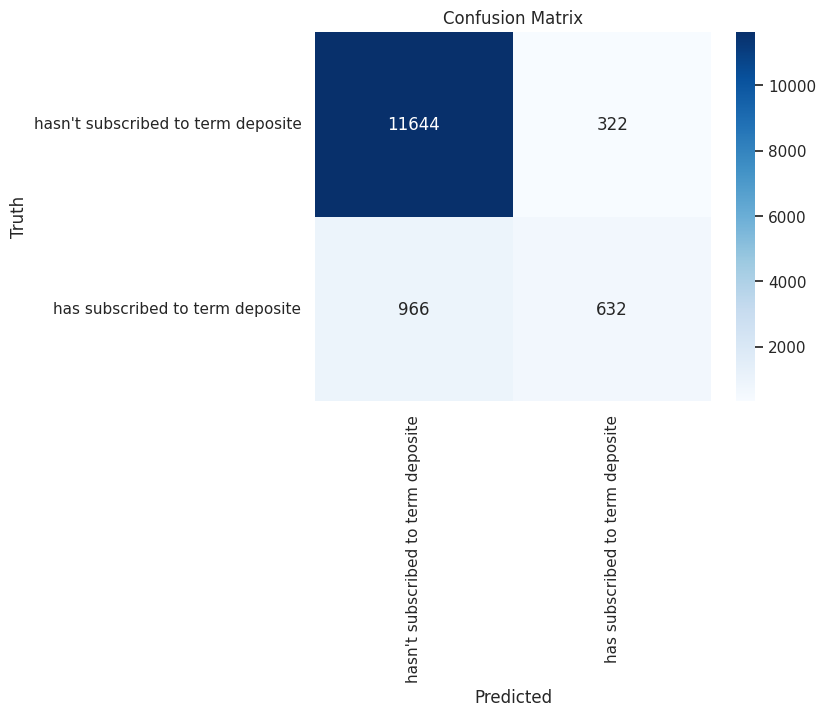

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred_dt)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.97      0.95     11966
           1       0.66      0.40      0.50      1598

    accuracy                           0.91     13564
   macro avg       0.79      0.68      0.72     13564
weighted avg       0.89      0.91      0.89     13564



**BAGGING(VIF)**

In [ ]:
from sklearn.ensemble import BaggingClassifier

In [ ]:
model = BaggingClassifier()

In [ ]:
model.fit(x_train, y_train)

BaggingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8997345915659097

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11525,   441],
       [  919,   679]])

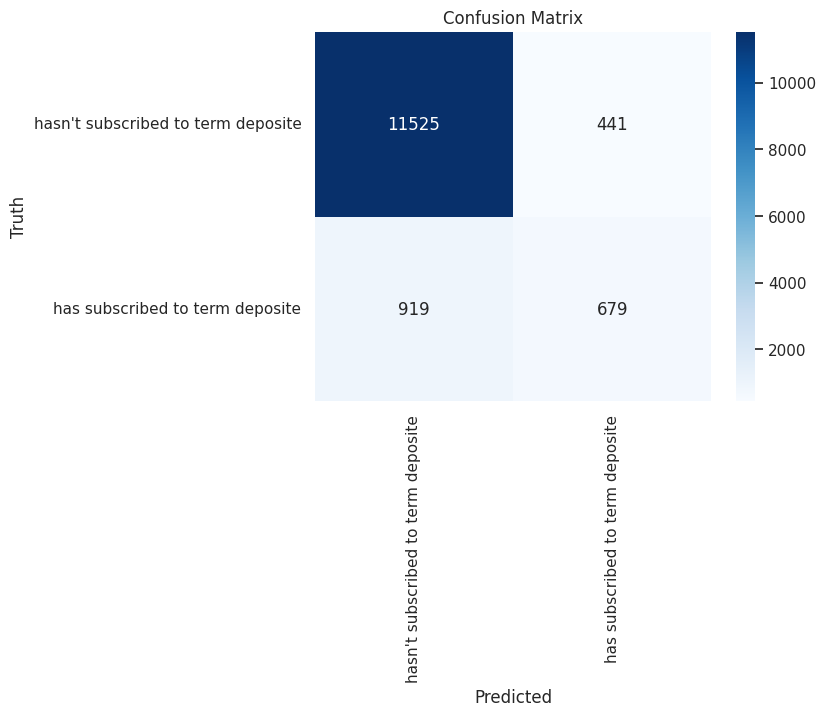

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.96      0.94     11966
           1       0.61      0.42      0.50      1598

    accuracy                           0.90     13564
   macro avg       0.77      0.69      0.72     13564
weighted avg       0.89      0.90      0.89     13564



**PARAMETER**

In [ ]:
# Create Bagging Classifier object
from sklearn.tree import DecisionTreeClassifier
base_estimator = DecisionTreeClassifier(max_depth=3, random_state=32)
br = BaggingClassifier(estimator=base_estimator, n_estimators=20, bootstrap=True)

# Train Bagging Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9007667354762607

In [ ]:
cm = confusion_matrix(y_test,y_pred)
cm

array([[11668,   298],
       [ 1048,   550]])

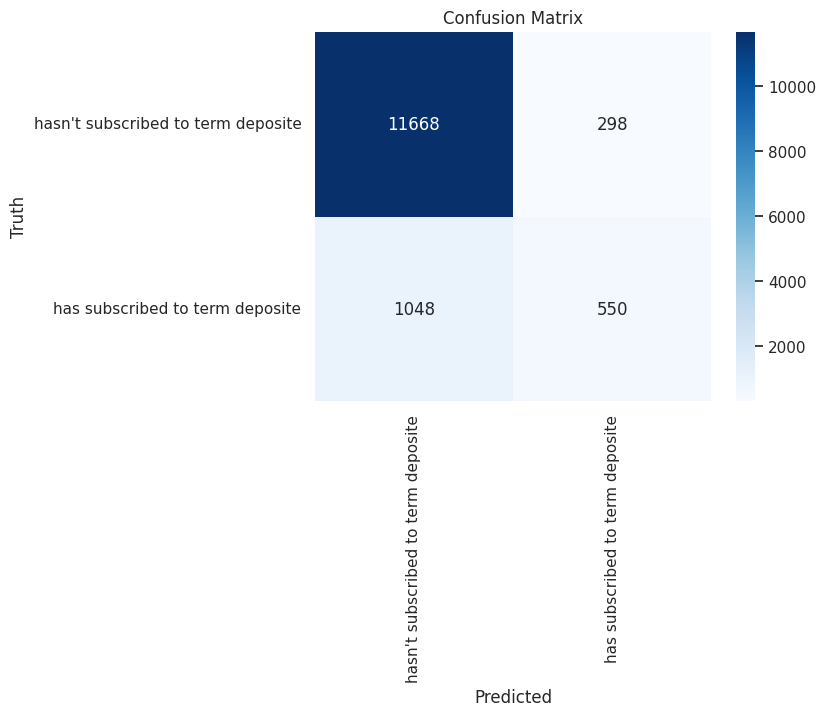

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.92      0.98      0.95     11966
           1       0.65      0.34      0.45      1598

    accuracy                           0.90     13564
   macro avg       0.78      0.66      0.70     13564
weighted avg       0.89      0.90      0.89     13564



**BOOSTING(VIF)**

In [ ]:
from sklearn.ensemble import AdaBoostClassifier

In [ ]:
model = AdaBoostClassifier()

In [ ]:
model.fit(x_train, y_train)

AdaBoostClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.8950899439693306

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11662,   304],
       [ 1119,   479]])

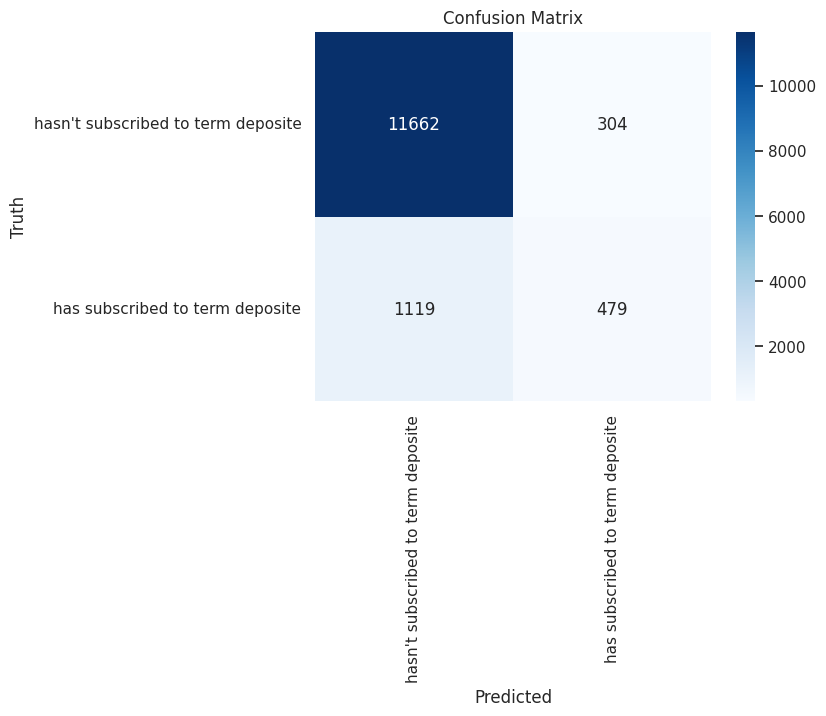

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.91      0.97      0.94     11966
           1       0.61      0.30      0.40      1598

    accuracy                           0.90     13564
   macro avg       0.76      0.64      0.67     13564
weighted avg       0.88      0.90      0.88     13564



**PARAMETER**

In [ ]:
# Create Boosting Classifier object
from sklearn.ensemble import RandomForestClassifier
base_estimator = RandomForestClassifier(max_depth=12, random_state=42)
br = AdaBoostClassifier(estimator=base_estimator, n_estimators=100, learning_rate=0.05)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9060749041580655

**GRADIENT BOOSTING(VIF)**

In [ ]:
from sklearn.ensemble import GradientBoostingClassifier

In [ ]:
model = GradientBoostingClassifier()

In [ ]:
model.fit(x_train, y_train)

GradientBoostingClassifier()

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9047478619876143

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11610,   356],
       [  936,   662]])

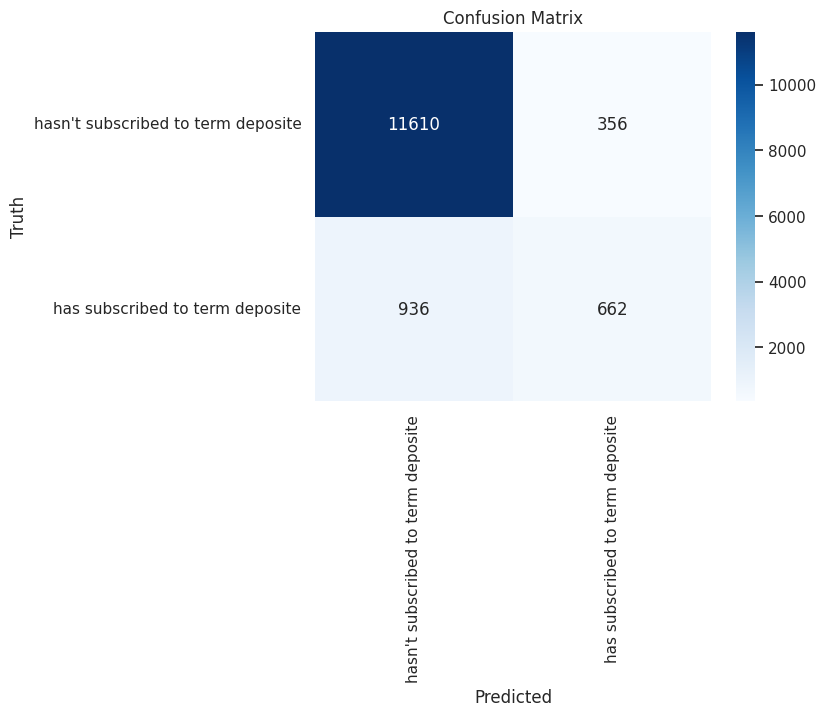

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.93      0.97      0.95     11966
           1       0.65      0.41      0.51      1598

    accuracy                           0.90     13564
   macro avg       0.79      0.69      0.73     13564
weighted avg       0.89      0.90      0.90     13564



**PARAMETER**

In [ ]:
# Create Boosting Classifier object
br = GradientBoostingClassifier(n_estimators=100, learning_rate=0.1, loss='exponential', criterion='squared_error') #'exponential', 'log_loss'

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9017988793866116

**XGBOOST(VIF)**

In [ ]:
from xgboost import XGBClassifier

In [ ]:
model = XGBClassifier()

In [ ]:
model.fit(x_train, y_train)

XGBClassifier(base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=None,
              enable_categorical=False, eval_metric=None, feature_types=None,
              feature_weights=None, gamma=None, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=None, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=None,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=None,
              n_jobs=None, num_parallel_tree=None, ...)

In [ ]:
y_pred = model.predict(x_test)

In [ ]:
y_pred

array([0, 0, 0, ..., 0, 0, 0])

In [ ]:
dt = pd.DataFrame({'Predicted':y_pred,'Actual':y_test})
dt

,Predicted,Actual
3776,0,0
9928,0,0
33409,0,0
31885,0,0
15738,0,0
...,...,...
9016,0,0
380,0,0
7713,0,0
12188,0,0


In [ ]:
from sklearn.metrics import accuracy_score
accuracy_score(y_test,y_pred)

0.9067384252432911

In [ ]:
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(y_test,y_pred)
cm

array([[11491,   475],
       [  790,   808]])

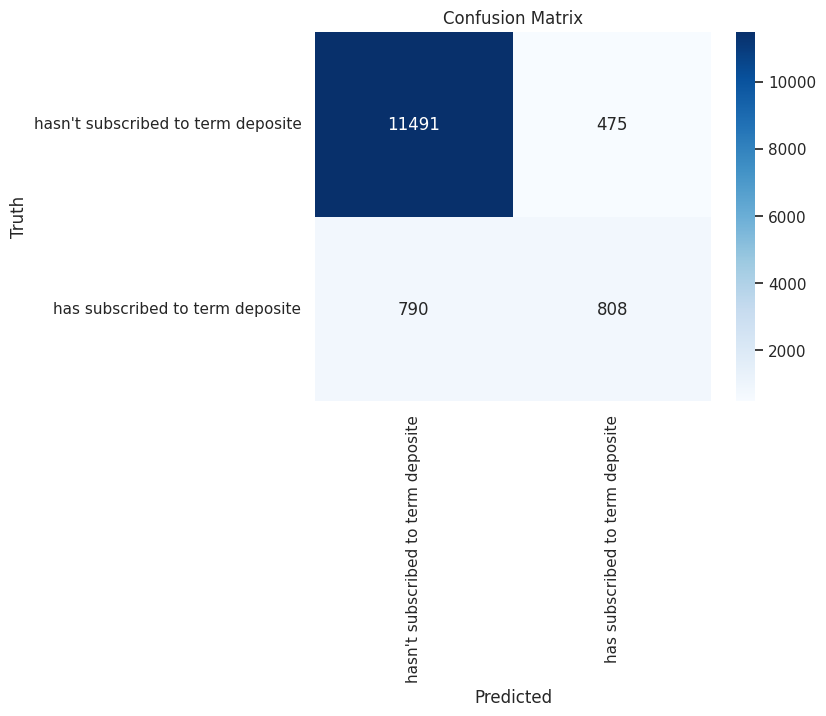

In [ ]:
sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"], yticklabels=["hasn't subscribed to term deposite","has subscribed to term deposite"])
plt.title('Confusion Matrix')
plt.xlabel("Predicted")
plt.ylabel("Truth")
plt.show()

In [ ]:
from sklearn.metrics import classification_report
classification_rep = classification_report(y_test, y_pred)
print(classification_rep)

              precision    recall  f1-score   support

           0       0.94      0.96      0.95     11966
           1       0.63      0.51      0.56      1598

    accuracy                           0.91     13564
   macro avg       0.78      0.73      0.75     13564
weighted avg       0.90      0.91      0.90     13564



In [ ]:
# Create Boosting Classifier object
br = XGBClassifier(n_estimators=100, learning_rate=0.1, max_depth=6, n_jobs=-1)

# Train Boosting Classifier
br = br.fit(x_train,y_train)

#Predict the response for test dataset
y_pred = br.predict(x_test)

In [ ]:
accuracy_score(y_test,y_pred)

0.9093925095841935

# **ANN(70:30)**

In [ ]:
import tensorflow as tf

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(7, activation='relu'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8343 - loss: 10.3826 - precision: 0.1102 - recall: 0.0611
Epoch 2/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3865 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3334 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3289 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8851 - loss: 0.3178 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3114 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3067 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8997 - loss: 0.2589 - precision: 0.6213 - recall: 0.3908


[0.2577670216560364,
 0.8993659615516663,
 0.6321951150894165,
 0.39608803391456604]

In [ ]:
model.summary();

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 10)             │           400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 7)              │            77 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,571 (6.14 KB)

 Trainable params: 523 (2.04 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,048 (4.10 KB)

Text(0.5, 0, 'epochs')

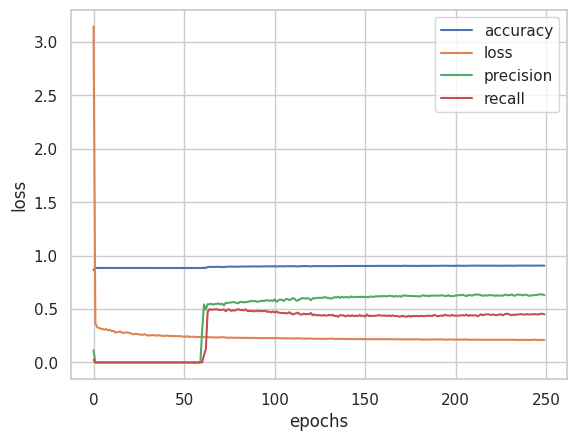

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8843 - loss: 0.4583 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8851 - loss: 0.3601 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.3568 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.3567 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3567 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8851 - loss: 0.3567 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3567 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.35

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8818 - loss: 0.2855 - precision: 0.0000e+00 - recall: 0.0000e+00


[0.29333898425102234, 0.8793866038322449, 0.0, 0.0]

In [ ]:
model.summary();

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 10)             │           400 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 15)             │           165 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,745 (6.82 KB)

 Trainable params: 581 (2.27 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,164 (4.55 KB)

Text(0.5, 0, 'epochs')

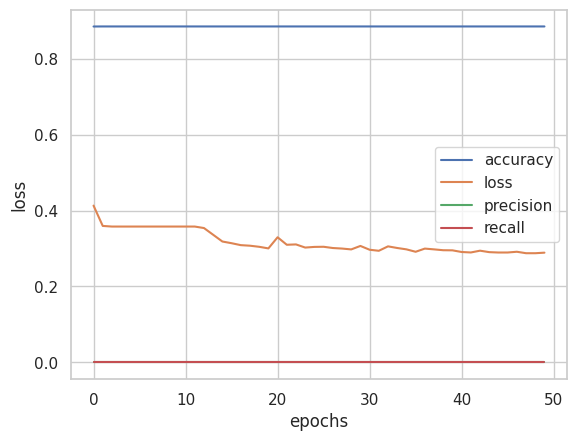

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.7369 - loss: 0.4707 - precision: 0.1259 - recall: 0.2077
Epoch 2/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8850 - loss: 0.3191 - precision: 0.4668 - recall: 0.0137
Epoch 3/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8846 - loss: 0.3112 - precision: 0.4287 - recall: 0.0130
Epoch 4/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8859 - loss: 0.3008 - precision: 0.5321 - recall: 0.0453
Epoch 5/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8859 - loss: 0.2994 - precision: 0.5322 - recall: 0.0569
Epoch 6/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8845 - loss: 0.3097 - precision: 0.4893 - recall: 0.0881
Epoch 7/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8850 - loss: 0.3016 - precision: 0.4946 - recall: 0.0935
Epoch 8/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8843 - loss: 0.3011 - precision: 0.4817 - recall: 0.1078
Epoch 9/

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8960 - loss: 0.2346 - precision: 0.5822 - recall: 0.4361


[0.23592115938663483,
 0.8967118859291077,
 0.6008583903312683,
 0.4278728663921356]

In [ ]:
model.summary();

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 15)             │           600 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,315 (9.05 KB)

 Trainable params: 771 (3.01 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,544 (6.04 KB)

Text(0.5, 0, 'epochs')

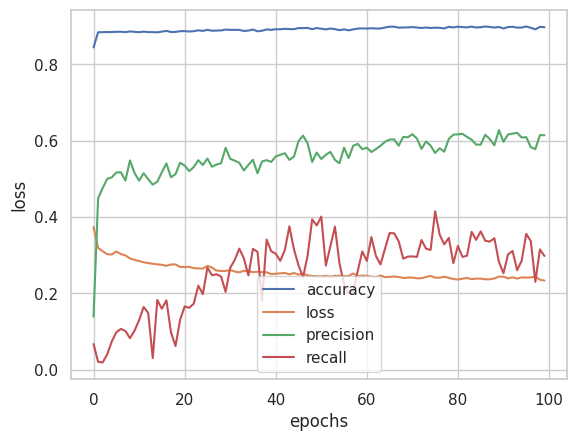

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8702 - loss: 0.4124 - precision: 0.1199 - recall: 0.0198
Epoch 2/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3280 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8851 - loss: 0.3252 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8851 - loss: 0.3193 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3159 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3031 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3054 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8851 - loss: 0.30

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8842 - loss: 0.3098 - precision: 0.5309 - recall: 0.1684


[0.31532514095306396, 0.8857269287109375, 0.583984375, 0.18276283144950867]

In [ ]:
model.summary();

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_13 (Dense)                │ (None, 30)             │         1,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 10)             │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 5)              │            55 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,070 (27.62 KB)

 Trainable params: 2,356 (9.20 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,714 (18.42 KB)

Text(0.5, 0, 'epochs')

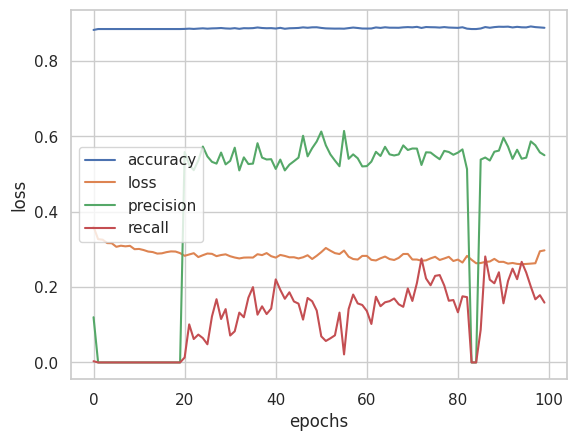

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.001,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8851 - loss: 0.4346 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3533 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8851 - loss: 0.3511 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3509 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3501 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3504 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8851 - loss: 0.3481 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/100
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - lo

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8818 - loss: 0.3474 - precision: 0.0000e+00 - recall: 0.0000e+00


[0.35239192843437195, 0.8793866038322449, 0.0, 0.0]

In [ ]:
model.summary();

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 30)             │         1,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 5)              │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,444 (17.36 KB)

 Trainable params: 2,221 (8.68 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,223 (8.69 KB)

Text(0.5, 0, 'epochs')

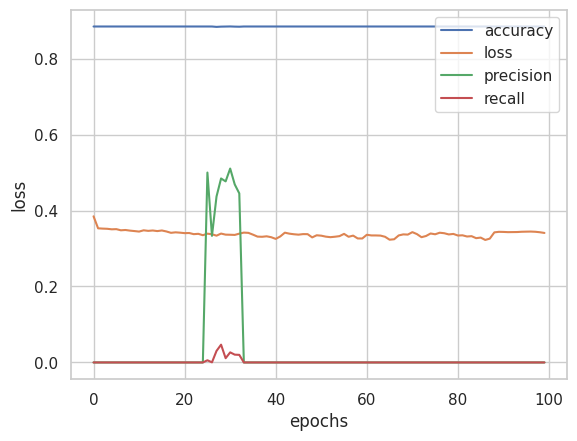

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.01,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8851 - loss: 0.3895 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.3562 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3552 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.3542 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3536 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8851 - loss: 0.3525 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8851 - loss: 0.3524 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/50
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.35

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8818 - loss: 0.3635 - precision: 0.0000e+00 - recall: 0.0000e+00


[0.36832940578460693, 0.8793866038322449, 0.0, 0.0]

In [ ]:
model.summary();

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 30)             │         1,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,304 (16.82 KB)

 Trainable params: 2,151 (8.40 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,153 (8.41 KB)

Text(0.5, 0, 'epochs')

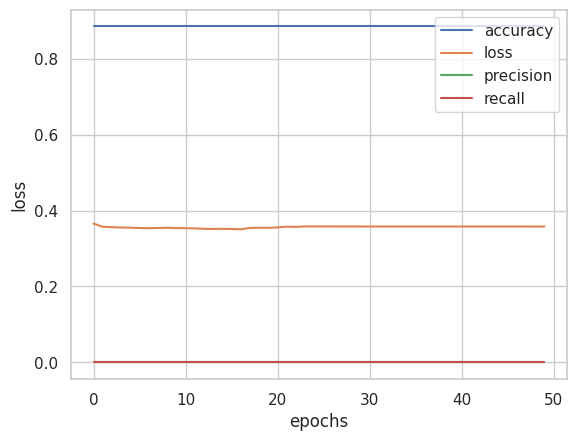

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.7775 - loss: 0.5787 - precision: 0.1130 - recall: 0.1386
Epoch 2/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.4070 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8851 - loss: 0.3685 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8851 - loss: 0.3590 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8851 - loss: 0.3560 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.3480 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8851 - loss: 0.3394 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/250
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8851 - loss: 0.33

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8881 - loss: 0.2423 - precision: 0.5515 - recall: 0.2998


[0.24238799512386322,
 0.8908876180648804,
 0.5921986103057861,
 0.3062347173690796]

In [ ]:
model.summary();

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 30)             │         1,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,455 (25.22 KB)

 Trainable params: 2,151 (8.40 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,304 (16.82 KB)

Text(0.5, 0, 'epochs')

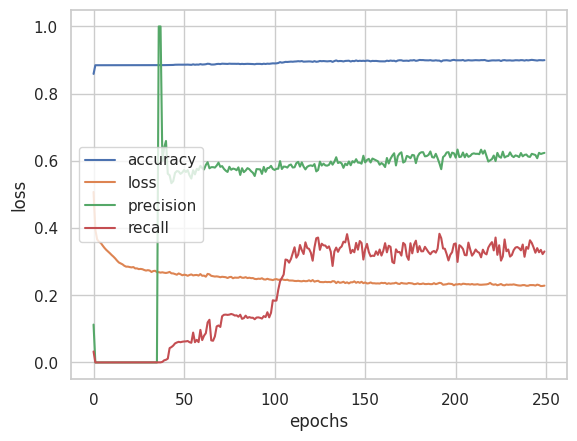

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='relu'),
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 650)

Epoch 1/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.5614 - loss: 43.0318 - precision: 0.1162 - recall: 0.4248
Epoch 2/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8623 - loss: 0.5228 - precision: 0.3231 - recall: 0.1785
Epoch 3/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8728 - loss: 0.4133 - precision: 0.4017 - recall: 0.2134
Epoch 4/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8774 - loss: 0.3852 - precision: 0.4378 - recall: 0.2297
Epoch 5/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8797 - loss: 0.3761 - precision: 0.4536 - recall: 0.2291
Epoch 6/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8800 - loss: 0.3713 - precision: 0.4563 - recall: 0.2289
Epoch 7/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8818 - loss: 0.3509 - precision: 0.4724 - recall: 0.2348
Epoch 8/650
989/989 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8833 - loss: 0.3397 - precision: 0.4833 - recall: 0.2354
Epoch 9

In [ ]:
model.evaluate(x_test, y_test)

424/424 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8953 - loss: 0.2438 - precision: 0.5898 - recall: 0.3825


[0.25073158740997314,
 0.8971542119979858,
 0.616425096988678,
 0.38997554779052734]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,200 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 6,455 (25.22 KB)

 Trainable params: 2,151 (8.40 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,304 (16.82 KB)

Text(0.5, 0, 'epochs')

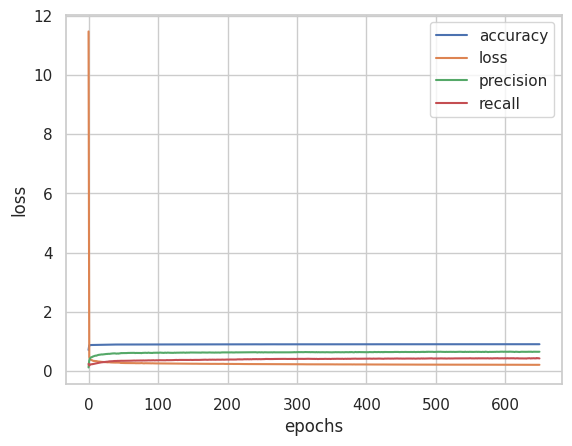

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

# **ANN(80:20)**

In [ ]:
import tensorflow as tf

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(7, activation='relu'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.6829 - loss: 0.5322 - precision: 0.2070 - recall: 0.4404
Epoch 2/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8963 - loss: 0.2325 - precision: 0.5773 - recall: 0.4510
Epoch 3/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8984 - loss: 0.2246 - precision: 0.5905 - recall: 0.4541
Epoch 4/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8987 - loss: 0.2207 - precision: 0.5915 - recall: 0.4592
Epoch 5/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9002 - loss: 0.2172 - precision: 0.5972 - recall: 0.4735
Epoch 6/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9016 - loss: 0.2140 - precision: 0.6041 - recall: 0.4820
Epoch 7/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9023 - loss: 0.2120 - precision: 0.6037 - recall: 0.4987
Epoch 8/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9039 - loss: 0.2099 - precision: 0.6105 - recall:

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9078 - loss: 0.2125 - precision: 0.6040 - recall: 0.5520


[0.2146417796611786,
 0.9055623412132263,
 0.6051546335220337,
 0.5548204183578491]

In [ ]:
model.summary();

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 10)             │           490 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 7)              │            77 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,841 (7.20 KB)

 Trainable params: 613 (2.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,228 (4.80 KB)

Text(0.5, 0, 'epochs')

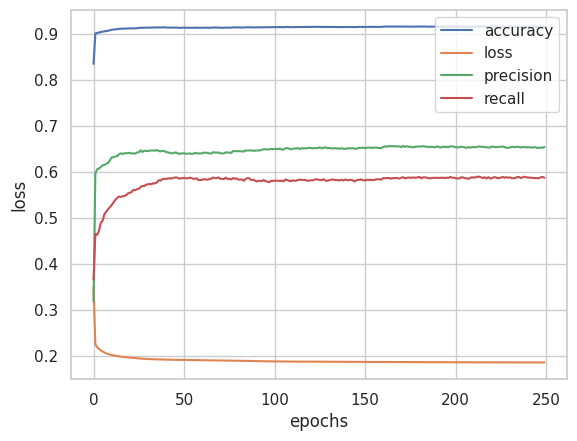

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 11s 7ms/step - accuracy: 0.8448 - loss: 0.4876 - precision: 0.2483 - recall: 0.0967
Epoch 2/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8988 - loss: 0.2601 - precision: 0.6205 - recall: 0.3638
Epoch 3/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8998 - loss: 0.2356 - precision: 0.6132 - recall: 0.4064
Epoch 4/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9006 - loss: 0.2264 - precision: 0.6136 - recall: 0.4233
Epoch 5/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9025 - loss: 0.2210 - precision: 0.6185 - recall: 0.4520
Epoch 6/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9038 - loss: 0.2172 - precision: 0.6225 - recall: 0.4669
Epoch 7/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 7s 6ms/step - accuracy: 0.9036 - loss: 0.2142 - precision: 0.6195 - recall: 0.4718
Epoch 8/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 8s 5ms/step - accuracy: 0.9046 - loss: 0.2116 - precision: 0.6235 - recall: 0.4804

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9044 - loss: 0.2112 - precision: 0.5944 - recall: 0.5010


[0.21275395154953003,
 0.903461217880249,
 0.6066897511482239,
 0.49716445803642273]

In [ ]:
model.summary();

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 10)             │           490 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 15)             │           165 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,015 (7.88 KB)

 Trainable params: 671 (2.62 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,344 (5.25 KB)

Text(0.5, 0, 'epochs')

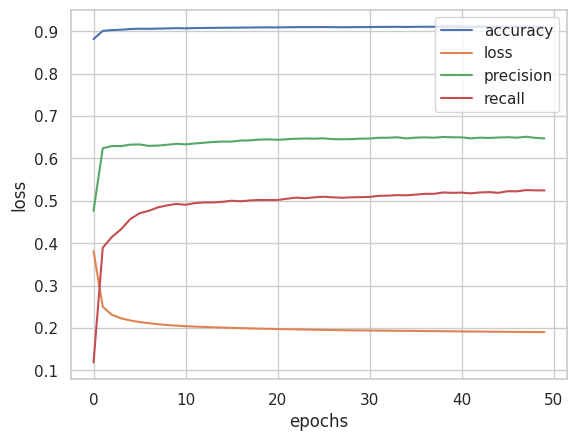

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8340 - loss: 0.3709 - precision: 0.3305 - recall: 0.2243
Epoch 2/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8993 - loss: 0.2281 - precision: 0.6062 - recall: 0.4157
Epoch 3/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9015 - loss: 0.2189 - precision: 0.6139 - recall: 0.4425
Epoch 4/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9031 - loss: 0.2146 - precision: 0.6222 - recall: 0.4550
Epoch 5/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9041 - loss: 0.2117 - precision: 0.6272 - recall: 0.4604
Epoch 6/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9044 - loss: 0.2093 - precision: 0.6277 - recall: 0.4647
Epoch 7/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9050 - loss: 0.2071 - precision: 0.6305 - recall: 0.4689
Epoch 8/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9072 - loss: 0.2050 - precision: 0.6414 - recall:

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9025 - loss: 0.2278 - precision: 0.5864 - recall: 0.4851


[0.2288946807384491, 0.9001437425613403, 0.5865921974182129, 0.496219277381897]

In [ ]:
model.summary();

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 15)             │           735 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,720 (10.63 KB)

 Trainable params: 906 (3.54 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,814 (7.09 KB)

Text(0.5, 0, 'epochs')

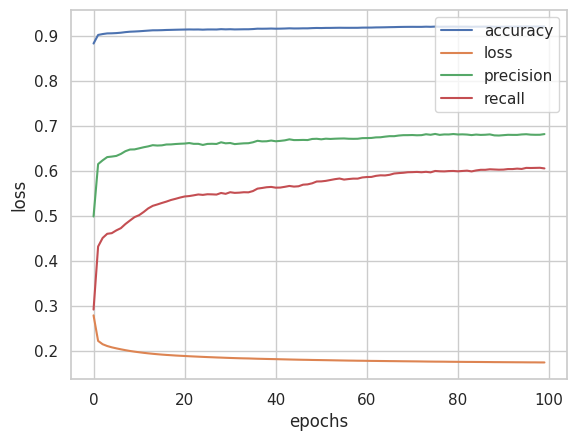

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8742 - loss: 0.3600 - precision: 0.4250 - recall: 0.1770
Epoch 2/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9024 - loss: 0.2194 - precision: 0.6229 - recall: 0.4357
Epoch 3/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9026 - loss: 0.2118 - precision: 0.6217 - recall: 0.4439
Epoch 4/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9041 - loss: 0.2065 - precision: 0.6284 - recall: 0.4570
Epoch 5/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9064 - loss: 0.2021 - precision: 0.6398 - recall: 0.4730
Epoch 6/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9094 - loss: 0.1984 - precision: 0.6536 - recall: 0.4927
Epoch 7/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9102 - loss: 0.1956 - precision: 0.6581 - recall: 0.4957
Epoch 8/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9122 - loss: 0.1932 - precision: 0.6682 - recall:

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8965 - loss: 0.2861 - precision: 0.5563 - recall: 0.4541


[0.2903348207473755,
 0.8912971615791321,
 0.5418060421943665,
 0.45935729146003723]

In [ ]:
model.summary();

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_13 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 10)             │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 5)              │            55 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,880 (30.79 KB)

 Trainable params: 2,626 (10.26 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,254 (20.53 KB)

Text(0.5, 0, 'epochs')

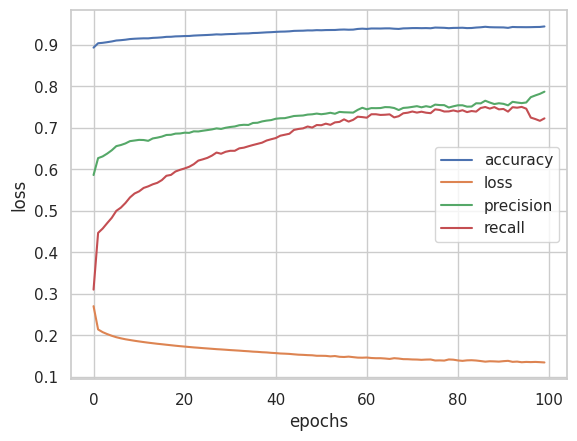

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.001,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8525 - loss: 0.4700 - precision: 0.1082 - recall: 0.0338
Epoch 2/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8822 - loss: 0.3602 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8822 - loss: 0.3568 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8822 - loss: 0.3511 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8822 - loss: 0.3397 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8822 - loss: 0.3168 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8865 - loss: 0.2835 - precision: 0.6346 - recall: 0.0721
Epoch 8/100
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8956 - lo

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9051 - loss: 0.2239 - precision: 0.6023 - recall: 0.4904


[0.22765453159809113,
 0.902355432510376,
 0.605042040348053,
 0.47637051343917847]

In [ ]:
model.summary();

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 5)              │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,984 (19.47 KB)

 Trainable params: 2,491 (9.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,493 (9.74 KB)

Text(0.5, 0, 'epochs')

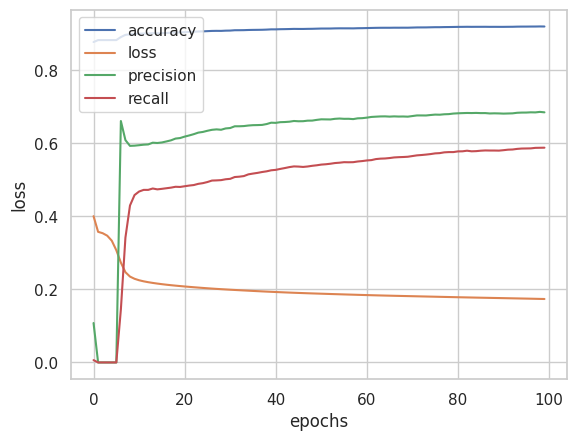

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.01,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8750 - loss: 0.3709 - precision: 0.1768 - recall: 0.0166
Epoch 2/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8906 - loss: 0.2347 - precision: 0.5848 - recall: 0.1472
Epoch 3/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8995 - loss: 0.2195 - precision: 0.6014 - recall: 0.4374
Epoch 4/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9005 - loss: 0.2130 - precision: 0.6012 - recall: 0.4644
Epoch 5/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9019 - loss: 0.2086 - precision: 0.6067 - recall: 0.4788
Epoch 6/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9040 - loss: 0.2053 - precision: 0.6167 - recall: 0.4902
Epoch 7/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9065 - loss: 0.2026 - precision: 0.6300 - recall: 0.5008
Epoch 8/50
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9076 - loss: 0.2003 - precision: 0.6342 - recall: 0.5105


In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9028 - loss: 0.2285 - precision: 0.5874 - recall: 0.4842


[0.234545037150383, 0.898485004901886, 0.5813953280448914, 0.47258979082107544]

In [ ]:
model.summary();

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,844 (18.93 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,423 (9.47 KB)

Text(0.5, 0, 'epochs')

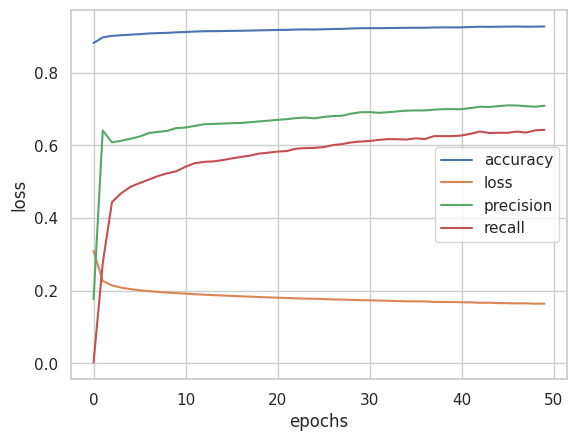

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8811 - loss: 0.5187 - precision: 0.2654 - recall: 0.0043
Epoch 2/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8822 - loss: 0.3734 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8822 - loss: 0.3179 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8822 - loss: 0.2805 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8822 - loss: 0.2602 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8822 - loss: 0.2494 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8822 - loss: 0.2430 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/250
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9037 - loss: 0.2365 - precision: 0.5841 - recall: 0.5337


[0.237665057182312, 0.9010283946990967, 0.5867944359779358, 0.5207939743995667]

In [ ]:
model.summary();

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

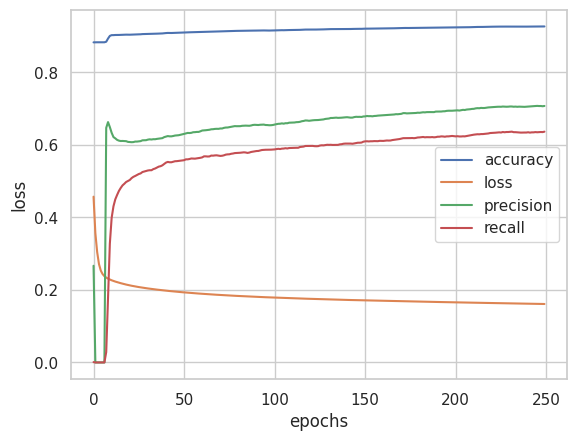

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='relu'),
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 650)

Epoch 1/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8701 - loss: 0.3952 - precision: 0.2397 - recall: 0.0353
Epoch 2/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8888 - loss: 0.2616 - precision: 0.6599 - recall: 0.1167
Epoch 3/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8980 - loss: 0.2352 - precision: 0.6209 - recall: 0.3460
Epoch 4/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8990 - loss: 0.2277 - precision: 0.6022 - recall: 0.4208
Epoch 5/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8997 - loss: 0.2242 - precision: 0.5994 - recall: 0.4502
Epoch 6/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9002 - loss: 0.2217 - precision: 0.6000 - recall: 0.4610
Epoch 7/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9009 - loss: 0.2195 - precision: 0.6022 - recall: 0.4704
Epoch 8/650
1131/1131 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9016 - loss: 0.2176 - precision: 0.6060 - recall:

In [ ]:
model.evaluate(x_test, y_test)

283/283 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.8950 - loss: 0.2709 - precision: 0.5407 - recall: 0.5121


[0.27994704246520996,
 0.8925135731697083,
 0.5444214940071106,
 0.4981096386909485]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

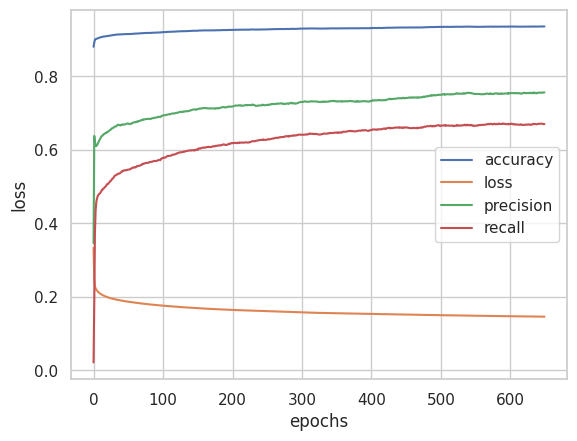

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

# **ANN(75:25)**

In [ ]:
import tensorflow as tf

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(7, activation='relu'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8479 - loss: 0.3665 - precision: 0.2731 - recall: 0.1222
Epoch 2/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8985 - loss: 0.2239 - precision: 0.6026 - recall: 0.3883
Epoch 3/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9004 - loss: 0.2157 - precision: 0.5972 - recall: 0.4545
Epoch 4/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9028 - loss: 0.2112 - precision: 0.6080 - recall: 0.4760
Epoch 5/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9026 - loss: 0.2080 - precision: 0.6046 - recall: 0.4853
Epoch 6/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9032 - loss: 0.2055 - precision: 0.6064 - recall: 0.4937
Epoch 7/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.9052 - loss: 0.2035 - precision: 0.6169 - recall: 0.5002
Epoch 8/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9058 - loss: 0.2021 - precision: 0.6191 - recall:

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9003 - loss: 0.2246 - precision: 0.5976 - recall: 0.5265


[0.21889865398406982,
 0.9010881781578064,
 0.5891608595848083,
 0.509833574295044]

In [ ]:
model.summary();

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 10)             │           490 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 7)              │            77 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,841 (7.20 KB)

 Trainable params: 613 (2.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,228 (4.80 KB)

Text(0.5, 0, 'epochs')

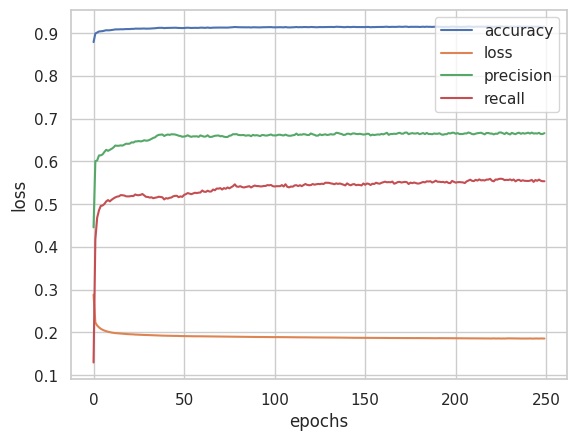

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8102 - loss: 0.5054 - precision: 0.1635 - recall: 0.1279
Epoch 2/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.8973 - loss: 0.2616 - precision: 0.6310 - recall: 0.2971
Epoch 3/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9022 - loss: 0.2322 - precision: 0.6215 - recall: 0.4191
Epoch 4/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9033 - loss: 0.2216 - precision: 0.6229 - recall: 0.4388
Epoch 5/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9029 - loss: 0.2158 - precision: 0.6173 - recall: 0.4478
Epoch 6/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9040 - loss: 0.2120 - precision: 0.6203 - recall: 0.4616
Epoch 7/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9041 - loss: 0.2095 - precision: 0.6198 - recall: 0.4658
Epoch 8/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9042 - loss: 0.2076 - precision: 0.6206 - recall: 0.4659


In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9075 - loss: 0.2159 - precision: 0.6408 - recall: 0.5251


[0.21311622858047485, 0.907015860080719, 0.62465500831604, 0.5136157274246216]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

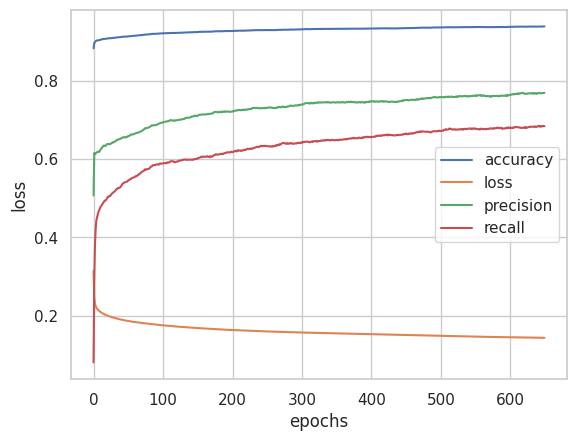

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8241 - loss: 0.3851 - precision: 0.3302 - recall: 0.2786
Epoch 2/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9015 - loss: 0.2262 - precision: 0.6108 - recall: 0.4340
Epoch 3/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9029 - loss: 0.2162 - precision: 0.6118 - recall: 0.4641
Epoch 4/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9045 - loss: 0.2110 - precision: 0.6210 - recall: 0.4709
Epoch 5/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9061 - loss: 0.2074 - precision: 0.6299 - recall: 0.4788
Epoch 6/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9072 - loss: 0.2047 - precision: 0.6360 - recall: 0.4826
Epoch 7/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9091 - loss: 0.2024 - precision: 0.6456 - recall: 0.4929
Epoch 8/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9095 - loss: 0.2004 - precision: 0.6471 - recall:

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 2s 4ms/step - accuracy: 0.9038 - loss: 0.2267 - precision: 0.6221 - recall: 0.5098


[0.2230837047100067,
 0.902769148349762,
 0.6035283207893372,
 0.49167928099632263]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

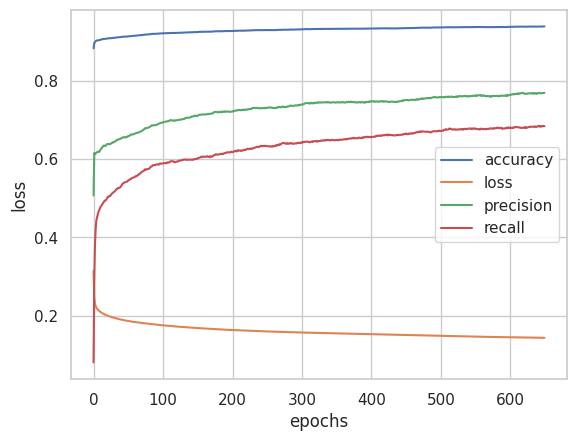

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 7s 3ms/step - accuracy: 0.8834 - loss: 0.3741 - precision: 0.4238 - recall: 0.1465
Epoch 2/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9021 - loss: 0.2176 - precision: 0.6196 - recall: 0.4208
Epoch 3/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.9046 - loss: 0.2092 - precision: 0.6337 - recall: 0.4378
Epoch 4/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9070 - loss: 0.2041 - precision: 0.6444 - recall: 0.4563
Epoch 5/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9083 - loss: 0.2001 - precision: 0.6472 - recall: 0.4733
Epoch 6/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9098 - loss: 0.1970 - precision: 0.6526 - recall: 0.4888
Epoch 7/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.9098 - loss: 0.1946 - precision: 0.6483 - recall: 0.4999
Epoch 8/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.9102 - loss: 0.1925 - precision: 0.6480 - recall:

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8852 - loss: 0.3244 - precision: 0.5277 - recall: 0.4486


[0.31988221406936646,
 0.8876404762268066,
 0.5233393311500549,
 0.44099849462509155]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

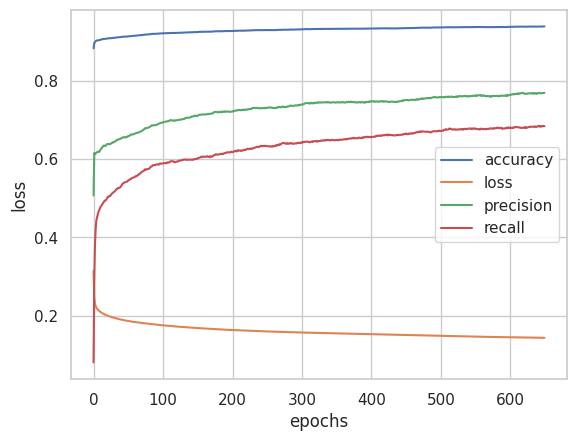

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.001,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.7904 - loss: 0.5303 - precision: 0.1378 - recall: 0.1415
Epoch 2/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8830 - loss: 0.3667 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8830 - loss: 0.3610 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.8830 - loss: 0.3601 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8830 - loss: 0.3585 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8830 - loss: 0.3555 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8830 - loss: 0.3487 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/100
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 7s 4ms/step - accuracy: 0.8

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9017 - loss: 0.2223 - precision: 0.6050 - recall: 0.5282


[0.22090324759483337, 0.900911271572113, 0.5881326198577881, 0.509833574295044]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

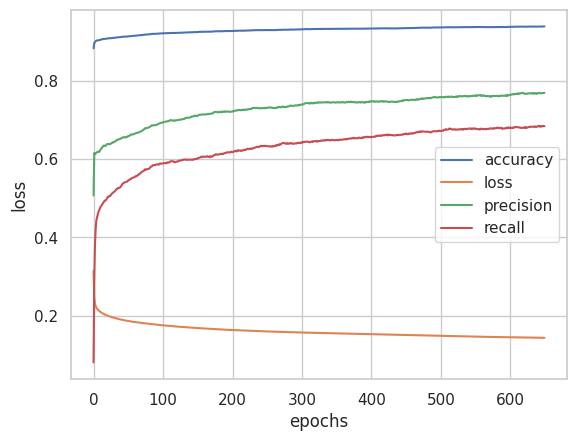

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.01,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 17s 13ms/step - accuracy: 0.8629 - loss: 0.3924 - precision: 0.0900 - recall: 0.0176
Epoch 2/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 12s 11ms/step - accuracy: 0.8871 - loss: 0.2423 - precision: 0.4776 - recall: 0.0760
Epoch 3/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 10s 9ms/step - accuracy: 0.9011 - loss: 0.2211 - precision: 0.6121 - recall: 0.4205
Epoch 4/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 14s 12ms/step - accuracy: 0.9023 - loss: 0.2132 - precision: 0.6078 - recall: 0.4620
Epoch 5/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 11s 3ms/step - accuracy: 0.9045 - loss: 0.2087 - precision: 0.6163 - recall: 0.4855
Epoch 6/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9062 - loss: 0.2053 - precision: 0.6243 - recall: 0.4952
Epoch 7/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9064 - loss: 0.2027 - precision: 0.6238 - recall: 0.5019
Epoch 8/50
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 2ms/step - accuracy: 0.9070 - loss: 0.2000 - precision: 0.6249 - recall:

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 3ms/step - accuracy: 0.8954 - loss: 0.2566 - precision: 0.5768 - recall: 0.4967


[0.2493620067834854, 0.8980801701545715, 0.5721561908721924, 0.509833574295044]

In [ ]:
model.summary();

Model: "sequential_9"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_36 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_37 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_38 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_39 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,844 (18.93 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,423 (9.47 KB)

Text(0.5, 0, 'epochs')

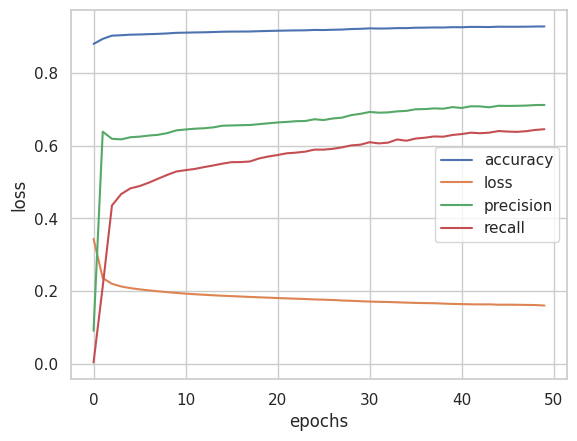

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8830 - loss: 0.5285 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8830 - loss: 0.3823 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8830 - loss: 0.3200 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8830 - loss: 0.2806 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8830 - loss: 0.2580 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8830 - loss: 0.2458 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8830 - loss: 0.2390 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/250
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accur

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8939 - loss: 0.2524 - precision: 0.5664 - recall: 0.5102


[0.24485833942890167,
 0.896399199962616,
 0.5621399283409119,
 0.5166414380073547]

In [ ]:
model.summary();

Model: "sequential_10"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_40 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_41 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_42 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_43 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

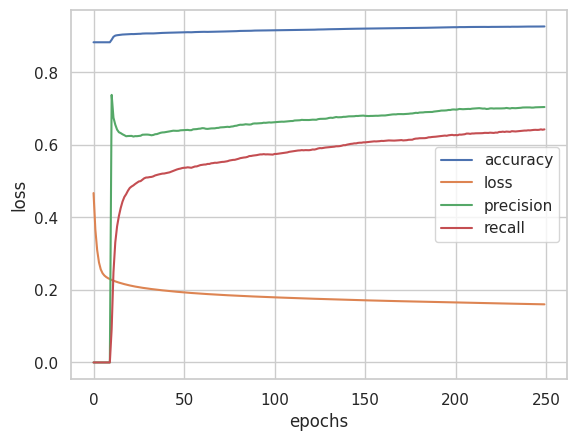

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='relu'),
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 650)

Epoch 1/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8552 - loss: 0.4057 - precision: 0.2458 - recall: 0.0762
Epoch 2/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8900 - loss: 0.2617 - precision: 0.5822 - recall: 0.2079
Epoch 3/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8970 - loss: 0.2371 - precision: 0.6026 - recall: 0.3496
Epoch 4/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8990 - loss: 0.2270 - precision: 0.6029 - recall: 0.4008
Epoch 5/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 6s 4ms/step - accuracy: 0.9012 - loss: 0.2215 - precision: 0.6115 - recall: 0.4265
Epoch 6/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9013 - loss: 0.2179 - precision: 0.6096 - recall: 0.4338
Epoch 7/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9023 - loss: 0.2154 - precision: 0.6146 - recall: 0.4431
Epoch 8/650
1060/1060 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9034 - loss: 0.2133 - precision: 0.6203 - recall:

In [ ]:
model.evaluate(x_test, y_test)

354/354 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8932 - loss: 0.2925 - precision: 0.5743 - recall: 0.4381


[0.2888152599334717,
 0.8969300389289856,
 0.5746907591819763,
 0.4568835198879242]

In [ ]:
model.summary();

Model: "sequential_11"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_44 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_45 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_46 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_47 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

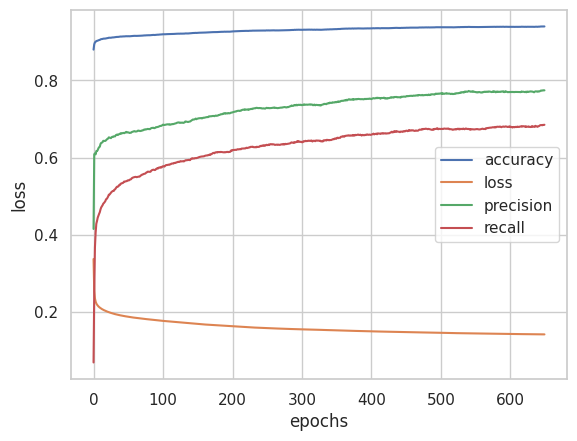

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

# **ANN(60:40)**

In [ ]:
import tensorflow as tf

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(7, activation='relu'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8322 - loss: 0.4040 - precision: 0.2649 - recall: 0.1525
Epoch 2/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 6s 6ms/step - accuracy: 0.8995 - loss: 0.2253 - precision: 0.5997 - recall: 0.4010
Epoch 3/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 5s 5ms/step - accuracy: 0.9012 - loss: 0.2155 - precision: 0.5970 - recall: 0.4544
Epoch 4/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9022 - loss: 0.2115 - precision: 0.6006 - recall: 0.4664
Epoch 5/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 5s 6ms/step - accuracy: 0.9040 - loss: 0.2087 - precision: 0.6089 - recall: 0.4800
Epoch 6/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 5ms/step - accuracy: 0.9047 - loss: 0.2066 - precision: 0.6114 - recall: 0.4844
Epoch 7/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9052 - loss: 0.2049 - precision: 0.6130 - recall: 0.4914
Epoch 8/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9056 - loss: 0.2032 - precision: 0.6133 - recall: 0.4990
Epoch 9/

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9026 - loss: 0.2172 - precision: 0.5925 - recall: 0.5700


[0.21749195456504822,
 0.9033452868461609,
 0.5919080972671509,
 0.5600188970565796]

In [ ]:
model.summary();

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_3 (Dense)                 │ (None, 10)             │           490 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_4 (Dense)                 │ (None, 7)              │            77 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_5 (Dense)                 │ (None, 5)              │            40 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_6 (Dense)                 │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 1,841 (7.20 KB)

 Trainable params: 613 (2.39 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,228 (4.80 KB)

Text(0.5, 0, 'epochs')

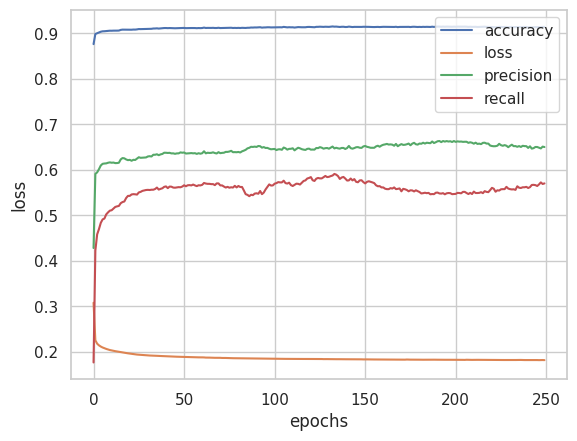

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(10, activation='relu'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8755 - loss: 0.5028 - precision: 0.2168 - recall: 0.0226
Epoch 2/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8859 - loss: 0.2890 - precision: 0.5610 - recall: 0.0345
Epoch 3/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8983 - loss: 0.2433 - precision: 0.6254 - recall: 0.2994
Epoch 4/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9011 - loss: 0.2289 - precision: 0.6135 - recall: 0.3961
Epoch 5/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9028 - loss: 0.2212 - precision: 0.6148 - recall: 0.4307
Epoch 6/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9038 - loss: 0.2158 - precision: 0.6184 - recall: 0.4407
Epoch 7/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9055 - loss: 0.2120 - precision: 0.6250 - recall: 0.4577
Epoch 8/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9048 - loss: 0.2092 - precision: 0.6179 - recall: 0.4638
Epoch 9/50
848/8

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.9016 - loss: 0.2127 - precision: 0.5997 - recall: 0.5109


[0.21530894935131073,
 0.9048935770988464,
 0.6123722791671753,
 0.5099244117736816]

In [ ]:
model.summary();

Model: "sequential_2"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_7 (Dense)                 │ (None, 10)             │           490 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_8 (Dense)                 │ (None, 15)             │           165 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_9 (Dense)                 │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,015 (7.88 KB)

 Trainable params: 671 (2.62 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,344 (5.25 KB)

Text(0.5, 0, 'epochs')

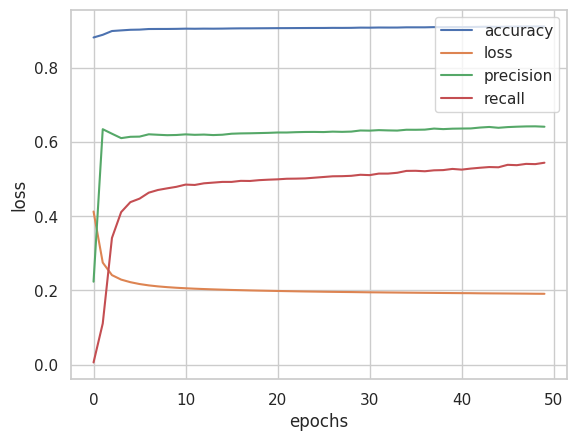

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 3ms/step - accuracy: 0.8222 - loss: 0.4005 - precision: 0.2584 - recall: 0.1682
Epoch 2/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9003 - loss: 0.2322 - precision: 0.6008 - recall: 0.4148
Epoch 3/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9032 - loss: 0.2192 - precision: 0.6138 - recall: 0.4427
Epoch 4/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9040 - loss: 0.2131 - precision: 0.6171 - recall: 0.4515
Epoch 5/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9052 - loss: 0.2093 - precision: 0.6228 - recall: 0.4603
Epoch 6/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9062 - loss: 0.2067 - precision: 0.6273 - recall: 0.4668
Epoch 7/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9070 - loss: 0.2043 - precision: 0.6333 - recall: 0.4683
Epoch 8/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9077 - loss: 0.2018 - precision: 0.6371 - recall: 0.4713
Epoch 9/

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8965 - loss: 0.2308 - precision: 0.5754 - recall: 0.4810


[0.23271401226520538,
 0.8980370759963989,
 0.5769230723381042,
 0.482041597366333]

In [ ]:
model.summary();

Model: "sequential_3"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_10 (Dense)                │ (None, 15)             │           735 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_11 (Dense)                │ (None, 10)             │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_12 (Dense)                │ (None, 1)              │            11 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 2,720 (10.63 KB)

 Trainable params: 906 (3.54 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 1,814 (7.09 KB)

Text(0.5, 0, 'epochs')

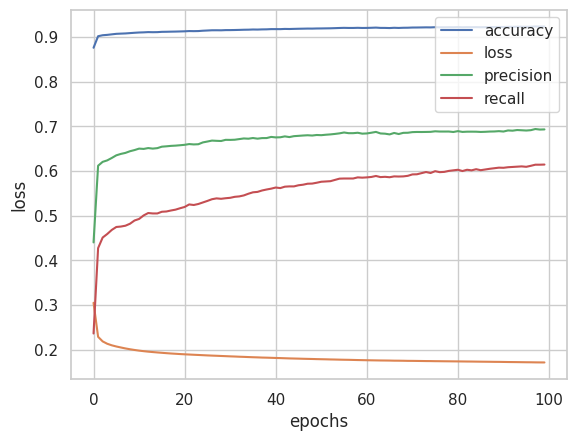

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(10, activation='tanh'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adam(learning_rate=0.001),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 6s 3ms/step - accuracy: 0.8806 - loss: 0.3663 - precision: 0.1818 - recall: 0.0092
Epoch 2/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8855 - loss: 0.2220 - precision: 0.2403 - recall: 0.0396
Epoch 3/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9022 - loss: 0.2124 - precision: 0.6124 - recall: 0.4241
Epoch 4/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.9045 - loss: 0.2063 - precision: 0.6180 - recall: 0.4589
Epoch 5/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.9056 - loss: 0.2019 - precision: 0.6174 - recall: 0.4868
Epoch 6/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9067 - loss: 0.1988 - precision: 0.6176 - recall: 0.5110
Epoch 7/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9083 - loss: 0.1960 - precision: 0.6211 - recall: 0.5356
Epoch 8/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.9096 - loss: 0.1934 - precision: 0.6266 - recall: 0.5425
Epoch 9/

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8910 - loss: 0.3134 - precision: 0.5361 - recall: 0.6020


[0.3259766101837158,
 0.8889134526252747,
 0.5222638249397278,
 0.5931001901626587]

In [ ]:
model.summary();

Model: "sequential_4"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_13 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_14 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_15 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_16 (Dense)                │ (None, 10)             │           160 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_17 (Dense)                │ (None, 5)              │            55 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_18 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,880 (30.79 KB)

 Trainable params: 2,626 (10.26 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 5,254 (20.53 KB)

Text(0.5, 0, 'epochs')

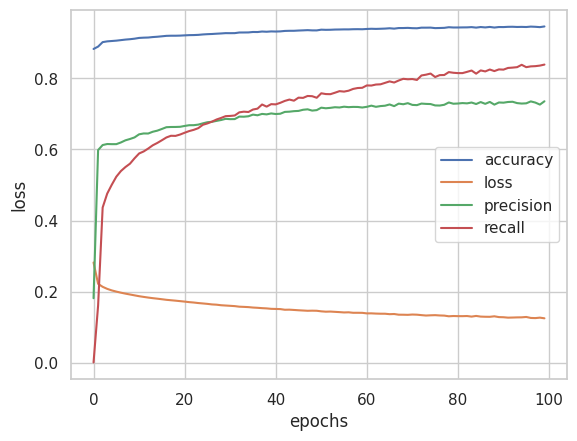

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(5, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.001,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 100)

Epoch 1/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 5s 4ms/step - accuracy: 0.8841 - loss: 0.4250 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8841 - loss: 0.3569 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8841 - loss: 0.3549 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8841 - loss: 0.3521 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8841 - loss: 0.3474 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 4ms/step - accuracy: 0.8841 - loss: 0.3382 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8841 - loss: 0.3201 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/100
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8841 - lo

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8996 - loss: 0.2198 - precision: 0.5821 - recall: 0.5394


[0.22069747745990753,
 0.9022946953773499,
 0.5899021029472351,
 0.5411152839660645]

In [ ]:
model.summary();

Model: "sequential_5"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_19 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_20 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_21 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_22 (Dense)                │ (None, 5)              │            80 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_23 (Dense)                │ (None, 1)              │             6 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,984 (19.47 KB)

 Trainable params: 2,491 (9.73 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,493 (9.74 KB)

Text(0.5, 0, 'epochs')

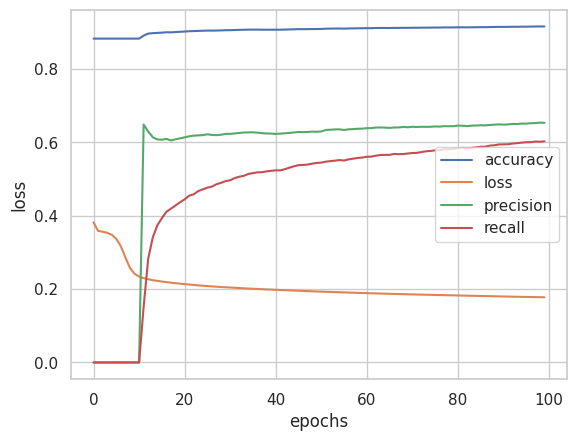

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.SGD(learning_rate=0.01,momentum=0.9),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 50)

Epoch 1/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8578 - loss: 0.4068 - precision: 0.1203 - recall: 0.0381
Epoch 2/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.8841 - loss: 0.2967 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8932 - loss: 0.2321 - precision: 0.5703 - recall: 0.1815
Epoch 4/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.9006 - loss: 0.2209 - precision: 0.6074 - recall: 0.3994
Epoch 5/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9010 - loss: 0.2143 - precision: 0.6021 - recall: 0.4274
Epoch 6/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9036 - loss: 0.2093 - precision: 0.6148 - recall: 0.4485
Epoch 7/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9050 - loss: 0.2046 - precision: 0.6201 - recall: 0.4629
Epoch 8/50
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.9067 - loss: 0.2010 - precision: 0.6274 - recall: 0.4799
Epoch 9/

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 1s 2ms/step - accuracy: 0.8978 - loss: 0.2365 - precision: 0.5746 - recall: 0.5341


[0.2444922924041748,
 0.8965440988540649,
 0.5617750883102417,
 0.5264649987220764]

In [ ]:
model.summary();

Model: "sequential_6"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_24 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_25 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_26 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_27 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 4,844 (18.93 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 2,423 (9.47 KB)

Text(0.5, 0, 'epochs')

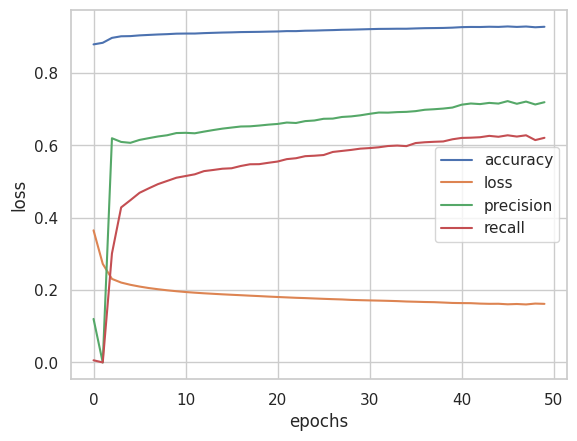

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='tanh'),
                            tf.keras.layers.Dense(15, activation='softmax'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 250)

Epoch 1/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 5s 3ms/step - accuracy: 0.8841 - loss: 0.5385 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 2/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8841 - loss: 0.3955 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 3/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8841 - loss: 0.3489 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 4/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8841 - loss: 0.3115 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 5/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8841 - loss: 0.2816 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 6/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 3ms/step - accuracy: 0.8841 - loss: 0.2611 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 7/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8841 - loss: 0.2487 - precision: 0.0000e+00 - recall: 0.0000e+00
Epoch 8/250
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8841 - lo

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8968 - loss: 0.2380 - precision: 0.5700 - recall: 0.5297


[0.2440425157546997,
 0.8970417380332947,
 0.5654639005661011,
 0.5184310078620911]

In [ ]:
model.summary();

Model: "sequential_7"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_28 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_29 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_30 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_31 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

Text(0.5, 0, 'epochs')

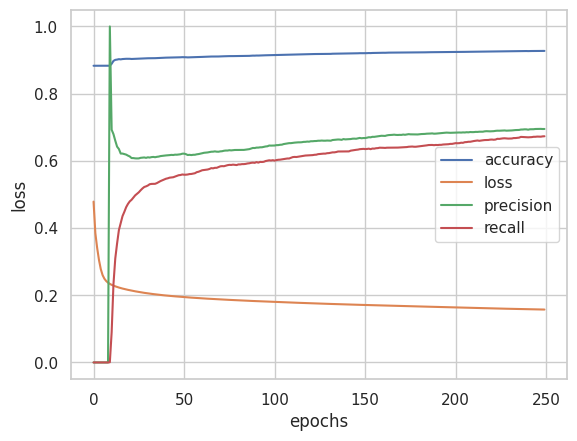

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")

In [ ]:
tf.random.set_seed(42)

# STEP1: Creating the model

model= tf.keras.Sequential([
                            tf.keras.layers.Dense(30, activation='relu'),
                            tf.keras.layers.Dense(20, activation='relu'),
                            tf.keras.layers.Dense(15, activation='relu'),
                            tf.keras.layers.Dense(1, activation='sigmoid')
])

# STEP2: Compiling the model

model.compile(loss= tf.keras.losses.binary_crossentropy,
              optimizer= tf.keras.optimizers.Adamax(learning_rate=0.0005),
              metrics= [tf.keras.metrics.BinaryAccuracy(name='accuracy'),
                        tf.keras.metrics.Precision(name='precision'),
                        tf.keras.metrics.Recall(name='recall')
              ]
              )

# STEP1: Fit the model

history= model.fit(x_train, y_train, epochs= 650)

Epoch 1/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 2ms/step - accuracy: 0.8737 - loss: 0.4426 - precision: 0.0569 - recall: 0.0060
Epoch 2/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8846 - loss: 0.3104 - precision: 0.4775 - recall: 0.0145
Epoch 3/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 4s 4ms/step - accuracy: 0.8915 - loss: 0.2618 - precision: 0.6110 - recall: 0.1706
Epoch 4/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 3ms/step - accuracy: 0.8967 - loss: 0.2365 - precision: 0.6018 - recall: 0.3192
Epoch 5/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9005 - loss: 0.2259 - precision: 0.6052 - recall: 0.4064
Epoch 6/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9022 - loss: 0.2206 - precision: 0.6083 - recall: 0.4367
Epoch 7/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.9030 - loss: 0.2172 - precision: 0.6093 - recall: 0.4525
Epoch 8/650
848/848 ━━━━━━━━━━━━━━━━━━━━ 3s 2ms/step - accuracy: 0.9036 - loss: 0.2146 - precision: 0.6113 - recall: 0.4612
Epoch 9/

In [ ]:
model.evaluate(x_test, y_test)

566/566 ━━━━━━━━━━━━━━━━━━━━ 2s 2ms/step - accuracy: 0.8917 - loss: 0.2933 - precision: 0.5483 - recall: 0.4881


[0.2936229109764099, 0.8930052518844604, 0.547012984752655, 0.4976370632648468]

In [ ]:
model.summary();

Model: "sequential_8"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ dense_32 (Dense)                │ (None, 30)             │         1,470 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_33 (Dense)                │ (None, 20)             │           620 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_34 (Dense)                │ (None, 15)             │           315 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_35 (Dense)                │ (None, 1)              │            16 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 7,265 (28.38 KB)

 Trainable params: 2,421 (9.46 KB)

 Non-trainable params: 0 (0.00 B)

 Optimizer params: 4,844 (18.93 KB)

In [ ]:
pd.DataFrame(history.history).plot()
plt.ylabel("loss")
plt.xlabel("epochs")